## Table of Contents
* [Introduction](#chapter1)
* [Overview](#chapter2)
* [History of Presidential election](#chapter3)
    * [Presidential election result since 1999](#section_3_1)
    * [Vote turn out since 1999](#section_3_2)
        * [Vote turn out by geopolitical zones in 2003](#sub_section_3_2_1)
        * [Vote turn out by geopolitical zones in 2019](#sub_section_3_2_2)
* [Twitter Analysis](#chapter4)
    * [Peter Obi](#section_4_1)
        * [The Numbers](#sub_section_4_1_1)
        * [Tweets per day](#sub_section_4_1_2)
        * [Most active tweeters](#sub_section_4_1_3)
        * [Top mentions](#sub_section_4_1_4)
        * [Top Locations](#sub_section_4_1_5)
        * [Top likes and retweets](#sub_section_4_1_8)
        * [Word Cloud](#sub_section_4_1_6)
        * [Sentiments](#sub_section_4_1_7)
        * [Dashboard](#sub_section_4_1_9)
    * [Atiku Abubakar](#section_4_2)
        * [The Numbers](#sub_section_4_2_1)
        * [Tweets per day](#sub_section_4_2_2)
        * [Most active tweeters](#sub_section_4_2_3)
        * [Top mentions](#sub_section_4_2_4)
        * [Top Locations](#sub_section_4_2_5)
        * [Top likes and retweets](#sub_section_4_2_8)
        * [Word Cloud](#sub_section_4_2_6)
        * [Sentiments](#sub_section_4_2_7)
        * [Dashboard](#sub_section_4_2_9)
    * [Bola Ahmed Tinubu](#section_4_3)
        * [The Numbers](#sub_section_4_3_1)
        * [Tweets per day](#sub_section_4_3_2)
        * [Most active tweeters](#sub_section_4_3_3)
        * [Top mentions](#sub_section_4_3_4)
        * [Top Locations](#sub_section_4_3_5)
        * [Top likes and retweets](#sub_section_4_3_8)
        * [Word Cloud](#sub_section_4_3_6)
        * [Sentiments](#sub_section_4_3_7)
        * [Dashboard](#sub_section_4_2_9)
* [Google Trends Analysis](#chapter5)
    * [Nigeria Trend](#section_5_1)
    * [Global Trend](#section_5_2)
* [Conclusion](#chapter6)
    * [Historical Data](#section_6_1)
    * [Twitter](#section_6_2)
    * [Google Trend](#section_6_3)
    * [Country's Engagement](#section_6_4)


## Introduction <a class="anchor" id="chapter1"></a>
> Nigeria fully transitioned into democratic system of government in 1999 and has since conducted six general elections. However, the 2023 upcoming presidential elections looks to be the most anticipated and might just be the most keenly contested in its 23 years democatric history.

> Since the conclusion of presidential primaries and the declaration of presidential aspirants across various parties, there has been a lot of comment, campaign on and off the social media, as nigeria have begin to declare support for their prefered candidate. Presidential candidates such as Atiku Abubakar(2 term Vice President of Nigeria), Peter Obi (Former Governor of Anambra State) and Bola Ahmed Tinubu(Former Governor of Lagos State ) have made headlines and seem to be the front runners for the apex seat in Nigeria.

> We collected data from wikipedia, inec official website, twitter, e.t.c to explore the history of nigeria election and what people are saying about their preferred candidate.

## Overview <a class="anchor" id="chapter2"></a>

> The analysis is based on what people did (historical data), what people are saying(Twitter) and what people are curious about (google search)

> Data was gathered from different sources and platforms online such as wikipedia, inec official website, twitter, google, e.t.c. Apart from the historical data, the time range for the analysis was between July 1 2022 to October 19 2022.

- Note: While this analysis is not a total representation of of people are saying, but a worthy sample.
- Important: This analysis is/should not be used as a political tool for/or against any candidates.


In [1]:
# import libraries

import pandas as pd 
import matplotlib.pyplot as plt
import re
import seaborn as sb
from nltk.tokenize import sent_tokenize, word_tokenize
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from wordcloud import WordCloud
from textblob import TextBlob
import snscrape.modules.twitter as sntwitter

[nltk_data] Error loading stopwords: <urlopen error [Errno 11001]
[nltk_data]     getaddrinfo failed>


In [2]:
presidents = pd.read_excel('election.xlsx', sheet_name='winners')
overall = pd.read_excel('election.xlsx', sheet_name='overall')
result_2019 = pd.read_excel('election.xlsx', sheet_name='2019')
result_2015 = pd.read_excel('election.xlsx', sheet_name='2015')
result_2003 = pd.read_excel('election.xlsx', sheet_name='2003')

## History of Presidential Election <a class="anchor" id="chapter3"></a>
### objectives 

1. Election result since 1999
2. vote turn out since 1999
3. vote turnout by region in 2003 and 2019

In [494]:
presidents.head()

,Year,Name,vote,Percentage win,Party,Region
0,1999,Olusegun Obasanjo,18738154,0.6278,PDP,South west
1,2003,Olusegun Obasanjo,24456140,0.6194,PDP,South west
2,2007,Umaru Yar'Adua,24638063,0.6960,PDP,North west
3,2011,Goodluck Jonathan,22495187,0.5887,PDP,South south
4,2015,Muhammadu Buhari,15424921,0.5396,APC,North west


In [495]:
presidents.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6 entries, 0 to 5
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Year             6 non-null      int64  
 1   Name             6 non-null      object 
 2   vote             6 non-null      int64  
 3   Percentage win   6 non-null      float64
 4   Party            6 non-null      object 
 5   Region           6 non-null      object 
dtypes: float64(1), int64(2), object(3)
memory usage: 416.0+ bytes


In [496]:
presidents['Year']=presidents['Year'].astype(str)

In [497]:
presidents.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6 entries, 0 to 5
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Year             6 non-null      object 
 1   Name             6 non-null      object 
 2   vote             6 non-null      int64  
 3   Percentage win   6 non-null      float64
 4   Party            6 non-null      object 
 5   Region           6 non-null      object 
dtypes: float64(1), int64(1), object(4)
memory usage: 416.0+ bytes


### Presidential election result since 1999 <a class="anchor" id="section_3_1"></a>

> The battle for the apex seat has been between 2 political parties and has witnessed winners from all regions asides the south east and the north east

In [498]:
presidents

,Year,Name,vote,Percentage win,Party,Region
0,1999,Olusegun Obasanjo,18738154,0.6278,PDP,South west
1,2003,Olusegun Obasanjo,24456140,0.6194,PDP,South west
2,2007,Umaru Yar'Adua,24638063,0.6960,PDP,North west
3,2011,Goodluck Jonathan,22495187,0.5887,PDP,South south
4,2015,Muhammadu Buhari,15424921,0.5396,APC,North west
5,2019,Muhammadu Buhari,15191847,0.5560,APC,North west


In [499]:
overall

,Year,Voter\nTurnout,Total\nvote,Registration,VAP\nTurnout,Voting\nage\npopulation,Population,Invalid\nvotes
0,2019,0.3475,28614190,82344107,0.2687,106490312,208679114,0.0451
1,2015,0.4365,29432083,67422005,0.3211,91669312,181562056,0.0287
2,2011,0.5368,39469484,73528040,0.4832,81691751,155215573,0.0319
3,2007,0.5749,35397517,61567036,0.4985,71004507,131859731,NaN
4,2003,0.6908,42018735,60823022,0.6533,64319246,129934911,0.0600
5,1999,0.5226,30280052,57938945,0.5736,52792781,108258359,0.0140


In [500]:
overall.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6 entries, 0 to 5
Data columns (total 8 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Year                   6 non-null      int64  
 1   Voter
Turnout          6 non-null      float64
 2   Total
vote             6 non-null      int64  
 3   Registration           6 non-null      int64  
 4   VAP
Turnout            6 non-null      float64
 5   Voting
age
population  6 non-null      int64  
 6   Population             6 non-null      int64  
 7   Invalid
votes          5 non-null      float64
dtypes: float64(3), int64(5)
memory usage: 512.0 bytes


In [3]:
overall['Year']=overall['Year'].astype(str)

### Vote turn out since 1999 <a class="anchor" id="section_3_2"></a>

> The highest turn out of voters was in 2003 while the lowest turn out was in 2019. Lets dig deeper and see the turn out by geopolitical zones in these peak and low years

In [4]:
overall

,Year,Voter\nTurnout,Total\nvote,Registration,VAP\nTurnout,Voting\nage\npopulation,Population,Invalid\nvotes
0,2019,0.3475,28614190,82344107,0.2687,106490312,208679114,0.0451
1,2015,0.4365,29432083,67422005,0.3211,91669312,181562056,0.0287
2,2011,0.5368,39469484,73528040,0.4832,81691751,155215573,0.0319
3,2007,0.5749,35397517,61567036,0.4985,71004507,131859731,NaN
4,2003,0.6908,42018735,60823022,0.6533,64319246,129934911,0.0600
5,1999,0.5226,30280052,57938945,0.5736,52792781,108258359,0.0140


In [5]:
#for season of the year
state = list(result_2003['State'])
zone = ['South east', 'North east', 'South south', 'South east', 'North east', 'South south', 'North central', 'North east',
         'South south', 'South south', 'South east', 'South south', 'South west', 'South east', 'North east', 'South east',
         'North west', 'North west', 'North west', 'North west', 'North west', 'North central', 'North central',
         'South west', 'North central', 'North central', 'South west', 'South west', 'South west', 'South west',
         'North central', 'South south', 'North west', 'North east', 'North east', 'North west', 'North central']
#map each months to its corresponding season
state_to_zone = dict(zip(state, zone))         
result_2003['zone'] = result_2003['State'].map(state_to_zone)

In [6]:
result_2003

,State,Registered Voters,accredited votes,valid votes,Buhari,Obasanjo,Ojukwu,others,vote turn out,invalid percentage,zone
0,Abia,1285428,769167,748034,84305,386748,260899,16082,0.598374,0.598374,South east
1,Adamawa,1280204,994033,955847,285151,660780,2352,7564,0.776465,0.776465,North east
2,Akwa Ibom,1624495,1308326,1292395,162542,1084574,1077,44202,0.805374,0.805374,South south
3,Anambra,1859795,897245,862193,79476,466866,279378,36473,0.482443,0.482443,South east
4,Bauchi,2130557,1739506,1680542,1043442,617291,1678,18131,0.816456,0.816456,North east
5,Bayelsa,765472,742917,738165,18344,708312,3,11506,0.970535,0.970535,South south
6,Benue,1755528,1248897,1213843,494804,662422,6731,49886,0.711408,0.711408,North central
7,Borno,2156019,1336480,1120152,727595,380875,3549,8133,0.619883,0.619883,North east
8,Cross River,1289192,1238175,1233321,11624,1207675,2112,11910,0.960427,0.960427,South south
9,Delta,1607337,1171867,1142622,27492,1072527,15062,27541,0.729074,0.729074,South south


In [7]:
result_2003['zone'].unique()

array(['South east', 'North east', 'South south', 'North central',
       'South west', 'North west'], dtype=object)

In [8]:
result_2003.columns

Index(['State', 'Registered Voters ', 'accredited votes ', 'valid votes',
       'Buhari', 'Obasanjo', 'Ojukwu', 'others', 'vote turn out ',
       'invalid percentage ', 'zone'],
      dtype='object')

#### Vote turn out by geopolitical zones in 2003 <a class="anchor" id="sub_section_3_2_1"></a>

> Despite having a major presidential candidate from its region (Olusegun Obasanjo), south west had the lowest vote turn out, followed by the south east

In [9]:
vote_per_region_2003=result_2003.groupby('zone').mean()[['vote turn out ', 'valid votes', 'Registered Voters ']]
#print(result_2003.groupby('zone').mean()['valid votes'])
vote_per_region_2003=vote_per_region_2003.reset_index()

In [10]:
def x_y_t(xaxis, yaxis, title):
    #this function contains graph titles
    plt.xlabel(xaxis)
    plt.ylabel(yaxis)
    plt.title(title)

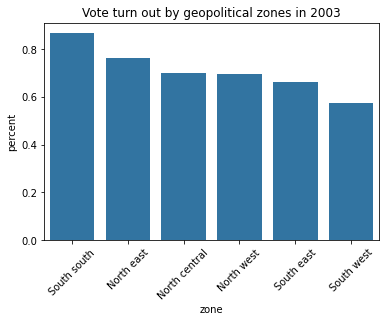

In [21]:
default_color = sb.color_palette()[0]
sb.barplot(data = vote_per_region_2003.sort_values(by=['vote turn out '], ascending=False),
           x='zone', y='vote turn out ', color = default_color)
x_y_t('zone', 'percent', 'Vote turn out by geopolitical zones in 2003')
plt.xticks(rotation=45);

In [22]:
#for season of the year
state = list(result_2019['State'])
zone = ['South east', 'North east', 'South south', 'South east', 'North east', 'South south', 'North central', 'North east',
         'South south', 'South south', 'South east', 'South south', 'South west', 'South east', 'North east', 'South east',
         'North west', 'North west', 'North west', 'North west', 'North west', 'North central', 'North central',
         'South west', 'North central', 'North central', 'South west', 'South west', 'South west', 'South west',
         'North central', 'South south', 'North west', 'North east', 'North east', 'North west', 'North central']
#map each months to its corresponding season
state_to_zone = dict(zip(state, zone))         
result_2019['zone'] = result_2019['State'].map(state_to_zone)

#### Vote turn out by geopolitical zones in 2019<a class="anchor" id="sub_section_3_2_2"></a>

> The turn out in all southern zones is extremely low, particulary in the south east.

In [23]:
vote_per_region_2019=result_2019.groupby('zone').mean()[['vote turn out ', 'valid votes', 'Registered Voters ']]
vote_per_region_2019=vote_per_region_2019.reset_index()

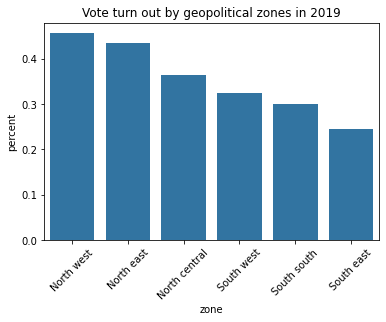

In [25]:
default_color = sb.color_palette()[0]
sb.barplot(data = vote_per_region_2019.sort_values(by=['vote turn out '], ascending=False),
           x='zone', y='vote turn out ', color = default_color)
x_y_t('zone', 'percent', 'Vote turn out by geopolitical zones in 2019')
plt.xticks(rotation=45);

In [26]:
vote_per_region_2003

,zone,vote turn out,valid votes,Registered Voters
0,North central,0.697357,8.108866e+05,1.198543e+06
1,North east,0.762888,1.039646e+06,1.470628e+06
2,North west,0.694785,1.377682e+06,2.165885e+06
3,South east,0.661182,9.100558e+05,1.451606e+06
4,South south,0.866903,1.278908e+06,1.498604e+06
5,South west,0.574732,9.498178e+05,2.033101e+06


In [27]:
vote_per_region_2019

,zone,vote turn out,valid votes,Registered Voters
0,North central,0.364775,6.573033e+05,1.909439e+06
1,North east,0.434200,7.636787e+05,1.881549e+06
2,North west,0.456349,1.203341e+06,2.879729e+06
3,South east,0.244383,4.441512e+05,2.011426e+06
4,South south,0.300148,5.591802e+05,2.140213e+06
5,South west,0.324726,6.903603e+05,2.715369e+06


In [28]:
vote_per_region_2003['year']='2003'
vote_per_region_2019['year']='2019'



result = pd.concat([vote_per_region_2003, vote_per_region_2019])

In [29]:
result

,zone,vote turn out,valid votes,Registered Voters,year
0,North central,0.697357,8.108866e+05,1.198543e+06,2003
1,North east,0.762888,1.039646e+06,1.470628e+06,2003
2,North west,0.694785,1.377682e+06,2.165885e+06,2003
3,South east,0.661182,9.100558e+05,1.451606e+06,2003
4,South south,0.866903,1.278908e+06,1.498604e+06,2003
5,South west,0.574732,9.498178e+05,2.033101e+06,2003
0,North central,0.364775,6.573033e+05,1.909439e+06,2019
1,North east,0.434200,7.636787e+05,1.881549e+06,2019
2,North west,0.456349,1.203341e+06,2.879729e+06,2019
3,South east,0.244383,4.441512e+05,2.011426e+06,2019


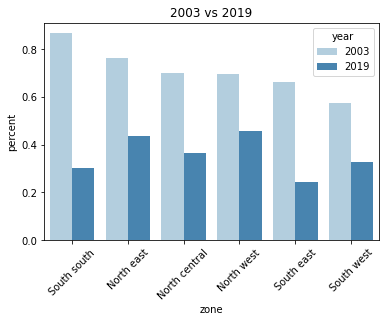

In [30]:
default_color = sb.color_palette()[0]
sb.barplot(data = result.sort_values(by=['vote turn out '], ascending=False), y='vote turn out ',
           x = 'zone', hue='year', palette = 'Blues');
x_y_t('zone', 'percent', '2003 vs 2019')
plt.xticks(rotation=45);

## Twitter Analysis <a class="anchor" id="chapter4"></a>

> Twitter data was collected using the term associated with the support for each candidate. For instance supporters of Atiku Abubakar are identified as 'Atikulated', Peter Obi 'Obidients' and Bola Ahmed Tinubu 'Batified'.

> The twitter analysis is not a comparative analysis but an exploratory analysis of individual candidates to anwser questions such as; 


1. The Numbers (count of tweets, likes, and retweets)
2. Tweets per day 
3. Most Acrive tweeters
4. Top mentions
5. Top Locations
6. What are people tweeting (Word Cloud)
7. What are the emotions of people (Sentiment analysis)

In [ ]:

# Creating list to append tweet data to
attributes_container = []

#peter obi
# Using TwitterSearchScraper to scrape data and append tweets to list
for tweet in sntwitter.TwitterSearchScraper('obidient since:2022-07-01 until:2022-10-20').get_items():
    attributes_container.append([tweet.user.username, tweet.date, tweet.user.location, tweet.user.followersCount,
                                 tweet.likeCount, tweet.retweetCount, tweet.content])

# Creating a dataframe to load the list
obi_df = pd.DataFrame(attributes_container, columns=["User", "Date Created", 'location','followers',
                                                        "Likes", 'retweet', "Tweet"])

# Creating list to append tweet data to
attributes_container = []

#Atiku Abubakar
# Using TwitterSearchScraper to scrape data and append tweets to list
for tweet in sntwitter.TwitterSearchScraper('atikulated since:2022-07-01 until:2022-10-20').get_items():
    attributes_container.append([tweet.user.username, tweet.date, tweet.user.location, tweet.user.followersCount,
                                 tweet.likeCount, tweet.retweetCount, tweet.content])

# Creating a dataframe to load the list
atiku_df = pd.DataFrame(attributes_container, columns=["User", "Date Created", 'location','followers',
                                                        "Likes", 'retweet', "Tweet"])

# Creating list to append tweet data to
attributes_container = []


#Bola Tinubu
# Using TwitterSearchScraper to scrape data and append tweets to list
for tweet in sntwitter.TwitterSearchScraper('batified since:2022-07-01 until:2022-10-20').get_items():
    attributes_container.append([tweet.user.username, tweet.date, tweet.user.location, tweet.user.followersCount,
                                 tweet.likeCount, tweet.retweetCount, tweet.content])

# Creating a dataframe to load the list
bat_df = pd.DataFrame(attributes_container, columns=["User", "Date Created", 'location','followers',
                                                        "Likes", 'retweet', "Tweet"])


# Saving the master dataset to a csv file
obi_df.to_csv("obidient.csv", index=False)
atiku_df.to_csv("atikulted.csv", index=False)
bat_df.to_csv("batified.csv", index=False)


### Peter Obi <a class="anchor" id="section_4_1"></a>

In [31]:
obi_df=pd.read_csv('obidient.csv')

In [8]:
#Access the data

In [9]:
obi_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 346359 entries, 0 to 346358
Data columns (total 7 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   User          346359 non-null  object
 1   Date Created  346359 non-null  object
 2   location      227192 non-null  object
 3   followers     346359 non-null  int64 
 4   Likes         346359 non-null  int64 
 5   retweet       346359 non-null  int64 
 6   Tweet         346359 non-null  object
dtypes: int64(3), object(4)
memory usage: 18.5+ MB


In [10]:
obi_df.describe()

,followers,Likes,retweet
count,3.463590e+05,346359.000000,346359.000000
mean,4.314556e+03,22.727898,6.701879
std,7.919663e+04,375.856667,108.879422
min,0.000000e+00,0.000000,0.000000
25%,7.900000e+01,0.000000,0.000000
50%,3.220000e+02,1.000000,0.000000
75%,1.179000e+03,2.000000,0.000000
max,5.962324e+06,62107.000000,17233.000000


In [11]:
obi_df.duplicated().sum()

5

In [12]:
obi_df[obi_df.duplicated()]

,User,Date Created,location,followers,Likes,retweet,Tweet
80303,Kembox,2022-10-02 12:16:17+00:00,"Abuja, Nigeria",1062,0,0,@iambabatope How can you be Obidient and be me...
120578,AsinyemN,2022-09-23 13:15:26+00:00,NaN,851,2,0,@learned_baba @PeterObi @NgLabour @ChigozieIAl...
147280,awaitingdgroom,2022-09-10 13:11:35+00:00,NaN,31,0,0,@Pezroyal2 @SaharaReporters I don pass obidien...
316543,ikobily,2022-07-08 22:24:54+00:00,abuja nigeria,250,0,0,@lindaikeji Waten concern us we are obidient B...
331136,ChukwudiPromis7,2022-07-05 20:02:42+00:00,Lagos state Nigeria,103,0,0,@realFemiOtedola @officialABAT Time you suppos...


In [13]:
obi_df['Tweet'][9080]

'@phranqz @MarineSege @drealOlomo @adamugarba What he said is correct, you people are just making it hard to support po'

In [14]:
obi_df.isna().sum()

User                 0
Date Created         0
location        119167
followers            0
Likes                0
retweet              0
Tweet                0
dtype: int64

In [15]:
obi_df[obi_df.duplicated(keep='first')]

,User,Date Created,location,followers,Likes,retweet,Tweet
80303,Kembox,2022-10-02 12:16:17+00:00,"Abuja, Nigeria",1062,0,0,@iambabatope How can you be Obidient and be me...
120578,AsinyemN,2022-09-23 13:15:26+00:00,NaN,851,2,0,@learned_baba @PeterObi @NgLabour @ChigozieIAl...
147280,awaitingdgroom,2022-09-10 13:11:35+00:00,NaN,31,0,0,@Pezroyal2 @SaharaReporters I don pass obidien...
316543,ikobily,2022-07-08 22:24:54+00:00,abuja nigeria,250,0,0,@lindaikeji Waten concern us we are obidient B...
331136,ChukwudiPromis7,2022-07-05 20:02:42+00:00,Lagos state Nigeria,103,0,0,@realFemiOtedola @officialABAT Time you suppos...


In [16]:
obi_df['location'].nunique()

15427

### Quality issues

1. Remove duplicates

2. Erroneous data type (Date Created column should be string instead of datetime)

3. convert Tweet text to lower case 

4. Since the search is by keyword Remove keyword (obidient) from the tweet text in ordernot to get biased word cloud.

5. Remove RT, hashtags, hyperlinks , @ and all punctuation for sentiment analysis

6. Apply tokeniztion on Tweet column



### Tidiness issues


1. location should be split the the seperating delimeter 

2. location has 6238 distinct location, should be investigated

In [32]:
# Make a copy of original pieces of data
copy1=obi_df.copy()

In [33]:
# drop duplicates
copy1.drop_duplicates(keep='first', inplace =True)

In [34]:
# convert date created column to datetime

copy1['Date Created'] = pd.to_datetime(copy1['Date Created'])


In [35]:
#convert text to lower case
copy1['tweet']=copy1['Tweet'].str.lower()

In [36]:
#Clean the text 

#Create a function to clean the tweets

def cleanTxt(text):
    
    #Remove keyword
    text=re.sub(r'obidient', '', text) 
    #Remove @mentions
    text=re.sub(r'@[A-Za-z0-9]+', '', text) 
    #Remove hashtags
    text=re.sub(r'#', '', text) 
    #Remove underscores
    text=re.sub(r'_', '', text) 
    #Remove retweets
    text=re.sub(r'RT[\s]+', '', text) 
    #Remove hyperlinks
    text=re.sub(r'https?:\/\/\S+', '', text) 
    #Remove punctuations
    text=re.sub(r'[^\w\s]', '', text)
    
    return text

copy1['tweet']=copy1['tweet'].apply(cleanTxt)

In [37]:
# Tokenization 
nltk.download('punkt')

#tokenize 
copy1['tweet'] = copy1.apply(lambda row: nltk.word_tokenize(row['tweet']), axis=1)

[nltk_data] Error loading punkt: <urlopen error [Errno 11001]
[nltk_data]     getaddrinfo failed>


In [38]:
#stop words 
stop = stopwords.words('english')

copy1['tweet'] = copy1['tweet'].apply(lambda x: [item for item in x if item not in stop])

In [25]:
#location cleaning 
copy1_location= copy1.assign(location=copy1['location'].str.split(' /|;|,.')).explode('location')  

In [26]:
# mention cleaning
def find_at_word(text):
    word=re.findall(r'(?<=@)\w+',text)
    return " ".join(word)

copy1['mentions']=copy1['Tweet'].apply(lambda x: find_at_word(x))

copy1_mentions= copy1.assign(mentions=copy1['mentions'].str.split(' /|;|,.')).explode('mentions')  


#### The Numbers <a class="anchor" id="sub_section_4_1_1"></a>

> 346,354 tweets contained the keyword obidient, gathered a total of 7,872,010 likes and 2,321,256 retweets.

In [155]:


#Numbers 
tweets=copy1.shape[0]
likes=sum(copy1['Likes'])
retweets=sum(copy1['retweet'])

print('Number of tweets = ' ,tweets)
print('Number of likes = ',likes,)
print('Number of retweets = ' ,retweets)

Number of tweets =  346354
Number of likes =  7872010
Number of retweets =  2321256


In [27]:
### Most liked tweet

copy1.sort_values(by=['Likes'], ascending=False)[:2]

,User,Date Created,location,followers,Likes,retweet,Tweet,tweet,mentions
240589,PeterObi,2022-08-07 15:07:11+00:00,Nigeria,2303614,62107,15611,I am sincerely encouraged by the unwavering co...,"[sincerely, encouraged, unwavering, commitment...",
216871,PeterObi,2022-08-14 15:52:10+00:00,Nigeria,2303581,57502,12971,To the millions of young people in our country...,"[millions, young, people, country, continued, ...",


In [29]:
copy1['Tweet'][240589]

'I am sincerely encouraged by the unwavering commitment of Nigerian youths to the OBIdient movement, aimed at rescuing the nation from bad governance. https://t.co/J4JSW8ZzwK'

In [30]:
### Most retweeted

copy1.sort_values(by=['retweet'], ascending=False)[:2]

,User,Date Created,location,followers,Likes,retweet,Tweet,tweet,mentions
96185,PeterObi,2022-09-30 17:09:39+00:00,Nigeria,2302943,43199,17233,"I invite every member of the OBIdient Family, ...","[invite, every, member, family, every, support...",
240589,PeterObi,2022-08-07 15:07:11+00:00,Nigeria,2303614,62107,15611,I am sincerely encouraged by the unwavering co...,"[sincerely, encouraged, unwavering, commitment...",


In [32]:
copy1['Tweet'][96185]

'I invite every member of the OBIdient Family, and every supporter of our march to a new Nigeria to visit the official campaign website for the Obi-Datti Campaign organisation: https://t.co/DaRC8ifOLH . Enjoy the Navigation -PO'

#### Tweets per day <a class="anchor" id="sub_section_4_1_2"></a>

> Within the duration of the tweets collected, number of tweets peaked in october, particulary on the 1st of october, which also happens to be the day of independence in nigeria

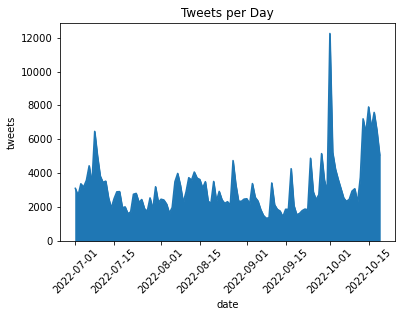

In [40]:
#Tweets per day 
tweets_per_day = copy1.groupby([copy1['Date Created'].dt.date])['Tweet'].count()
tweets_per_day.plot(kind='area')
plt.xticks(rotation=45);
x_y_t('date', 'tweets', 'Tweets per Day')
#tweets_per_day.to_csv("obi_tweets_per_day.csv", index=False)

#### Most active tweeters <a class="anchor" id="sub_section_4_1_3"></a>

> Evidently obidient_child and SPeculiarbreed have tweeted the most

In [41]:
#Most active tweeters
active_tweeters = copy1.groupby([copy1['User']])['Tweet'].count()
active_tweeters=active_tweeters.reset_index()

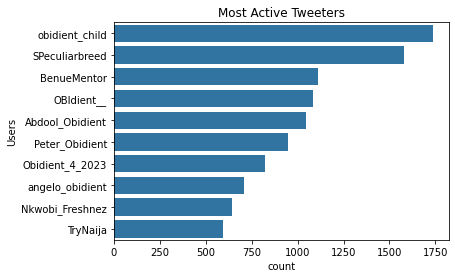

In [42]:
default_color = sb.color_palette()[0]
sb.barplot(data = active_tweeters.sort_values(by=['Tweet'], ascending=False)[:10], y='User', x='Tweet', color = default_color)
x_y_t('count', 'Users', 'Most Active Tweeters')

In [405]:
copy1_mentions

,User,Date Created,location,followers,Likes,retweet,Tweet,tweet,mentions
0,Doughnotman,2022-10-19 23:59:46+00:00,Wakanda,627,1,0,@ysone2 Is Bashir Obidient?,[bashir],ysone2
1,BenueMentor,2022-10-19 23:58:37+00:00,"Lagos, Nigeria",3249,0,0,@suleimanwillia2 @ObianaPhydatti @Aminaruk @ru...,[],suleimanwillia2 ObianaPhydatti Aminaruk ruffyd...
2,LadyXan_,2022-10-19 23:58:30+00:00,NaN,636,3,0,@joypopins Focus on Phyna and pay no attention...,"[focus, phyna, pay, attention, shippers, cant,...",joypopins
3,TryNaija,2022-10-19 23:58:23+00:00,lagos,834,0,0,Igwe Pope bags honorary award in Ghana – Guard...,"[igwe, pope, bags, honorary, award, ghana, gua...",
4,DJKella_,2022-10-19 23:58:10+00:00,Nigeria,4901,7,0,@tha_dhrey @DaniiUloko What is wrong with you?...,"[dhrey, wrong, dont, want, laugh, please, pict...",tha_dhrey DaniiUloko
...,...,...,...,...,...,...,...,...,...
346354,BelieveViktor,2022-07-01 00:05:41+00:00,NaN,25,2,0,@AfamDeluxo See as Hausa man they speak Igbo b...,"[see, hausa, man, speak, igbo, tah, must, go, ...",AfamDeluxo
346355,davisonude5,2022-07-01 00:05:41+00:00,NaN,18,1,0,This is wonderful \nAlways OBIDIENT \n#PeterOb...,"[wonderful, always, peterobi4president2023]",
346356,madona1996,2022-07-01 00:03:44+00:00,Nigeria,6474,1,0,This is the best statement Osinbajo is making ...,"[best, statement, osinbajo, making, since, joi...",
346357,MichaelOkwegba,2022-07-01 00:02:00+00:00,NaN,2063,8,1,Give them time to be obidient for a while. htt...,"[give, time]",


#### Top Mentions <a class="anchor" id="sub_section_4_1_4"></a>

> Despite being an Atiku supporter renoomokri had the most mention


In [43]:
copy1['mentions']=copy1.Tweet.str.findall(r'(?<![@\w])@(\w{1,25})').apply(','.join)

In [44]:
copy1_mentions= copy1.assign(mentions=copy1['mentions'].str.split(',')).explode('mentions')  

In [45]:
top_mentions = copy1_mentions.groupby([copy1_mentions['mentions']])['Tweet'].count()
top_mentions=top_mentions.reset_index()

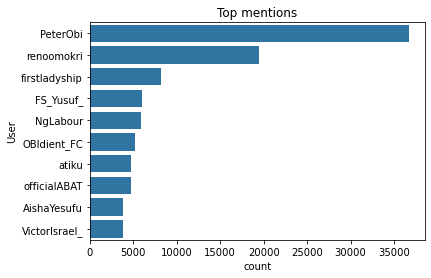

In [46]:
default_color = sb.color_palette()[0]
sb.barplot(data = top_mentions.sort_values(by=['Tweet'], ascending=False)[1:11], y='mentions', x='Tweet', color = default_color)
x_y_t('count', 'User', 'Top mentions')

#### Top Locations <a class="anchor" id="sub_section_4_1_5"></a>
> Lagos and Abuja lead the chart for where most users are tweeting from, obidients also attracted tweets from countries outside the shore particulary UK and USA. However there is no single representation of users from the northeast and northwest from the top 10.


In [47]:
#location cleaning 
copy1_location= copy1.assign(location=copy1['location'].str.split(' /|;|,.')).explode('location')  
top_location = copy1_location.groupby([copy1_location['location']])['location'].count()

In [48]:
top_location = {'location': ['Lagos', 'Abuja', 'Port Harcourt','United Kingdom', 'Enugu',  'USA', 'Ibadan', 'Owerri', 'Calabar', 'Jos'],
        'count': [(41735+1725), (13955+4398) , 4551 , (2864+1654+1281) , 3124 , 1839 , 1794, 1627, 1297, 1239 ]}  
  
# Create DataFrame  
df = pd.DataFrame(top_location)
df

,location,count
0,Lagos,43460
1,Abuja,18353
2,Port Harcourt,4551
3,United Kingdom,5799
4,Enugu,3124
5,USA,1839
6,Ibadan,1794
7,Owerri,1627
8,Calabar,1297
9,Jos,1239


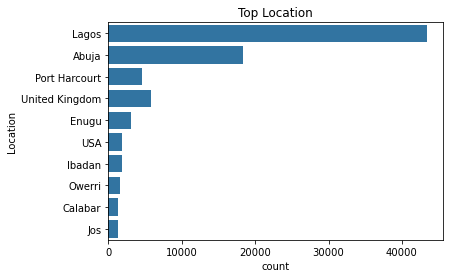

In [49]:
default_color = sb.color_palette()[0]
sb.barplot(data =df, y='location', x='count', color = default_color)
x_y_t('count', 'Location', 'Top Location')

#### Top likes and retweets <a class="anchor" id="sub_section_4_1_8"></a>

This wil include the image of most liked tweets and most retweeted tweet

#### Word cloud <a class="anchor" id="sub_section_4_1_6"></a>

> Below shows what peeople are saying.


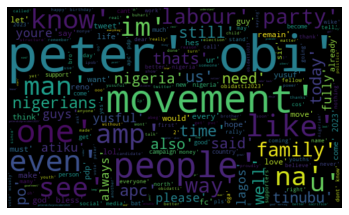

In [163]:
allWords = ' '.join([str(twts) for twts in copy1['tweet']])
wordCloud=WordCloud(width = 500, height=300,max_font_size=119).generate(allWords)

plt.imshow(wordCloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [50]:
#Create a function to get the subjectivity
def getSubjectivity(text):
    return TextBlob(text).sentiment.subjectivity

#Create a function to get the polarity
def getPolarity(text):
    return TextBlob(text).sentiment.polarity

#Create two new columns
copy1['subjectivity']=copy1['tweet'].apply(lambda x: getSubjectivity(' '.join(x)))
copy1['polarity']=copy1['tweet'].apply(lambda x: getPolarity(' '.join(x)))

In [51]:
def get_tweet_sentiment(score): 
    '''Utility function to classify sentiment of passed tweet using textblob's sentiment method'''
    # create TextBlob object of passed tweet text 
   # analysis = TextBlob(tweet) 
    
    # set sentiment 
    if score > 0:
        return 'positive'
    elif score == 0: 
        return 'neutral'
    else: 
        return 'negative'
    
copy1['sentiment'] = copy1['polarity'].apply(get_tweet_sentiment)

#### Sentiments <a class="anchor" id="sub_section_4_1_7"></a>

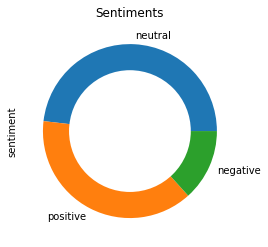

In [52]:
# Pie Chart
copy1['sentiment'].value_counts().plot(kind='pie')
  
# draw circle
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
fig = plt.gcf()
  
# Adding Circle in Pie chart
fig.gca().add_artist(centre_circle)
  
# Adding Title of chart
plt.title('Sentiments')
  
# Displaying Chart
plt.show()

In [167]:
#print positive tweets
j=1
sortedDF = copy1.sort_values(by=['polarity'])
for i in range(0, sortedDF.shape[0]):
    if(sortedDF['sentiment'][i]=='positive'):
        print(str(j) + ') ' +sortedDF['Tweet'][i])
        print()
        j=j+1

1) @joypopins Focus on Phyna and pay no attention to shippers. We can't keep on dictating for people on how to live their lives or behaviour while chasing the rest away. Please learn to respect others and focus on your focus.

2) @Qdpaper3 Get your money up then. Cos as you open,we report. 
Good luck 👍🏽

3) @vanguardngrnews "Taking the Governor’s permission one last time". What A Time to Be Alive and ObidienT✊🏿

4) @RayToluAyo Let everyone vote who dey seem fit but today is not all about Apc,Pdp,Lp,Nnpc, 2 day is about those who lost der life for a fight for a better nation.  2moro we continue to let dem see d reason we are obidient 🙏🏿😌

5) @T_akinpade @Spotlight_Abby LOWEST LIFE CLOWNS FULL THERE 💔💔💔😂😂😂😂

6) -Firstly, I mobilized 6 persons from my neighborhood who don’t ‘care’ about Politics in 9ja to apply for PVC as first timers.

-Months later, We’ve gotten our Voter’s Card and PO has our votes.

-Another is, I designed this for PO as an #Obidient citizen.

#DoSomething4PeterObi ht

564) @adeyanjudeji OBIDIENT if you’re in this comment section and you’re seeing this, PLEASED DO NOT ENGAGE ANY ADEYANJU’S TWEET… GOD BLESS YOU!🙏🏽

565) Wooow this is so creative.  Kudos @emixjaymusic 

#endsars #LekkiMassacre #EndSARSMemorial2 https://t.co/wGGVpYdve8

566) @FS_Yusuf_ @SavvyRinu Biko should that make us not vote for Obi? 😂😂😂 foolish desperation that will strengthen our resolve.If una kuku like each other go on soun. Our 2nd KPI after putting PO in Aso Rock is to couple as many ObiDients as possible. Plenty ObiDient weddings &amp; ObiDient children 💃🏽💃🏽💃🏽

567) @NIConfessions Stand strong! You’ll get through this one way or the other someday

568) @DailyPostNGR That means you will not deliver oo, you better focus and do your own thing. PDP at federal level will never happen.

569) @Nateikb Far as the EPL is concerned, NO ONE comes close. Its joyous watching Partey boss the midfield game-in-game-out

570) @BashirAhmaad If i see good thing,i dey talk am.this is good from 

1208) @ArtDailyPost Impressive

1209) @abikedabiri Obidient is her greatest nightmare  ,

1210) @Preshluxuries2 Cool stuff

1211) @zamani281 Lol

1212) @Code_Rred @JijiNigeria Lol

1213) Do whatever you deem necessary for the mobilization of new members into the #obidient camp https://t.co/xbYMIk157P

1214) @Thiarasmallz Nice

1215) @Dr_Tennyson @ChudeMedia Baba said he is Obidient to avoid gbas gbos 
You want to be smart but Obidient always smarter 😂😂😂😂

1216) @tunmise26 @blossommartins You've lost me. What's "right" doing here?

1217) @Sparco_gb1 Must be nice

1218) @SalamaNaziru @WAgbona @OlusesiMoses @adeosunm No wonder you guys are so used to slave mentality. Is it too much to ask for the basic necessities of life. Why are they the politicians 🏃‍♂️ their children and themselves to that same abroad?

1219) @dreadedokiki Lol

1220) @Sisi_Seunfunmi @Bizzy_RIC @blossommartins I noted that in another comment. True. You don't enforce it. You play your role. The man's role is love, the w

1610) @UjuAnya After reading this whole thing I just realized that wifes commit more rape than men, but the man of today is speechless and sees it as his duty, let's take a minute and weep for married men of today😭🥺😭

1611) @AkinloluwaAkin @Allezamani @VictorIsrael_ Before you start saying rubbish, he's not igbo. And why mentioning Obi? Even in political context, Obi is the best sentiments aside but you won't believe it because of the same issue he's condemning

1612) @Jessehallidaygi Nigeria will be great again. It's just simple as that if we vote the right candidate

1613) @anafricandiva Always choose the Sugar daddy, these young men will wreck your life.

1614) 2023: Voice of Nigerian women’ll be heard loud and clear – Aisha Buhari – P.M. News https://t.co/iRs1jyXH1Z

1615) @Topboychriss Pls go and join Agbado team with composer thief make we know how many we remain for Obidient.
If Wike will not support Obi, of what use is he to Nigerians except eating his vomits

1616) @realFFK @a

1990) I don't know who needs to hear this. But weed isn't vitamin C. Take it easy.

1991) @ayisat_opeyemi If you fit read, oya take https://t.co/A6ByAfkKfw

1992) @Weyimi_ This is a colossal loss to the Obidient movement.
May his soul rest in peace.
My condolences to the immediate family. He didn't die in vain and posterity will remember and smile on him forever.

1993) @tomilayooduyeb1 @BwalaDaniel Absolutely.

1994) @Makavelli275 Defending Buhari achievement (s) is like passing through fire, e no easy

1995) His logic: I will rape you and do wathever I want and you will be happy and obidient 😡 https://t.co/qOu7MQ45gN

1996) @iamzeezaga D first is good for both the player and the team.

1997) @ObongEt @realnosky @realFFK @renoomokri Make dem kee each other..  na win win for us.

1998) Nigeria flag 200 PDP flag 200 APC flag nobody can buy Apc 😂😂😂😂😂 ,LP flag 300  we are winning everywhere https://t.co/q2GnUJbj7T

1999) @TalentedFBG Nov 19th for me..... I must win with you b4 our birthda


2380) @BIGSMOKE099 @RowlyDaDon Bro are you truly a believer? What happened to giving thanks in all situations... Ani you don forget say grace and mercy fit fall on top anybody ni ..

2381) @RawiXp @athanwilson @DOlusegun @PeterObi Na correct Obidient you be jare
Like seriously, responses like this sells the candidate better not shifting goal post
Thank you

2382) A word is enough for the Wise voters! https://t.co/vDjq2LCJq2

2383) NCC: Telecoms infrastructure critical to successful 2023 elections | The Guardian Nigeria News – Nigeria and World News — Technology — The Guardian Nigeria News – Nigeria and World News – Guardian Nigeria https://t.co/WIc8lOXDzw

2384) @Obidient_Kc @KessingtonOgala @FS_Yusuf_ E no sweet like "Him tu Lie"

2385) @GowonMelchoir1 Welcome to the OBIdient family our senator

2386) Very intelligent 💯✅ https://t.co/a2p3pjzOuQ

2387) You can't love the phenomenon call Peter Obi less - going forward and from all indications his #OBIdient Movement is indeed shaking up

2751) @marley_dii Are you sure you are in your right senses

2752) @Betodds1 i am ready oooo MrGreen

2753) @debornair99 Ok

2754) @ifobreed @Yhormite01 Lol.... Funny enough Obidient get class
Obingo
Obidients
zOmBIdients 
Obidolts

Dem get their levels of craze... The normal ones are Obidients but some on this app are never Obidients, they are Obingos or zOmBIdients

2755) @renoomokri This Man no dey get likes again oo 😂 😂 125 likes in 3 hours ... Reno na you ? Make I hear say me and fellow Obedient go like your post 😊 ... Please make una follow me am fully Obidient

2756) @iamKaystarr @BenIyoha01 I dey tell you.

May go too far honestly. As Bubu don already tire, we go veg am make em go early retirement.

2757) Wow 💪🏿we are leading oh,  Obidient family keep  pressing there neck🤣💯🇳🇬💪🏿@wind_2023 @Ibrahimumaribb @FS_Yusuf_ @abee2041 https://t.co/zuD2oxDJTn

2758) @DailyPostNGR People dey talk this one sef go dey show face... Baba rest no waste your money and time pls, is for your own go

3177) @iamspotlex @itieubong @micketex6060 @OBIdient_FC Abi na 😂 everything them go de fear wetin obi talk make them free am abeg Reno Dem no fit do anything

3178) @okpolokpopaulon Exactly.

3179) @AMAZINGDANNIEL @emaryomeke @SonubiOlumide @FS_Yusuf_ Old and unhealthy and unfit! But you chose 1/3 of the options. Bro, I love you as my brother as a Nigerian. We no fit come dey quarrel cos elections come and go, accept that we are stronger as one and not let us be used by a man or some men for their personal gains

3180) @esu_gloryU Good morning beautiful

3181) @ChudeMedia @atiku Mumu Okowa dey there dey laff when he classified the whole South as Igbo. kaii

3182) @YunusaTanko Sincere pain and I pray his family witness changes and love from all of us at the obidient family 🤍

3183) @rachaelbereba 2 years old

3184) @iamscrummy_ True

3185) Hmm Peter obi meeting Gumi 🙄

Most 💔💔💔 for the Obidient 😌

Peter obi is a disgrace to the Obidient youth😌

Only the obidiots will love this 💔😡 https:

3445) @DanBornoReal @JudeHeavenly My beloved brother may I respectfully welcome you to the Obidient family and Labour party which is where you belong

3446) @adisa_aderonke2 Lol 😂

3447) @simon_ekpa Lol. Are you identifying with the biafrans? 

Noisemaker!

3448) @AITFocusNigeria @PeterObi You made a perfect choice Sir

3449) One soul won for Peter Obi.

Welcome to the OBIdient movement Dan Borno. A place where we follow Character, Competence and Commitment, the aim to cause a change that will better our dear country.

You are on the right side of history. https://t.co/fHlRA9SIad

3450) The LP Chairman for Zone 1, Kaduna state, Mallam Lawal Garba passed on yesterday after a ghastly accident. 

He was loved and mentored a lot of people in Zone 1 (Zaria axis)

A big loss to the Obidient family. https://t.co/RPhTmIpTWu

3451) You think Peter Obi meeting Sheik Gumi is an erro? You don't understand the game of politics. Even if Peter Obi needs to meet satan, he should, as long as satan is a

3699) NGN/USD: Nigeria Naira Slump Drives Inflation to Fresh 17-Year High – Bloomberg https://t.co/P0DhphTqlE

3700) Obidient movement in Niger State is going beyond my expectations.
Even the Deaf and blind are showing organic interest. Obidients, please reach out to this man, we can engage him for grassroots mobilisation effectively. He is the Emir of the Deaf people in Niger State.
RT https://t.co/umbb2u82Pc

3701) @DanBornoReal @PeterObi Say after me;

"I.... (put your name there) hereby declare that I am an OBIdient and Peter Obi is my candidate. I stand for good governance and integrity under the Labour Party. I will not give shishi, so help me God".

On behalf of all OBIdients, I welcome you. 

U may rise!

3702) Say after me;

"I.... (put your name there) hereby declare that I am an OBIdient and Peter Obi is my candidate. I stand for good governance and integrity under the Labour Party. I will not give shishi, so help me God".

On behalf of all OBIdients, I welcome you. 

U may 

4100) @dayoisrael This format has casted🤣🤣 even the kids were not happy at all. 🤣🤣😁😁

4101) One love my bro ❤️❤️ https://t.co/ui5T8o6A95

4102) @filled_popcorn Phynation lead others follow.

PHYNA THE REAL DEAL
WHAT PHYNA CAN DO
#Phyna

4103) @adamugarba You be ewu 🐐, mk em step down for your great grandfather 👴?

4104) @Twitnexuz @NigeriaRenew Tell us who the person is, we don’t know. Dig in as bring out her true identity.

4105) People like Reno Mockery would be outside Nigeria, they don't vote here, &amp; would be trying so hard to insight sentiments among us I matters relating politics.
He was calling @PeterObi Biafran President. Right now, I make bold to tell him that even @atiku on Sunday did not get https://t.co/wQPrMPwoRd

4106) @Sports_Doctor2 For real?

4107) @Nkemchor_ Hi Nkem dear, please revisit your thought on PO's visit to Gumi. Please also kindly unblock the Obidient guy U blocked. I know he was rude, but please I plead, unblock him. He is a gallant disciple. Thanks dea


4609) @DeeBabss I don't have a problem with that, if it vex you, build your own TV channel, stream or no stream,I'm still very much Obidient and Yusful...

4610) @ayemojubar @PeterObi Interesting debate between peter obi and atiku

https://t.co/8aBPJEpO87 https://t.co/PpdPIR7bIQ

4611) @90sSophie Sorry we the obidient Youths are very busy ok… vote wisely,vote @PeterObi  
You can distract bat youths and Mikano boys 🤪

4612) @atiku @OfficialPDPNig Hold tinubu and @OfficialAPCNg responsible for this..
Their amoda is around

4613) @dotunoloniyo @unusualphyna Dotun no talk oo, we dey carry wahalur for head like Agege bread 🤣🤣🤣🤣.

PHYNA THE REAL DEAL
WHAT PHYNA CAN DO

4614) The Contract with the North......

Permanent PEACE is assured....; Farmers will return back to enjoy their farm lands.

You will once again, be able to enjoy your road trips without FEAR.

@PeterObi ..... never fails. https://t.co/DNrdetoAm1

4615) @September2Ltd @PeterObi Again, you’re not wise, try to learn and know t


5000) @_odunlade I need to buy insulin and other medications for diabetes ' Young Jonn '

5001) @ShinaPeller @YomiKross No sir, you don't have to be in Labour party to be Obidient... The fact that if Peter Obi wins, it would've been by the efforts of common Nigerians and not kingmakers, this makes it possible for him to properly do his job, that's if he wins

5002) @ShinaPeller U definitely don't have to be a labour party member to be Obidient...
Obidients are in every party and everywhere oooo.
This movement is not tied to a party, rather it is a movement of the people by the people and for the people
Thanks

5003) If you (the West) don't give us money, we will not comply with your climate change - Bola Ahmed Tinubu

This is a very smart statement, the West are the ones suffering from flood in Kogi. Climate change doesn't concern Nigeria. 

Tufiakwa!

5004) @SymplyIvy What a smart move

5005) @MissPearls Am waiting for the skits BAT will play today at Kaduna. It's going to be very in


5405) @VictorIsrael_ @elrufai 😂😂😂😂😂 Omo una be genuine genius

5406) @premierleague London Bluez, we deserve better. Though there's still hope &amp; time

5407) Vox populi!

#Obidients una do this one!

A new Nigeria is POssible!
#Obidatti023 #PeterObi4President2023 https://t.co/ZLkGHPSBYw

5408) @Chris_me40 @ejykmykel1 Such a good man!!! God will not allow us to miss him

5409) @ehimaggie See others at d window, knocking make dem come chop good.
APC and lie eeeh

5410) 62 Years After: I have created a better Nigeria — Buhari – Vanguard https://t.co/tu0ZWGrYTX

5411) Listen to these verifiable statements from Atiku, &amp; Prof. Akunyili (late), etc., validating Peter Obi’s performance as the best Governor in the history of NGR.

#OBIDIENT #Obidatti #Tinubu #PeterObi4President2023 Peter Obi Tinubu Atiku LP APC PDP https://t.co/Mvtm7Cix6F

5412) @skengteta @PiusAFC Exactly what I’ve been saying. I’ll take this Arsenal team with less positions and two wins than one well controlled win an

5856) Atiku and Tinubu's agenda is obvious. If you vote for them, don't cry tomorrow. A word is usually enough for the wise. https://t.co/YX8WBctnQh

5857) Egya emerges new Chairman of Nigeria BAR Association, Keffi Branch – The Sun Nigeria – Daily Sun https://t.co/Pe1DFy4cZQ

5858) @GoziconC Lol. And Tinubu won't win Lagos, so where does that leave us?

5859) @fkeyamo We know his intention already

Obidient is a sure game

5860) @Abudris Good morning

5861) @renoomokri Is like you want Obi to win. If what he is doing is not effective shouldn't you encourage him on such path? Abi you don turn Obidient? Cos I don't understand why you're helping him now

5862) @PeterObi Yes OBIdient will always disagree to agree, part  of the bonding and spreading the good news of responsive leadership.

5863) @BelyzScents Sure plug

5864) @DanielRegha @PeterObi Peter Obi u are quick to acknowledge Aisha Yesufu's po!ntless criticism cos she's a core Obidient, but keep silent when the general public quest

6144) Thank you God for a new week,  all we ask today is that let there be more disunity in PDP camp, and let there be more show of disgrace in APC camp. Pave way for the #obidients and let your name be glorified at last. 🙏

6145) @BashirElRufai @SavvyRinu I read somewhere that if you drank milk, it would expire before getting to your stomach cos of the long distance it'd have to travel from your neck down
Is it true?

6146) Dear Obidients,

This movement is getting stronger. Please keep convincing others to be Obidient by giving reasons Why they should all be obedient, let them know they don't have to be a member of the LP to be Obidient.
They just need to VOTE for Competence through LP - Hon SP https://t.co/G5ZrkSeSgi

6147) @Nkemchor_ @MissPearls Nkem, I dey fear you ooo 😃😁

Number 1 super Obidient! 🙌🏽
I need to buy you breakfast, lunch and dinner for one month, once Peter Obi wins the Presidency by God's grace 🙏🏾

6148) @El_nafaty_ @Nfthuntguy @Bahaushee How many muttallab"s dey tr

6613) @ShinaPeller You don't have to be a member of the party, you just have to seek for new Nigeria with accountability sir. By doing so, you're obidient

6614) 2023: We must erase tribalism for better, greater Nigeria to emerge –Siju Iluyomade – Daily Sun https://t.co/AlOw7sjccY

6615) @_Ogzru After their fight they'll both dress sexy and dapper the next morning 🤣🤣

6616) Wait o, e be like say police stations now better pass some hospital for Abuja o.

The corruption for hospital now pass police own,gosh.

The worse part be say, some of the doctors na from one part of the country and them no know jack, Gosh.

6617) @PeterObi Leadership by example.
I'm super proud to call you my President @PeterObi ❤🇳🇬💯

6618) @Qdpaper2 I know you admire the characters of Peter Obi, that's why 99% of your tweets is about him. You even forgot about your candidate. Stylishly marketing the best man for the job.

6619) @BashirElRufai I guess Peter Obi and Obidient would be a better distraction from the sh

7255) @Jesus_Lightt When was the last time ororo scored a free kick?😆

7256) @Chuks_thaboss @Frankchinonso @Jydeskillz @ugwu_onyeka First and foremost, science can't explain why we yawn or can you explain that ??

Secondly I never said anything about it being the work of God, but then again you don't have to believe in God to see this is beyond normal.

7257) @sowedowo @Amibae07 @jollynony @AishaYesufu major function of activist is to criticize the errors of every government

activist do not make a good government,

oshomolie, former gov. of Edo state was an activist b4 he entered politics, when he entered, he became part of the crowd

activtism isn't allowed in obidient team

7258) @HugoNonie @ADON_DAVIDS001 @JosephOnuorah @PeterObi @ChigozieIAlex @fisayosoyombo @LagosLabour @NgLabourSupport @solakafinta @ObiFlagboy @obidient_child @AlphaDeGreat Dear Vawulence Person
Lols
Abi e sweet u na
Okpo!!!!!!!

7259) @lotannablack 😂wow! Just so smooth

7260) @AishaYesufu Posterity will remember


7709) The #OBIdient Movement is now beyond a political campaign, now beyond a movement and now beyond a political agitation of the people for a better Nigeria. 
The #OBIdient Movement has become a Spirit. Nothing will stop Peter Obi from entering Aso Rock come May 2023...

7710) Too symbolic. Baba has no time for rhetoric, straight to the point endorsement for PO. Obidient match on. God will not allow us to labour in vain in Jesus name. Amen https://t.co/n6liL8yQ57

7711) @historyinmemes Jordan Peterson would be proud

7712) @OBIdient_FC Lol format

7713) The OBIdient Movement is a cult. They are worse than the Trump's MAGA. You are to fall in line and never question their god. Just follow like a sheep and do as you are asked. Rinu helped to build that army. I'm happy she's enjoying the fruits of her labours https://t.co/VtiBA3EOXs

7714) @Lotiboy @Cp_famousson @ElumezeD @gifylicious @SwtNkechi @GodwinC55 @SunnyChinonso1 @iam__temmyy @_justinkaycee I am new biko https://t.co/xxq2mSwhZ

8093) Are You Obidient in All things???
Vote Wisely!!! https://t.co/W225Zwbc6N

8094) My OBidient our campaign time table has adjusted new one start from 25th October in Lafia. Get prepare. https://t.co/5q0oVSjVSM

8095) @Fconcept_ent @OBIdient_FC Bro. Pass me loud abeg no information to pass in his Speech

8096) @EnteeOd @MosesMosesnmc @alvin_Of_PH @SavvyRinu Your obidient campers ... ur camp is so disorganized as opposed to the false organic rubbish u preach ... bunch of thieves and ignoramuses .. lol.. the world has been laughing about you since

8097) Nigerian city celebrates its many twins with annual festival – Jamaica Gleaner https://t.co/xX88CbSuLV

8098) @BwalaDaniel @AishaYesufu Please look no further.
May Obi-Datti succeed in 2023 and beyond.
@AishaYesufu, you are exceptional critic. Keep it up!!! https://t.co/VKLKwvOhqR

8099) @fkeyamo @officialABAT Nigerians should vote wisely shouldn’t be coming from you OGA .. we already know who to vote

8100) As soon as Obi mentioned t

8473) @ChrisDYork Lmao. Anything for some deluded piece of comfort.

8474) 2023: PDP Better Organised To Win Elections In C/River – Stakeholders – Nigeria News October 15, 2022 – NNN NEWS NIGERIA https://t.co/5skSfCjx6U

8475) 🗣️📢📢 *quick update* 

obidientfans worldwide ✊🏼 ✊🏼 🚀 🚀  we will be gathering all information, and also verify those who submitted their BSC wallet address. We will share on sheets for everyone to verify. Our AIRDROP CAMPAIGN is still on GOING, share!!
#Obidient #oft #Obidents

8476) @Weyimi_ Abi!? It beats my imagination how the supposedly " obidient supporters" are acting like they are new to social media and can't do simple online research assuming they have not  seen or heard PO talk about his stands on police brutality.

8477) @instablog9ja Unless you don't know women shaa , wait till you hear the whole story .

8478) @AishaYesufu @DavidHundeyin Mama just let go... Honestly I admire you from  a far and that's why it touches me this way. For the sake of those 

8758) @honilatte_ @JideWestwood Nice piece of advice, those who are on this table should take note!!!

8759) @mickey_tosh Exactly me after bathing my nephews 😂😂🤣🤣🤣🤣

8760) @ruffydfire We are with you in the spirit. Stay strong sir

8761) Wow wow is a triple celebrations. Congratulations Erica ❤️❤️⭐⭐ https://t.co/JQ7fgi3V2c

8762) @PO_GrassRootM Thank you so much. Kindly contact the parties involved if possible. Thank you once again.
A new Nigeria is POssible.

8763) https://t.co/4EZvpMO2hI stand strong won bring another banger

8764) @AishaYesufu @DavidHundeyin So because no obidient rally this https://t.co/dLOiHdl41D decided to use your holiday to bond with Rinu.Madam you should please have more confidence in yourself.Sometimes a bandwagon is not what a true activist need.Its finally about time we made our stand fully clear. Is it PO?

8765) We are one and the level of understanding amongst Obidient is what I love about the movement, https://t.co/82FRuYEz3X

8766) @NgLabourSupport @Ch

Boko Haram broke into Kuje prison, 🤐👀 they became deaf and dumb

9253) Ok you people didn't think the Obidient movement will harbour lots of 2-faced individuals.....lol.

9254) @DavidHundeyin Peter Obi and the entire Obidient campaign can do without all these unnecessary friendly fire abeg. We don't need it, especially when you have direct line access to the man himself. Please stop it already, who are you trying to impress?

9255) @ray_ghan You be wicked person normally

9256) @Nkemchor_ Is Aisha Obidient? Lol

9257) There's are so many important questions to ask, please don't allow yourself to be a tool of destabilisation and retrogression. We've come this far not to lose! Be Obidient &amp;Yusful in whatever capacity you can! While we're at it, please think of a way to secure your polling unit.

9258) @novieverest Good thing this one was caught on camera, if not mikano would have deleted the tweet...

See why our Dear Peter Obi says its important to hear directly from the candidates 

9837) @SavvyRinu If u like don't calm down. Asking an already answered question is unreasonable. 
His bio says his tweets are by him.
I can't but conclude that you truly deserve a Tinubu who cares less about your thoughts.

And it appears u're only trying to push ur relevance

9838) another good question https://t.co/tamePt4EoD

9839) @AmokwuO @Imudia_se2 Who will win Oga?

9840) @Youngraph8 @EdwardOfoegbu @precious_xi @ivantoney24 @EdwardOfoegbu stop embarrassing we Obedients with this kinda comments abeg..
remove this post asap before BATians and Mikanos see it.
@ivantoney24 is very right..
the kid is racist and must be punished.

9841) @mreroos @SavvyRinu Bro, wisdom is very important. You'll feel the same way if it were you. Let's show some respect. Learn to understand people's emotions and help when necessary.

9842) @obi_Nwosu Congratulations Obinna
Another win is coming February 2023!

9843) Fight today, tomorrow will come and meet us united as one Obidient family. For me these 

It's shame that since you joined politics, no single impact, all you so is fight.

10374) @FS_Yusuf_ @PeterObi The OBIDIENT movement is a family and PO is like our father for now, it's unacceptable to come and be dragging him in the public.

@AishaYesufu and @SavvyRinu 
Imagine the mockery u will receive from ATIKU and BAT supporters for this emotional act. U can do better, please

5

10375) asking who is going to be the next president, i think this is abnormal question, cause we all know the only person that can do it is OBIdient, and it should be clear that, this is general election not village ceremony, try to keep your tribe discrimination to you village banquet

10376) @Nkemchor_ Some of this them that has followers thinks they are perfect. The man is a human being with an already existing record. If you didn't see his records I believe none of us would have supported him. Simple!!

10377) See Obidient is different from Obedient so we are all Obidients because we believe in the ch

10800) @ALEX_SMARTT ALEX_DAFT that should be ur new name.

You can't be Obidient more than I'm.

The question asked can never be over asked bro and neither can it be over answered.

10801) @FrenchTeam Happy Birthday

10802) @FabszekOaikhena @OmarxxCastro @PeterObi Very important question!

10803) @isaajibola @ihecci @FS_Yusuf_ @Sylva_bee @charmingfit You're spot on. Check as hin Twitter followership don't grow since the start of the Obidient movement. It's very clear.

10804) @farooqkperogi Then continue supporting them we the youths are going for a young vibrant responsive production oriented president who is not perfect like you.. Animal in human skin animal put suit animal wear agbada... #AsuuStrikeUpdate #Obidient #ObiDatti #EndSARS #TakeBackNaija #EndEFCC

10805) If being Obidient means peace, then I don't want to be peaceful because I and my family are DisObidiently BATified. Know this and know peace. ASIWAJU all the way until he reaches Aso Villa as the next LandLord and Preside

11279) Most women only hear without listen. The claimed boss bitches are mostly the dumber ones. 🤦🤦 https://t.co/G3LP1dxUnC

11280) @EnemiesN @AbdulMahmud01 Lol most of those now Obidient, we're Obidiently Atikulating..some said Atiku was the best thing after the discovery of sliced 🍞.

Peter Obi called him "one of the hardest working men I have met" https://t.co/lWBf3JYkJr

11281) @Ayomide Na why him dey front as Obidient. Lol

11282) @heiscryme @David_pattt Easy nau😂😂😂

11283) @officialEFCC Seyi Dey smile to prison

11284) @EnenchejohnEne1 @PeterObi @EndSarsResponse @Naija_Activist @piFRi0kpvyW71nF People who were in PDP and APC before are trying to stop others from joining the obidient movement because of the office they held before, this is not fair, election are not won like that
We don't win election with hatred and emotion
We need this man and we need him immediately

11285) @_Ogzru Gang signs and Friends are bomb abeg. That guys has a deep thought which he never looked like. I'

Perfect healings IJN 🔥

11566) @atiku Don't worry be ready, we the Obidient will vote you in by 🤔🤔🤔🤔...... 2040 yes 2040...
Just be ready.

11567) @love_oluebube HAPPY BIRTHDAY TO AN OBIDIENT DAUGHTER OF A YUSFUL PARENT

You will accomplish your goal here on earth 🌍 IJN

11568) @VictorFunguy9 He's free.

How many people can he block

11569) @Bisola68802239 @AllaboutGroophy The distance will make the trashing last longer than it supposed to be. They should come together and chest it while the hateful remarks will get away for love to take over.

11570) @sulubabs I just perused and responded. Thank you very much.

11571) Whalai this reminds me of boarding school when two people are fighting, it's a taboo to play peacemaker &amp; separate them, PDP pleas don't remove Ayu, #Obidients are enjoying this "rumble in the jungle"😂 https://t.co/FR5NIIdwEY

11572) APC HAVE  FAIL THIS COUNTRY MANY TIMES SO WE CAN NEVER VOTE FOR THEM COME 2023 OBIDIENT MOVEMENT FOR BETTER NIGERIA https://t.co/2cHFKQ

11846) You don't need a soothsayer again: The message is clear, be Obidient and vote Wisely. https://t.co/HUmdDZvNxZ

11847) @renoomokri 🤣🤣🤣🤣
Too much play is sometimes good. It helps one mentally. #ObiDient 
#20October2020 
#NoNeedForTrouble 
#October2020Remembrance

11848) @pinkyomon Saluto! My pretty Obidient queen.

11849) @renoomokri Including this my Nasarawa State oo? Very funny. You have lost track of the moment. you're not in the country so I understand. 

#obidient ✊
#Nasarawaisobidient

11850) @udeochujoseph @greattunde @SaharaReporters You have sense, it is better he just mind his business or go back to London...if not they will accuse him to cause confusion in the election

11851) @PeterObi What difference does it make. It is obvious there is more to this OBIdient movement than meets the eyes. #PeterObi dances with both sides of the divide. He is with the EndSARS wailers in the day &amp; with the 'others' at night. It is obvious there will be real rufurufu fight  soon

118

#Labourparty #Obidient LP PCC Unilorin Adamawa The North ASSU Obasanjo OAUTwitter Onyendu #NoBraDay2022 #suspended https://t.co/P3E5o26IQR

12093) @dcechemofficial @PeterObi @obidient You're not alone sir, our labour will not be in vain obidatti project is already a success God willing

12094) @zinadabo1 Zain u sound like someone who is now Obidient. U have always been intelligent in your tweets, and so, ur choice of the candidate u support ( ur right absolutely) took me aback, considering he is a big part of the elite playing the northern youths like pieces on a chess board.

12095) @der_arzt_ Hahaha 😂 it's just like when England what want to make selection for the world cup, it's not usually easy to select a squad.

Lot of players in this OBIdient team. Selection headache

12096) @fisayosoyombo This where individual past records come handy. There's a pattern. Peter Obi listens. He will only act if you have "superior argument" but he definitely listens.

This is why he had direct cont


12601) @FinPlanKaluAja1 🤣 Mr General

12602) @Dawa911 Musa of all people Nitori Olorun 😂😂😂

Congratulations bro. This "structure-less" thing is no joke. We appoint and remove whenever we're not satisfied, that's the real dividend of democracy. An all inclusive and accountable government is what we want in Nigeria.

12603) Welcome Reno to the #OBIDIENT family, ladies and gentlemen. https://t.co/vaizPysxiB

12604) @TONTOLET #JealousyByElvee 
My son has always wanted a bicycle 🚲. It will make a perfect birthday gift for him.

12605) @DanielRegha Thank you sir,
But between Obi, Tinubu,and Atiku,who's the Best candidate with content, competence and with the youths at heart?
I'm highly OBIdient

12606) Please @NgLabour we the Obidient family do not want anybody that is linked to the #endsars protesters killing at lekki toll to involve in our march to a new Nigeria because they are all enemy's of good governance. @PeterObi please check before adding anybody to @NgLabour .

12607) @adamugarba

13087) @Romeo_Interior Lol very Obidient

13088) I am sending this with mixed feelings, We can save Ms Vera to continue her passion for a new Nigeria like everyone of us. For N2,500,000 only we can give her hope. Actt: 0023230405 GTB. acct name: Garki hospital Abuja. Send your help Cod: OBIdient . Pls Share #OBIdientlyYUSful https://t.co/NDgeHtdgha

13089) Good morning to all Obidient as we beseech an awesome day ahead.pleaes I want to plead with the campaign team to put in more of the resources of the party in the provision of material for sensitisation

13090) Statistics ranks Ekiti, Ogun, Oyo high on infant mortality – Guardian Nigeria https://t.co/QDzdNoWrzB

13091) @AkinAdejola @DatoDiouf @Bizzy_only1 @BenHundeyin Most executive have immunity while in active duty, they have to be discharged first from the force before they can be prosecuted before a court , even in Nigeria

13092) Leadership matters a great deal,
It is better late than never. - wise words from Ejifor, Former Direc

We go shock them by February

13461) Now you can talk to God directly so he can help us. RIP RICO. You in a better place now #OBIDIENT 💔 🌹 https://t.co/AyMJptJe1H

13462) My governor no fit mention LP to avoid stories that touch 🤣🤣🤣
Wise man. 
Our Seyi Makinde will do second term by God's grace, but Oyo state is Obidient at presidency. Ire O https://t.co/nqNsmR7oB7 https://t.co/pRx6Jq7Cyc

13463) @ObaTojo @obidient_child @ukejeihuoma Go back to school and learn how to construct better sentence.

13464) for being appointed as the spokesperson of the Peter Obi Presidential campaign council He also begged and prayed for the continued support shown so far to the Obidient movement not to dwindle but rather grow more 3/3

Follow me @hellouramah 🙏😭
For more updates!

13465) @realFFK @realFFK you are the true meaning of mumu man

13466) This game plan tight. If Kanu gives a thumb up to Obidient Movement, many will say truly obi want to actualized Biafra, if he doesn't support Obi, they will sa


13946) @Uizkiss2 @DavidHundeyin listen, am Obidient and I know Nnamdi Kanu won't support the Election, but let's be honest with our report.. and again am tired of sitting at home pls

13947) @Josh__bryan @the_Lawrenz We don't really know

13948) First of all Mazi Nnamdi Kanu committed no crime so that word “acquitted” shouldn’t be there! Secondly they released him to distract Peter Obi we have to remain OBEDIENT! for a better Nigeria 🇳🇬 #MaziNnamdiKanu #Obidatti023 #Obidient #OBIdientlyYUSful #BetterNigeria

13949) @ifeanyi85061993 @Shehusky @ChudeMedia Exactly. The Peter Obi Movement has different wing

Obidient Wing: Made up of majority of SoroSoke #ENDSARS coconut head generation

Obidatti Wing: Obi's admirers outside the Obidient Wing. These are mainly admirers of Obi performance both in &amp; out of Govt

LP Wing: Party

13950) Me laughing this old people they thought it is still the same generation they’re dealing with. Nnamdi Kanu is Obidient he won’t boycott nothing the time i


14337) We need to understand that to uproot this government, and be able to fight the institutionized forces the APC government will use to usurp the forthcoming elections, the Obidient movement also needs strong fierce forces working within its structure!!

1/5 https://t.co/n0oJjzdLU0

14338) @AbdulMahmud01 @solomonapenja GO on this street your currency is valued, in the Obidient movement you are one of the anchors if you observe any error pls reach out to those who can effect a change directly don’t engage people on this street, we need to preserve the sanctity of the oracle.

14339) @Johnville500 @PeterObi is a well educated and exposed economist. He has been in government before and it was a remarkable achievement. His Seven Point Agenda has captured exactly what he can do for Nigeria. One of which is to make Nigeria a productive nation and bring steady power.

14340) Why Peter Obi can’t win election in Nigeria – Shagari – Vanguard https://t.co/jXJXeren5n

14341) @channelstv It is

#PeterObi4President2023 https://t.co/m4duloXMnR

14681) @NgLabour Good day OBIdient Family. The OBIdient Couple wish to be part of the movement for a better Nigeria. @PCC

14682) @MrAbuSidiq allow @doyinokupe concentrate on his new task pls. 🤣🤣🤣🤣🤣 his now an obidient and all his sins are forgiven🤣🤣🤣. https://t.co/tn7mMXbWmS

14683) @NgLabourSupport Abeg just add their handles so that pple fit follow them, nice work.

Thank you 👍👍👍👍

14684) Like it or not 
The OBIdient movement started from #EndSars and we will win in 2023!

#obidatti23

14685) @AjeboDanny Thank u guy, I don't understand some people.
Army wey be just instruments of the government.
He is Obidient and should be appreciated because it takes a lot of courage.

He wants to ensure a president that won't order another massacre emerges

14686) @_AsiwajuLerry Never mistake LP for Obidients. E get why. 

Obidient is a movement,  LP is a party.

Whatever happens in LP does not stop the youths from running and winning Presidency th


15012) @mazi_ikemba @JosephOnuorah @urchilla01 @IkukuomaC @Cesck_Ozil @PO_GrassRootM Man who promise the East Presidency and few days later he's promising it to Wike like it's his to give. Man doesn't know that things have changed

15013) @bod_republic True😍🥰

15014) To get better girl hard pass to make money

15015) As E de pain you, E go de sweet us https://t.co/lN7y4bqAT8 https://t.co/xmlR1F90No

15016) Patrick Fakoya was OBIDIENT before his demise in his life time he hoped for a better n change of govt.
We pray for his soul to Rest in Peace n for his family to find deep solace in God...Amen!!😭

#ripricoswavey https://t.co/SuNWbFpuq0

15017) @jrnaib2 Always get it right. @atiku is a Snake https://t.co/V3AYIIyrOG

15018) Get it right bro. https://t.co/4otgob4Vf7 https://t.co/cUMXgT0bKm

15019) @MissPearls I just love the picture, been staring and smiling at it since wondering what they could be talking about.

15020) Greatest lasuite... Anyways I no too surprise shaaaa...You OBIdien

How would a Yoruba obidient react to this? Do better!

15401) Stay safe and protect yourself from this Kuda bank scam currently ongoing 
#Crypto #CyberSecurity https://t.co/TqPng6U41L

15402) @CallmeAlfredo Exactly

15403) @DrOkaforEmmanu1 Whenever your tweets shows up its always bad thing about Labour Party, Peter Obi, Obidient or Ndi Igbo.
Is that what your mobilisation fees is for?
Don't your candidate have something good to tweet about?

15404) Your greatest nightmare is here. Don't run, we shall see how you will run back to your kiost with your Coca-Cola free bag 😂 https://t.co/nvy7Nfxft0 https://t.co/hReCNw5Gxc

15405) "People support Daddy Freeze who sit at the comfort of his home with stars and cash while same people can't support a grassroots mobilizer like me who go round the city of ilorin to preach Mr. Peter Obi evangelism"

Sola Kafinta , a popular Obidient in Kwara state cries out. https://t.co/EdEVnak35r

15406) @Obi_BlessedOne @CHINAEZURUM @alexottiofr @NgLabour Sure...


15718) @Olakunle_Alao22 @KelechiPhD @Letter_to_Jack @Egi_nupe_ You seem a little liberal and sensible than other Agbadoist but your only problem is you want your tribesman to win wether he is competent or not. Though you do try to say some truth sometimes. I have observed you for some time now. U'll be better as an Obidient than Agbadoist.

15719) @emmaikumeh Focus on your list uncle and leave us alone. We won't put anybody on that list that would shortchange our party at any level. This people are sold out OBIdient and have the support and backing of unforseen forces across party lines. A hidden strategy is always effective in Battle

15720) @PodiumReporters @PeterObi If other parties do this obidient protesters ministers of social media defense for don tear that list apart with critics. 
Well, I blame those people pointing them to see their mistakes .
2023 is between @atiku and @officialABAT 
I strongly support Atiku incoming President 2023.

15721) @amoswaritimi @PO_GrassRootM @Yun

16351) My president @PeterObi . Hearing and watching him speak gives me hope. He said "SECURITY IS TOP PRIORITY" God abegeth thee #PeterObiForPresident #Obidatti023 #Obidient #OBIDIENTS https://t.co/UpK53GqHv4

16352) @AdewaleTairu @channelstv Thank God you said scam 
Them who is a fraud? Tinubu right
Let's just manage scam for now and leave fraud 
We are obidient then who are you?

16353) Just got my Obidient hoodie 28 of October is gonna be hot in Rivers State... https://t.co/Xx5P2RJmCn

16354) @TinubuOclock The Jagaban in your name is from cosmos, I suspect?
If you prefer darkness to light, live with it. Leave the OBIdient Patriots alone!

16355) @OmogunwaBlesin1 @Tare_meG Fam, just let the birdies fly 🤗

16356) @masuzafi @onyekere_prince @Nsa20 @PeterObi @NgLabour @atiku I really appreciate your concerns. However, I can tell that @ChigozieIAlex is doing so much work up north with @UpNorth4Obi. Question, how much have our northern #Obidient identified with the work. A rallying point

We dey Loyal

16702) @YeleSowore @ICAN_NGR If you must rise you must take a knee first, Once sowore understand this he will succeeded in politic, Stand with the obidient movement not Peter Obi, Nigerian see Obidient movement as peter obi but I can tell you that the movement is greater than Peter obi

16703) @_Mayowa_Sam I cry for this generation, I am not surprise fa......
Many people don exchange their glory for chicken change 😭😭. Stay one pls u no go hear today u shout  OBIDIENT tomorrow you want to fly like BAT awon werey onijekuje

16704) @officialABAT you don't even know if you'll win which I'm very much sure you won't, on God and you're telling us shut up 😂😂😂 Bros make you for try dey #Obidient

16705) @OBIcracy_ I'm an honest Obidient who is a Tinubu's fan😂

16706) I done cook finish oh😋There is a difference between sweet CORN and AGBADO..  Well AGBADO will make you sick and avoid media interviews but this dish is what keeps OBIdient and @PeterObi energetic.
@Elkrosmediahub @FS_

17073) @Jack_ng01 Amaechi is a mumu man, I’m glad GEJ conceded to defeat in 2015, So much lessons to be learned by Southern politicians and I’m glad it’s starting from Wike by becoming Obidient

17074) @DeraOnuh Pretty &amp; OBIdient
No better combo😋

17075) @channelstv Thank God you did not accept. How we for get the two most popular and powerful acronym of all time? "OBIDIENT" and "Yusful"

17076) @VictorIsrael_ Ns shettima won koloby everything! APC go lule! Peter Obi is OK! Peter obi all the way! We're OBIdient and YUSful!

17077) The agbado boys are also quick to remind us that we are only making noise on social media, but they forgot that they used the same social media to win election for Buhari in 2015, now that the Obidient have taken over the space, they started crying. 😎#PeterObi4President2023 https://t.co/Y6HBxH00pJ

17078) Didn’t you learn that #OBIDIENT is better than sacrifice? I pledge allegiance to obedience to be #OBIDIENT .

17079) @OgiriAnayo @nmdamamgbo @eris_chika


17701) Lol I tweet about Atiku,u rush to my tweet to talk about his running mate.

As I'm not obidient,it means I've collected money to support Atiku 😂😂😂 the desperation to be right sha

17702) @Chikaakanoh OBIDIENT LOGO ON BRACELET IS NOW AVAILABLE TOO.

NATION WIDE DELIVERY https://t.co/0Yrrzx8NLZ

17703) @HELLBOY_1111 @ehimaggie @balogunfd @Omojuwa Friendly fire pal. You just carry attack an OBIdient defending Obi. Read his tweet very well

17704) @JimiAkinribola @FinPlanKaluAja1 Baba your blood dey hot. Na Naija we still dey talk about oh. No be Canada. Na step by step. I hope you’re Obidient sha. Obi can effect these if we all vote him.

17705) @PhilipObin Our Vice President is Obidient for sure, since APC has shown him middle finger, we will reciprocate by voting #Obidatti2023.

17706) @channelstv We will tear votes in sw,Lagos is our hub. I'm sure you heard Obidient chant yesterday at the stadium. Not business as usual.
May be u guys are joking with the era. Revolution is a sci

#PeterObi4President2023 #ObiDatti2023 #VoteWisely #CollectYourPVC4Obi

18159) Yo famz! Did a lil thing to @jonbellion ‘s Simple and sweet .. you gon love it. 🔥#Adeleke Las Las Obidient James Brown Access https://t.co/hn2SS53wpN

18160) Can y’all see the shaky shaky daddy that you guys are packaging for us???
God abeg, na beg I beg you, Tinubu must not win! Please God, give us Peter Obi 
Kante Welcome to Chelsea Omojuwa Obidient https://t.co/CKVih0XhnP

18161) @west4wasy @woye1 @johnnysleek @ChinonduW This is the kind of Nigeria you will get if you don’t vote ..  Bat man  —- 

Break away from the chain of mental slavery / 
If it can happen in Dubai it can happen any where 
#OBIDIENT https://t.co/sIEOFGsXEU

18162) 'Killer' Children's nurse, Lucy Letby 'Deliberately Poisoned' Healthy Twin Babies with Insulin and Tried 'Multiple Times' to Murder infants on Neonatal Unit, Court Hears 
  Police discovered 'a poisoner was at work…

https://t.co/XxIjLoR3oY

Las  NNPC Anambra Portable Obidient

18466) They are not happy that H.E Peter Gregory Obi is coming.

He will be an end to Nigeria's misery.

That is why they are lying so hard to discredit him.

Get sense and be Obidient.

#GoGetYourPVC https://t.co/pA4BB8cZ4w

18467) Omo. These people think it's a joke.  Go back to 2019  same rally and see crowd. 

Obidient movement is live in Akwaibom https://t.co/dPikCA4Ucz

18468) What you need to remove this madness from office is not just a political party, but a very strong political movement. Obidient are well oiled machine full of intellect. I can't believe APC will be struggling to catch up loosing every single battle the enter🤭.

18469) Akwaibom PDP went to hire Obidient sound engineer. Because why play Obi kerenke when Atiku was being ushered in?. 😁😁🤣🤣😂😂😂😂

18470) This is a ONELGA, one of the LGA of Rivers State. Many places submerged and people trapped in communities like Idu, Oboburu etc. We are begging for the intervention of well meaning Nigerians and government. #Chimaro

labour party https://t.co/DPA9PMeNhY

18985) Dear R. M. Kwankwaso,
Kindly desist from using the word "movement" henceforth, as the word is originally, strictly Obidient, and reserved for movers. I repeat, "movement" belongs to the Obidient Movement, and it's a very very Obidient word. Please, keep off.

Warm regards. 🇳🇬💚✌ https://t.co/2OczRSDYvo

18986) @renoomokri We love him like that, just be Obidient.

18987) In the Obidient Movement,we wish to impress it on government,small tin gods that daily wreck havock on our common patrimony that:
Citizens are the alpha,citizens are the omega.Whatever good is possible,it comes from the citizens.

18988) My Obidient family I want to use this opportunity to thank all those who read my tweets and  follow me. It gives me joy to see how you're reacting to these conversations. Our commitment to our Principal is to follow him with our love and donation during fundraising. Thank you all

18989) @BenHundeyin Can u please kindly explain why there was a

#TableShaker

19370) @Crypto_toilet @DiaFather @SavvyRinu Man came with a statement of fact but no let me show him I’m obidient and insult him. Wedone oo feb no far

19371) @popoyeh @MarkOke5 @Nkemchor_ Dem still no reach OBIdient crowd. This particular march happened in 4 different locations and everywhere was jam-packed like this. https://t.co/DUoJWkQjBb

19372) The Tinubu/ Shettima gang has continued to show complete disrespect for christians. While the Obidient group avoid  Fridays in total  respect for Muslim worship day. BAT group insulted christians again by holding theirs on a Sunday morning while christians were heading to church.

19373) @ayodavid72 @Kamalt_Sk @fkeyamo @officialABAT Every OBIdient rally have plenty clips. Cos everyone his happy to identify with it and most would take even if it's 15 second clip.

But for BATIKU, we have no second angle or independent camera showing the trend of events. Shows the level of passion involved.

19374) OBIdient Movement Needs Effec

@TBNFCT @TakeBackNaija_ @RealKingBona

19792) Mtchewwww not even upto 300.... You guys can do better na. #Copy² https://t.co/SkcYTiqoKI

19793) willing to hear eventually this word will spread like a burning fire and it's gonna pierce real deep with commitment we can achieve this, with passion we can accomplish this, with love we'll get to the finish line. I remain Obidient to the mother land

19794) @PO_GrassRootM This Obidient group are noise makers on social media. They need to sit down and analyse the political trends and not to make noise in every issue. They need to think.

19795) This Sermon on Oil theft by the star boy, Pastor Yemi Osinbajo actually won a lot of souls for the kingdom of darkness.

Liberate Nigeria, O’ ye Obidient generation, AFFLICTION MUST NOT RISE UP THE SECOND TIME!

Super Sunday Lagos Anambra Oshodi Oluomo Dapo Omojuwa Yoruba Oyetola https://t.co/bQogeDi2sj

19796) Obidient rally for Peter Obi made all the agberos in Lagos enter street to walk for BAT. Lmao

20110) Billionaires are already showing interest in Nigeria, it a great sign but I know it bcos they saw great potentials in our president to be. I remain obidient and yusfu @PeterObi... #PeterObiForPresident #PeterObi4President #Obidatti023

20111) E say common as if he's not either lieing or relaying news that he didn't witness himself..
Historians will look back on this era and the Obidient rubbish and say we had a semi zombie holocaust..
One Nnanu saying "jump", able bodied mob replying "how high?" https://t.co/EwrBIDGhQ9

20112) “I gave her N6k to get rid of the baby” – Man claims he’s father of viral ‘Obidient’ girl, Chioma Success, seeks forgiveness (Video) https://t.co/GYnwRARuo5

20113) My Chief, I thought you have ran to Delta to garner support for Okowa, I don't see you commenting on the massive wave of resignation from your home State where people are abandoning thier job to be Obidient. This is unprecedented and I know this is just the tip, wait till Dec😄 https://t.co/k0D6

20611) Proudly OBIDIENT!

20612) @OMOIYAWAEC77 Noo! You all don’t get it. 

He supported Atiku when Obi was with him, he prefer PYO/Tinubu when things with getting hot for Obi with Atiku and now that Obi don Dey LP. His against everybody! Typical OBIdient, have brain People.

20613) Don't submit yourself as campaign thug,
The children of politicians are enjoying winter abroad.
They don't go out with knife 🔪, gun 🔫, or charms.
Their lives are very important to their parents.

Be wise,
Be smart,
Be thoughtful.
Be focused 
Be OBIdient
God bless Nigeria 🇳🇬🇳🇬🇳🇬

20614) Help retweet!!! 
This is my brother, die-hard Obidient representing my hood Apapa Iganmu Lagos constituency 2... A very good Mobilizer he is going to help our movement in that constituency.
@GRVlagos @GRVLagosMedia 
#Obidatti023
Yoruba
Sowore
Okowa
Agbor
Falana https://t.co/hH3lghAut6

20615) @Omojuwa @OvieNews The bringer of good tidings deserves all the attention. 
I salute you as myself and as an Obidient Ovie.

Blessings 

21044) @OBIdient__ @Gerard_Murphy @gallagher067 @NATO @jensstoltenberg RuZZia, and look at the garbage that's willing to provide it.

21045) 2023 Presidential election is like a reply of the battle between David and Goliath. The OBIDIENT movement is driven by God Himself to rescue Nigeria through PETER OBI from the pending doom ahead.
Remain OBIDIENT for a better Nigeria with your PVC at polls. https://t.co/nMRvjihSMo

21046) @The_WildBaron @waltdfisherman @obidient_child @fkeyamo @officialABAT Omo See How Bants Dey Sweet.😩😩

21047) @NgLabour @PeterObi @aburechambers @Kennedy4Aha Hand made obidient sneakers with top notch leather and cup sole.. 20k per pair.. Delivery is nationwide. https://t.co/pinGuhiunM

21048) @AishaYesufu I like this Aisha Yesufu for her boldness and tenacity, she even get big sense of humor, I don't know if she's married because I am single and Obidient.

21049) @captainboom_1 @farooqkperogi Chief, I'm #Obidient my TL attests to that - not part time, but full tim

21569) @onbede @g_makuachukwu3 I’m not supporting the Agbado person ooo, but Makuachukwu is actually correct, it means Embrace God. It’s different from Makachukwu. I’m OBIdient

21570) The Jagaban. This video have make all Obidient full to sleep last night without any intention of sleep https://t.co/t08PFfuX2p

21571) I invite every member of the #OBIdient Family, and every supporter of our march to a new Nigeria to visit the official campaign website for the Obi-Datti Campaign organisation:
https://t.co/9hObzSBIvl
You can use that medium to support and donate in cash &amp; kind to the campaign.

21572) @sodiq1313 @empoweryouth5 Help is on the way. 

Ten reasons Peter Obi is the best Man for the job

https://t.co/jiIfzBx97k

#Obidients      #Obidient
#ObiDatti2023

21573) @MobilePunch For my side if asuu call off the strike and resume in the next one week they have every right to do so....So dialogue is the way forward

21574) @NguntaE Happy birthday to you wishing you many Obidient ye


22031) What we are enjoying with the OBIDIENT movement is our destiny that we are meeting along the road - Ahmed Datti.

22032) @YeleSowore All this our Obidient votes with dollars, cos Nigerians are like goat, give them little money, they will start running after you, God helping us, I still love you Sowore, but start from somewhere, either house of assembly of something else

22033) @itzz_blitz1 Just that people are selfish,want to be seen, noticed,or why else would that LP spokesperson not in the spirit of what LP,and the #Obidient movement represents right now, ask that Kenneth O @realkenokonkwo take his place,while another position be given to him?Kenneth is Lit!#Wow

22034) @NgLabour where is LP office in Etiosa LGA of Lagos state and can I register online? If yes, avail the portal. Thanks #Obidient &amp; #Yusfull

22035) @DavieTobins @TheKingsKid_001 Then let's start now🤷🏾‍♂️

Or is it an OBIdient preacher that'd come and preach the gospel for us?

What's our TL on all social p

22403) Viral photo does not show #Lagos deputy governor’s son at ‘Obidient’ rally.

Read the full story here:👇https://t.co/4CUyOy625P

#Lagosrally #Obidients #Obidatti #theicir

22404) @DeeOneAyekooto I know one who currently work as a nurse In Lagos 
She and her twin sister
But the clown has been shouting 'OBIDIENT' since
Funny thing is she's even waiting for Lagos to advertise another job opportunity so that she can inform some of her friends to apply as well
Foolish lots

22405) Tẹ́lẹ̀ is running for Minister of Social affairs. This school don buy job.

The Obidient campaign is going to school!

22406) These are the kind of youths I'm talking about 🤗🤗🤗🤗🤗🤗. Just look at this🤷‍♂️🤷‍♂️🤷‍♂️🤷‍♂️ you are highly welcome my Original OBIdient brother. I wish other youths will also remain loyal as you are. God bless sir.🙏🙏🙏 https://t.co/EdoP9yqnUZ

22407) Nigeria doesn't need a census next year. All our energies should be focused on the general election. Buhari and his team have done well, the

22769) @renoomokri As e dey pain them! E go dey sweet us! We're OBIdient and YUSful!

22770) APC women Leader that says that tinubu never spent more than 2 weeks out side the country, she com spoil everything say make we gugul(google)am🤣😂🤣, she no no say OBIDIENT no dey joke with findings 🤣😂😂this is the gugul report 👇 https://t.co/ximKJsFhdO

22771) @ObiFlagboy Nobody should touch Obidient flagboy. The last time APC thugs tried it, you gave birth to 100 Obidient flag boys. Peter Obi carry me dey go for better naija. #ObiDatti2023

22772) @urchilla01 @Jack_ng01 @S_mattahorn @OlisaOsega @AfamDeluxo @FS_Yusuf_ @Girl_isBlessed @IkukuomaC @MrMekzy_ @UgwunnaEjikem @UcheOkoyep O
My God, #obidient people are unbeatable. We are the best. We have the best product. Thank you @PeterObi for making our task exhilarating and joyful. God bless Mr @PeterObi and all #OBIDIENTS citizen.

22773) @Nkemchor_ Dear obidient nkem u really followed d interview back to back I will watch it later today on you tub


23351) @oparaarapo @PopoolaFeyisha1 @Mayorspeaks His family members are Obidient already. He’s the only one left. Lol

23352) @Mayorspeaks from now going forward till the presidential election is over which he will win. The spelling will still remain OBIDIENT.

23353) @ObidientsMedia @fkeyamo Leave @fkeyamo make him dey decive himself.....imo state is 1000% Obidient....our owerri women go chop ur money clean mouth.
Na my people so I know.

23354) @obidient_child @APCUKingdom @NextLevel_APC @apcghanachapter @apc_lagos @SouthEast_APC @Mr_JAGs @scarfizal @cbngov_akin1 @Laurestar @GbengaGOLD @TheresaTekenah Sincerely!

23355) @AnthonyEhilebo 😂😂I hope you're among the bandwagons that said rallies don't win elections, why celebrating rallies now, una head need medical attention. When Obidient host rallies, you come out here to vomit rubbish but when it goes your way, it become a norm. "Sell outs".

23356) @Mr_JAGs When Igbos support bat they ain't ipob,if they support obi wahala,and@jubril 

#Obidatti023

24030) @PrisciliaAmadi OBIdients are forward thinking Nigerians desperate for a positive change, i know when Peter Obi wins, LP will be populated with all sorts of politicians and thats why the OBIdient movement will continue to stand strong

24031) @IruefiNG @urchilla01 For their mind, money is everything. We can collect the money chop and still be OBIdient cos we’re tired of quack government. We want to enjoy good governance like other countries. We can’t continue japa always, we want people from other countries to japa to Nig for better life

24032) @OsosaChris Obidient guys are youths, many of them have sound knowledge in IT, be careful what you post,if are shameless bring it on they'll decode it.

24033) @Sirwillx @Aminaruk @Faithysia_blunt @DallasMayor Na turn by turn. This is the dividend of being disobedient. Touch not my anointed.... Touch him and you go collect Wella. 
Vote competence
Vote capacity
Vote commitment
#PeterObiForPresident2023

24034) @firstladyship

24471) Women participate in politics today, thanks to the obidient movement.

24472) Leave Olu Jacobs out of this! What in the name of madness are you about? I am Obidient but this is too much. Haba, cajole, convince but bullying people and trying to disrespect their family because of a different view is the opposite of democracy https://t.co/q6VGXLybeo

24473) @firstladyship The last line was the punch line, I can feel the sizzling effect rynow.

Loyalty to these old hags will only recycle this dilapidated structure of gunment.

We need competent people at the hell of affairs like seriously.

All my fellow #obidient family I love thee all 😍😍😍

24474) @ademiportant The Intrest of obidient is not in elections, many of them don't even have pvc. It's not about election.

On election Day, they"ll rol out massive propaganda videos and lies as they are know for, just to trigger public emotions and let the opportunistic criminals do the rest 2/3

24475) @Kareemehi @jidesanwoolu @DeeOneAyekoot


24999) It’s Okay For Owners Of Structures To Underestimate ‘Obidient’ Movement – Baba-Ahmed - https://t.co/yqHb6fRQpo

#News https://t.co/UEQMgPM88p

25000) It’s Okay For Owners Of Structures To Underestimate ‘Obidient’ Movement – Baba-Ahmed - https://t.co/uO5SxQ6m0O

#News https://t.co/2Y996XwfEa

25001) @renoomokri If we could welcome you( as we've invited you to be Obidient) we could as well welcome dogs🤷‍♂

25002) Abobi, they're fighting corruption, banditry, corruption again, and incompetence.

Can you point to an OBIDIENT that is "slowly becoming" any of those things? https://t.co/AMpndRkZVp

25003) @zyxpon @Iam_yemie @Naija_PR Exactly what u just saw.
Obidient in you is higher than the obedience in you.
Does obidient translate to m@dness or it runs in your blood

25004) This is what we call a march. Ibadan looks ready for Tinubu. This is democracy, everybody is entitled to follow the candidate of their choice. 

Obidient EFCC ASUU Jonathan Fulani Baba Wande National Assembly ng


25362) @AfamDeluxo They are only informing you on the reasons why they are set to start arresting Obidient social media squad.

25363) @abundantshexzy @JohnSol18494748 Obidient with my full chest. We really need youths with vibes like you, to join hands with us, let's take back our country, let's follow vision, transperancy, equity, trust, as we push #Obidatti023 the Vila.

25364) @DistantWizkid @VictorA57172913 @TegaTrex @FS_Yusuf_ @PeterObi See, there's no need to banter with you. Believe what you want, but there re so many closet Obidient here in Lagos, aside Lagosians in power like some of my friends in APC, real Lagosians don't want BAT.

25365) @SavvyRinu OBIdient citizens let's follow each other and spread the gospel of a better Nigeria

25366) Nigeria MUST change in our lifetime. This is not time to sit on the fence. It is time to align with the right side of his history as we rewrite the fortunes of Nigeria through Peter Obi. It is either you're Obidient or forgotten. Choose 


25780) @channelstv please an Obidient wants to have issue based discussion with @renoomokri or @fkeyamo in your political program. https://t.co/gWK7PG1C3R

25781) @KrierTown @Aadah19804673 @DavidHundeyin @DroneGirlNG @peterObiFBLagos Best video I have seen today... come on!!! this OBIDIENT movement is infectious and contagious and compelling...choi...I can't have enough of this feeling 

It's YOUth o'clock...

25782) OBIDIENT FAN TOKEN (OFT) is an innovation created as a tool to support the youths in a new era, financial freedom, and serve as a means of passive income. With our features and plans on ground, youths will be heard, DAO raise will be transparent, future features coming #Obidient https://t.co/YEyC5R53Rz

25783) @bolu_esq Tinubu is living rent free in Obidient head. That’s where he is

25784) @rudeboypsquare @PO_GrassRootM Apc supporters be like. 
Me: I’m obidient o 

Tribal bigot: Na tinubu go win, them don sabi who go win already. Our votes no dey count. 

Me: Are you sup

26141) @ejykmykel1 @newtonkingston1 Obidient be ready this people are ready to kill , and also obidient should not relent this is not just a mouth issue you can see them coming out with their through color

26142) If you are willing and Obidient, you shall eat the fruit of the Land. So says the Holy Book. May we eat the good fruit of the Land of Nigeria in Jesus name. #weareobidient.

26143) @YFowosere @LayoScampa @tiz_khaali @Mr_JAGs @TundeUnusual @officialABAT You better be obidient now so your children and children can be proud of you later in the future and you yourself can be proud in the society

26144) @TheNationNews Most crowd in uniform attires, such as this, are rented crowd. Compare with Obidient’s crowds that are usually spontaneous and comprise different people including those who, at short notices, literally abandon what they are doing to join the crowd.

26145) @FS_Yusuf_ Our #Obidient Lagos governor will give Lagos new beautiful face 
We #ObiDatti2023 most vote for him 

26506) @magnificdude I have a suggestion. Having the Obidient rally every weekend until election day will be a great chance for Obi movement. The rally is really giving the APC/PDP sleepless night.

26507) Fellow #OBIDIENTS, for us to be able to vote in 2023 for #ObiDatti2023, we must #OBIdientlyYUSfu go and collect our PVCs. Our rallies are amazing but won't make Peter Obi president; our PVCs will. As a good OBIdient, I have since collected my own PVC.

Thank u all
#GoGetUrPVCs

26508) @abikedabiri Shameful! This Obidient movement is really showing us the true colours of people we once admired.  Even you @abikedabiri ?

26509) @AjeboDanny This lying thing. 

Is it Just an #Obidient thing or something 

Because , Kilode? This is becoming a  pandemic.

26510) This should be shouted from the mountain tops.

Everyone who registered for a new PVC or applied for a Transfer or Renewal should go and get their PVC.

The schedules are different though.

#PeterObiForPresident2023 #resign #ObiDat

27145) @nnennyaenebeli @ChinweubaEmman4 @jerry_emy 🤣 what's an OBIdient Nigerian, you still care enough about your fellow country men 👏🏽👏🏽👏🏽 this is amazing seeing how you are all out checking on the Elderly. Please let us know how your visit self go. 
I'd advise you to go along with cooked Agbado he might not be able to chew🦇.

27146) @fkeyamo How much was Budgeted for this contingents? How much did you take as your own? Obidient crowd is organic,self mobilizing and committed to bringing your likes who have messed up Nigeria.

27147) @IamG4ndz @BarbieSugar136 @b_onkabetse You are truly Obidient and wise. 
Remain blessed ✊🏾

27148) While others are enjoying their public holiday at home, Obidients in Cross Rivers State are on the street, pressing the neck of Ben Ayade. 

💯% Obidient

#Tinubu. Obidients. The Prophet. Asuu Strike. Abike. Ipob https://t.co/Fq8TaHzlQf

27149) ‘Obidient’ rallies: Bwala says APC in decline, Atiku made Obi popular https://t.co/nPTvV4fPOc

27150) On Friday, the

27584) @crystalabeeke @MOON_OBIDIENT Wow the makeup artist and costume are on point. 🌚

27585) @obidient_child @HutchManselll @Favour_A2 Show us your papa, I’m very sure it won’t our time

27586) We are now more than ready to be Obidient 🙃😇#PhynaOurWinner #OBIdientlyYUSful

27587) @_UcheJN @igala_oma @SVPD08 @lagzydee @SavvyRinu @abikedabiri Your radicalism will be met with super rescality. I hope then you will not be shouting they are attacking Obidient.

27588) @officialABAT May God give you good and perfect health sir,but you need to retire from politics. I'm #obidient

27589) I just converted and delivered my brother from the claws of the BAT sp. He was blinded with tribal sentiment but he now sees beyond that and completely #OBIdient 

My fellow in the fight for a new 🇳🇬 let's further drive our message to the grassroot. Remember we are the STRUTURE

27590) Please be Obidient &amp; Useful to Nigeria post 2023 when Asiwaju Bola Ahmed Tinubu is sworn in as President - Dr. Dahiru Muha

May it be well with Nigeria! https://t.co/4Ti3hAPVqt

28027) Obidient movement is not an Igbo or Obi movement,  the old politicians are not getting it. It is the youth movement #OBIdientlyYUSful #obidientmovement

28028) Finally I can retweet our precious OBIDIENT baby. May good Nigeria fall on you https://t.co/7iiCFK58Qb

28029) @renoomokri Now I can proudly say Reno is obidient

28030) @renoomokri Taking the role of the INEC chairman is not your responsibility. You can't just announce who won't win the 2023 elections...what happened yesterday is just a tip of greater things to come regarding the  "Obidient " movement

28031) Well done o, Twitter. Now I find myself spelling Obedient as Obidient. Well done.

28032) @RealOgemdi @suleima85943548 Obidient family we move one love Nigeria must rise again

28033) Nigerians are seemingly challenging the status quo through the OBIdient Movement, which everyone would agree is both exceptional and unprecedented.

To further appreciate this and p

KeyError: 80303

In [168]:
#print negative tweets
j=1
sortedDF = copy1.sort_values(by=['polarity'], ascending=False)
for i in range(0, sortedDF.shape[0]):
    if(sortedDF['sentiment'][i]=='negative'):
        print(str(j) + ') ' +sortedDF['Tweet'][i])
        print()
        j=j+1

1) @tha_dhrey @DaniiUloko What is wrong with you?? I don’t want to laugh please, why this picture of all pictures?

2) @UTDTrey @ChelseaFC You mean Dry Gin Herdsmen

3) @CfcRayyy @antony00 @Fred08oficial @B_Fernandes8 @ManUtd You're as ugly as your tweet

4) @Josephine___11 Na una make to help person for naija Dey hard, you guys have turn this things to scamming people of their hard earned money, na wao

5) @Osasx2 So this is how that brother from Obi rally got disappointed. Cheiii

6) @renoomokri If you like praise Amoda from today till the angels come, he will not give you shishi 
Your boss Atiku is finding it difficult to even associate with you

7) @renoomokri Confused man. We remain Obidient

8) We will never forget
20 . 10 . 20

 #LekkiMassacre #EndSARS 

Come 2023, be #Obidient 
The labours of our hero’s past shall never be in vain 🇳🇬 

✊🏽✊🏽✊🏽 https://t.co/Rzqlzpaq9C

9) @IamJazzmaine @UnitedStandMUFC That man as never been happy when he doesn’t play or score, that has been him 


282) @koladeprincess No matter what and who's at fault, it's totally wrong to mete this kind of treatment on someone especially your wife. Even worse, is he even thinking about the grown kids at home and what becomes of them psychologically??

Sorry to say this but he's a beast.

283) @bod_republic Sorry, I'm still Obidient Virgin 😮😐

284) @YeleSowore You’re supposed to be a part of this obedient movement instead of looking for attention cos you’re politically bored , you try to notice everything Shebi y’all thought it’s was a fight against Tinubu and Atiku ?

285) @MartinsFela @gchahal Time for d unity-begging-bandits who are hiding behind a deadbeat JAGA-AGBADO to wake up.

It's time to be #OBIdient or #goforoduduwa.

Ur cousins in Benin&amp;Togo are waiting for ur decision.

U can't hide behind Afro-Talibans forever.

286) @metuchizzy Boss.abeeegggggg.all man need am.but I jus wan open small barbibg saloon.make 2k de come more regularly

287) @officialABAT Baba e mi lokan your boys

770) The Govt is yet to even send #10 help, that is annoying but the most annoying part is that some people still want the same Govt with this  approach to a natural emergency knowing fully well more worst ones'll happen in the next fews years, I just wish it's possible to edit brains https://t.co/qUECLjj1de

771) Religions Are Mainstream, Active, and Destructive
by Joseph R. Simonetta

These untested collections of dogmatic principles — antiquated, divisive, and dysfunctional — were formed before the age of science.

They were written by men and women, often self-proclaimed priests

772) This one go pain shorty @elrufai. Sorry fa mallam. I know soonest u'ld be obidient and even kneel bfor him as per your tradition https://t.co/uIB5NU9eUM

773) @lekusg @oyibo_ugbo @Umu_Igbo @Coal__City @ConnectOnitsha @oblomart @S_mattahorn @gechife @ChifeDr We are over relaxed, true but some of us are evil too, they still want this same Govt with this same people to continue, that is the most annoying

1101) @sensegiver1 @abikedabiri Abike is a shameless Woman...   

She doesn't know her Job.. she thinks it's just an Ordinary News casting on NTA.

1102) @DeleFarotimi You are just a typical rude and uncultured obidient tug who knows nothing but pass aspersions to whoever disagrees with you

1103) @ABBAS_IKU @PeterObi Only a cow, an aboki would use such dirty fingers to type this ru*bish you just typed. Nama🤦🏽‍♂️ #Obidient

1104) @rael_jacobs @Ballist34232964 @Adesina79377292 @yinker2reign @YeleSowore That question is lame.. It's like Questioning Aisha Yesufu why he supported buhari in 2015, but he's now Obidient. For a fact it's your Movement that dug it out, that says it all.. were your paid influencers not the propagators?

1105) The OBIDIENT buzz is eating you up so badly you couldn’t hide it.  

They’re calling you out for stereotyping the youths of Nigeria just cos you went to save some in Indonesia pushing drugs. Tueh https://t.co/PRBMH9AdSe

1106) @Bola101 @zxcbyh With my littl

1449) @OlaseniFeyisayo Sorry man

1450) @OluwasegunShol1 @farooqkperogi @officialABAT If you have been in this country long enough, you will realize what support from the west would mean long term. Then again, we cannot preach to this choir.

1451) @UncleORIYOMI @PeterObi @FS_Yusuf_ @SavvyRinu @NgLabour @OyesileJohn @akomscopy @IsoloShoemaker @scarfizal @GoziconC @36Kinniun @Yeribabaa @tfk_gawat @sultan_of_ondo Even if Obi is going to destroy Nigeria, it won't be compared to what these people have don to us over the years and how your failed government has killed naira value, so yes we Obidient are taking our chances than to get shoot at again.✌🏿

1452) When Mum got back in the evening, she was sullen and teary. She told me that my Aunty that came to turn off the burning food died in earlier that day. She was shocked when I shared my experience and my people warned me not to tell anyone else I will die.

1453) When I asked what she came to do, she said she came to pick few of her stuff

1800) @abdulkarerm_m @Naija_PR And you don't see atiku it tinubu followers attacking and insulting obi and obidient 🤡🤡 just take your one sided talk out of here

1801) @elrufai Oh .. you ve added lying to your shortness....... making you a short liar....... What a combo..... Such an ugly combo

1802) @PremiumTimesng I don't know if PO visit to Gumi who is on Security Agent watch is a right decision. Time will tell. I have said it before PO way of politicking is a very dangerous one since the Obidient gyration started.

1803) @adeyanjudeji So us it the obidient messiah that should take Gumi to jail? People like you should post sensible tweets

1804) @Danlamido @Shehusky Fake news, yeye blog

1805) De only thing remaining for a presidential candidate of a certain party to do before his cronies accept dat he is sick n unfit is to poop on his clothes in public. Until that happens dose surrogate sycophants won't learn from history." Say baba Say baba"see where we are today

1806) @fkeyamo A

2035) @FrancisAdeboye Una just Dey reason like mumu. When he @PeterObi was busy visiting churches you all complained saying is he going to be the president of Christians alone. Now he visited a Muslim sheikh Una still talk rubbish. Shiooor

2036) “Las las”, this ekuke will step down for his boss. The game plan is to force a run off with no clear winner in the first ballot. Then Obi will return to PDP/Atiku and collapse his Obidient movement back into PDP
 https://t.co/zJC3rADB94

2037) @daddy_of_lagos Bad cook🤗

2038) @g_makuachukwu3 @officialABAT Wait, is it the same thing I watched and heard
Now hold your head, say my father my father, my brain that's dead, receive life 🧬🧬
So it's the west that will give you money to cut down your CO2 emissions, plant trees? Is it the west that will be affected by the aftermath

2039) @SaharaReporters Real and heavy fool for that matter

2040) @VictorIsrael_ @PeterObi Obidient Warriors dea game ⚔️🗡️

2041) @renoomokri Waste of Data

2042) @ShinaPelle

#OBIdientlyYUSful https://t.co/uTMU0RAadw

2377) @GazetteNGR For what? Who does this old man thinks he his... Nigeria is not your heritage naw 
Rest u don't need the hassle because it's highly possible you will fail woefully period 
#OBIDIENT always
#TinubuBroughtBuhari

2378) @baba_hakeem Arewa and Oduduwa is alive and why some are still afraid of Biafra if mentioned anywhere in Nigeria 🇳🇬

2379) @ngobekee4real After collecting APC money and wrapper they have fall back to base to support Obi, I love my people 😂

2380) OBIdient go and sleep Peter Obi will shut down this Arewa interview, he will even add lecture to it.. All the Agbadorians and BATist are sweating.. omo today go too Long.. let the show begin

2381) @olayemi_123 Yet Tinubu and APC is copying from him, if PO say from consumption to production APC will say from consumption to production
If he talk about oil thief, illegal pipeline will begin to appear from everywhere
If Obidient do 1 million match for PO Tinubu camp will co

2769) @EnuguVoices @DaveUmahi @AbdulMahmud01 @AishaYesufu We need more fiscally mad men in this Obidient movement if not this slave hunters will take us for a ride

2770) @AishaYesufu @PeterObi @firstladyship So @DavidHundeyin should unblock you now. He seems to fast to making negative conclusions

2771) @PeterObi @AishaYesufu @firstladyship To all Obidient family world 🌎 wide
   Let's keep praying
🥂

2772) @iamchrisani Because of the free signal he provided during the weekend, Sapa was unable to capture the Obidient.😌🥰

2773) Boss Don make everybody da talk about education &amp; the next generation, even say you build roads these days na dry campaign yarns!

Peter Obi is the standard!

#Obidients RT?! https://t.co/rPv71WxTA2

2774) @BashirElRufai What is wrong in giving out loans to would be creditors?

2775) @Ekitipikin 0069347660
Access bank 

Make una remember me abeg
Since I was born I have never received any single giveaway 😭😭😭

2776) @harrydaniyan @great_ladyG @BashirElRufai Let

3230) I get mad seeing Fred laughing while playing rubbish. Always playing against the team.

3231) @chybxo Since them born me,na only this lies I don dey here for social media,but yet no prove on their propaganda.

Dem no get lies again in Peter Obi.

3232) That Peter Obi promises to be a  listening president, does not mean he will be a pushover. 

He is a servant leader, not a puppet. 

Some of the youths are over-reaching themselves in their quest to be heard.

3233) @fkeyamo @officialABAT Na that one you see, you no see I'll turn Nigeria from rotten to bad

3234) @solutayo @OBIdient_FC @adeyanjudeji It's a pity u still take that guy serious. Someone seeking relevance by all means in the political sphere

3235) @Ninasteve007 @Captainbee @Makavelli275 The man just told you that even his dead wife (RIP) didn't want to go to his hometown cos the chaos there.. he said there's no job  for his kids they are into business probably set up by him .. probably too expensive to send abroad ... 

#Nigeria https://t.co/xiP7NxQur6

3564) @raimi_aremu @Naija_Activist Why we go respect dead body than a living person?

Thank God we get choice and I pray say make tinubu happen to you. Amen

3565) @firstladyship OMo this poster Na conc Obidient, this movement don pass o, na serious phenomena and epoch

3566) @fisayosoyombo If you watched carefully you could see the disgust in the faces of the people present in that ceremony

3567) @gegeliscious @Rebel_YSL Even d man doesn't owe her any loyalty instead she's the one owing him public apology for violently abused, attacked, disgraced &amp; body shamed him on national TV. If u watched from the beginning of d show their fav was the one who snatched Groovy from Phyna. She owes P loyalty too

3568) @SavvyRinu This is false. You and Aisha were among the ones who armed this monster call Obidient. Now the monster is out of control. I guess the only thing y'all can do is retreat. I'm waiting for when Hundeyin will cross their path. I'm sure he'l

3896) @ThoughtsMoses @DrJoeAbah I mean when dey are producing at the breweries.

3897) @VictorIsrael_ OBIDIENT BUT NO WOMAN. NA ME AND YOU DEY THE SAME TROUBLE. 
😢🤦🏿‍♂️
I DEY LOOK FOR WIFE OOOO. #ICANTCONTINUELIKETHIS

3898) Atiku is an ethnic and religious bigot. That’s why he sponsors the likes of Reno and Madhi Shehu to spew hate against the Igbos. Atiku is a northern supremacist that believes that others r inferior to him. He’s an Islamic fundamentalist. Case of Deborah is still very fresh https://t.co/RScMETDqvN

3899) Short engine can’t stop….
Little woman!! https://t.co/fN6mBjZuWl

3900) Unfortunately, there's no single Messiah or sincere candidate in this 2023 Presidential election 

I only pity the people hoping their candidate will turn this around

The solution to our problem is not even in that Presidential election

#Obidient #Atikulate #Batified

3901) @ZobaDon @EricNatasha @firstladyship Terrible 💔😱

3902) @Betodds1 We go again
Las las na who give up mess up oo

3903) @r


4242) Did I hear "turning rotten situation to a bad one"??? https://t.co/4klYpf657J

4243) @SavvyRinu Be mindful agbado ppl are out to take opportunity of this situation. Don’t assume he is obidient… they see this as an opportunity to bring in tribal war. Quite unfortunate

4244) But you need a Pandora Peter Obi; you need a man whose campaign man called #EndSARS Photoshop; you need an ethnic bigot, you need someone whose (dis)#OBIdient &amp; irresponsible campaigners are thugs on Twitter. Now, pray you &amp; co will ever attain Osinbajo's height. Lazy bones!👂👂 https://t.co/KsOwfeHyx9

4245) Like I will always say. The OBIdient movement have grown beyond y’all silly twitter takes, spaces and hunger for retweets and attention. Anyone trying to smear Obi at this point is very late. Both Rinu and the likes. News flash, this movement have grown beyond that.

4246) @hayvencat @tonichauntel I’m mad cause if I ever bite into a steak and it’s mushroom, I’ll be so upset. Making mushrooms look l

4516) Don't vote someone that will give evil orders. A word is enough for the wise. https://t.co/pz3ZqE5Wln

4517) @AishaYesufu If I'm Peter Obi I will just quit this presidential hustle in peace, lemme know who u guys will be asking some silly questions May Tinubu and Atiku will answer you rightly!

4518) Apc party is full of deceit, wickedness, incompetence, errors, tribalism, nepotism, region and religion bigotries, and may will never win come 2023🔥.

4519) @FS_Yusuf_ @PeterObi Honestly if you never get counter with short people nai u go dey bother, then too get wahala, their sense they their yansh

4520) But this is politics...it cannot be mixed together....
He following tweets about not been "OBIdient " is disgusting 😡😡😡...if anyone should know about the word, she should and we all know it doesn't translate to Obedience but a word for supporters of Obi...

4521) Gentle reminder!!

Never take out a loan to launch a business if you can't feed yourself at least three times each day. 

No be small plan una get 😂😂

4753) @etiiban @kingsleyNwakwu1 @SavvyRinu I don’t see that as a crime. Not like Mr. Obi is going to reply her tweet.

People can ask whatever they wish, I still maintain that.

I can decide to ask “what’s Peter Obi’s stand on LGBT” that doesn’t mean he’s going to respond and also doesn’t mean I’m not Obidient

4754) @SavvyRinu Nobody is asking u to be OBIdient to any movement or politician, but it's stark hypocrisy if u have faith that PO said he will cut cost in governance and not have faith in what he has also said about police and security reforms.

Ciao

4755) @SavvyRinu if you are tired of supporting him leave nobody is begging for your support.I am not obidient rada rada rubbish mtchew.Abegi go and sleep.

4756) @savageCross71 @AishaYesufu @PeterObi @SavvyRinu If @AishaYesufu believes she is on the right part, i mean countless times she has attested and declared to be #obidient, she wouldn't be saying this to drag obi.. How about we think outside the

5002) @ARISEtv I like buba though he is in an unknown party. We want him to be obidient

5003) @KnightSirdam @AishaYesufu had said it that we havent seen anything, there are lot of obidient that would sideline go astray in due time, as time get close. Lets be vigilant

5004) How will you say you're Obidient and Sirdam is the next person you're insulting.

5005) @firstladyship @ObioraVictor11 😂😂😂😂😂
Infact you Look like... queen Daenerys Targaryen of Game of thrones. First of her Name... Mother of dragons of the Obidient Movement 🙌🙌🙌
 We hail thee Oh queen 👑

5006) @manny_ekpe They want students to go back to school 
So that obidient rally will not be strong and students will be too occupied to travel and/or vote.
They have failed already.

5007) @Ufoma_ @ObidentObident7 @KnightSirdam He called obidient’s mad people

5008) Sir, I won't commend you for doing the bare minimum.
I'm as Obidient as ever but sit this one out.
#EndSARS is too painful for us; you'll never encounter unbiased resp

5436) @DailyPostNGR Your party is full of corrupt politicians,  don't waste your time &amp; energy any longer. Vote OBIdient for corrupt free Nigeria.

5437) How can all the SIM in Nigeria be linked to NIN yet criminals still call victims families to negotiate and they are not tracked?
Peter Obi says, “We’ll not take that.”
O wrong nau. 🤔
#VoteWisely

5438) Labour party adding Gen.Eneche into the campaign list could be a strategy to know the reaction of the youth and Nigerians so they can get this few results.

1. Make the Obidient followers realise they can change their decisions when the youth deem it wrong. 

2. To make

5439) @renoomokri The people you defend and support shows you are corrupt, and the OBIDIENT movement will eventually fish you out of your hiding place sooner than later

5440) Making decisions can be hard sometimes but it doesn't have to be so complicated or painful, you just need to focus on the right things by becoming #OBIDIENT and follow up, to vote the right ca

5894) @Favour_A2 @seyiamakinde @thisiskayshow You are wrong, after Obi power goes to the North for equity. Don't preach the wrong msg we stand against

5895) @Mz_Tosyn Obidient are lost or lust 😁😁😁 awon confused set of people

5896) How it begun,              How its going

#Obidients RT if you agree the hypocrisy stinks to high heavens! 🤮 https://t.co/yAd8L21cBC

5897) @SodiqTade You mean one million march from Ayetoro junction to Ogo-Oluwa?
😂😂😂😂😂😂😂😂
Ojo pa iyalaya won

5898) @AbdulMahmud01 Your views are most time sanctimonious and being in the Obidient movement gives everyone the freedom to crtisize what they don't agree with. Peter Obi will never tell you "SHUT UP". In this movement we will disagree at some point and get it ironed out. Don't get it twisted Dr.

5899) @OjevweIshaka @UpdateNaija1 @OFinegirl @renoomokri Ask your presidential candidate.
Unintelligent Obidient servant.
Go and sleep.

5900) @GoziconC Is that the only ones you could count? Oga na madness dey worry you. Yo

Like father, like son.

6253) @Gen_Buhar @adeyanjudeji Goan hold court of appeal.. Bitter soul 🙄

6254) If Mazi Nmadi Kanu is release from detention, the owners of Nigeria are just playing game with IPOB and obidient movement

6255) Chai this politicians ehn and their playbook…hmmm , Mazi Nnamdi Kanu acquittal and future subsequent release is just for him to come out and fight against the Obidient movement. Quote me on this in weeks to come,But they shall fail.

6256) @ikeikenj @channelstv I don't know who gave them this expo but as an Obidient, I'll give them a plus for this. Let's just hope NK won't say anything that would jeopardize Obi's chances when he's eventually released

6257) Your fellow Obidient is telling you where the candidate or the party is lagging behind, you accused him/her of never supporting Peter Obi in the first place.
The fact that you are seeing Peter Obi as almighty Messiah is a big problem. 
It's obvious you guys are novice in politics

6258) @fopara03 You are

What's d need of heavy security for them if they do what they're supposed to do? Wasteful spenders and classism is all I see

6714) @Brai_XO Sorry what tribe are you

6715) NBC cautions against hate speech, fake news | The Guardian Nigeria News – Nigeria and World News — Nigeria – Guardian Nigeria https://t.co/1L2R41W67v

6716) @Abdool_Obidient @_weyimi @BishopPOEvang @NJSforeal @Doc_steena @magnificdude @osagie_dreams @DonSavio5 @PeterObi @TakeBackNaija_ @adewaledipo @Femzzy_w_f @Francismore_ @Integriteee @PrisciliaAmadi So sorry about that

6717) E dey always vex me wen I see some Obidient from The EAST dey talk about good leadership...

These region have the worst governors ..my own delta state inclusively.. Yet they keep referencing Lagos..

Point the fingers at your governors first.. Yeye dey smell

6718) @RichAutos101 @bigfranciis @jrnaib2 ...sensitive wen we react, remember the PDP and APC guys understand how fragile our unity is across tribe and religion in the obidient movemen

6968) @adeyanjudeji Nothing crack me up more than seeing how Obidient has render you irrelevant, expose your hypocrisy and called out your cashtivism in this space😂😂

6969) 2023: We're often critical of Nigeria's electoral processes – CDD – Blueprint Newspapers Limited https://t.co/OQ1byQBoAS

6970) @kunlelawal But you forgot to talk about the president's act of not extending an handshake to her? In fact he ignored her like she is nothing. See the way he closed the award. Not even a word of congratulations to her.

Teni deserves an apology from the president

6971) @adamugarba You be cow! How Peter obi, obidient take enter into this?

6972) @bukolasaraki With All Due Respect Sir,,,You're Dreaming!! Your Party And APC Won't Know What Hit Them,,,We're Not Talking About Sponsored Crowd We're Talking Complete Organic Support..It Will Shock You When You Discover That 80% Of The People In That Crowd Are OBIDIENT. .Kwantinu

6973) @adamugarba Why are you relating her attitude to obidient, bes

7240) @Abdool_Obidient @IamEhikhale @FutureMarsian Even if an incompetent Christian is their flag bearer I won't try it

7241) @VictorIsrael_ Hope Uzodimma must be mentioned wherever evil people are mentioned. That's too bad of him

7242) One leg with Biafra, the other leg with Nigeria!

A confused life of an Obidient 🤣🤣🤣

7243) @abduidriskaiama @FS_Yusuf_ No need, Anambra is 100% Obidient &amp; no one has forced market women to do 100 man match for Bat 🦇 there. LP will take the flag anywhere they like in Nigeria, including Lagos.

7244) @adamugarba Apc guys thought the obidient  are they one who is going to drag Teni look who is talking nonsense.. pls make una tell am to SHUT UP

7245) @PEC_Concepts @ObiFlagboy The pathway to freedom and prosperity has never been easy. Well done Obidient comrades.

7246) Performing artistes: Obidient Artistes 

NNPO : A collective project....

We Move!
https://t.co/zFtThLeKui
Powered by stoj oil and gas limited

#Obidatti2023

7247) @Nsa20 @PeterObi @

7559) @the_real_comfyy Borrow 10k pay 1million plus till u die any fuck up "I gave you money to start up your life when you were broke"

7560) @UkUsedBoy Another dull Obidient spotted

7561) @soultie1988 Staggering like a heavy drunk person and vomiting rubbish and the paid crowd are cheering him.

7562) Common Sense!

4 those shouting election, get ur PVC, vote credibility, vote obidient, vote wisely bla bla bla

This grp of people must understand this TRUTH,
That Nigeria can never work 4 a common man or indigenous people.

They criminal cartels controlling the Nig system......

7563) A doctor in our WhatsApp group that is campaigning for Tinubu radically don japa go UK o😃 he called on a video call say make we dy drag Nigeria with ourselves,😂 chai Nigeria

#obidient
#Japa https://t.co/D8krteH2pt

7564) @osooba @HauwaAllahbura APC member indeed. We know that Lying is in their DNA. When Obidient mention 'competence', run far away. Na bad market. 😁

7565) @Maxwell19576943 @hmbventure @Ba

7852) The people PDP mobilized with 5k each for Campaign flag off at Uyo were chanting Obi kereneke during the flag off. Unknown to them the people are fully Obidient.

7853) @Zarmaomar @solakafinta is a fraudulent anlm4l and scammer.

The Dundee said he we should donate #2.5m for borehole when the actual price is #900k.

Abdul this useless comedian thinks OBIdient movement is a cash cow.

He's based in kwara and he's blocking anybody that scrutinize him 😂 https://t.co/E7cg3QybOf

7854) @biodunalexa @fkeyamo How do you feel when visitor s in your land pulled such crowd , repeat same for Tinubu at Onitcha , I will then know that you are a super man . OBIdient pulled such in all state , repeat same starting from Onitcha . Mad people reasoning through their anus .

7855) @Obumnemetg @Godwincliff2 They are many like this on the street. A mini van driver saw an Obidient sticker in a car in front of us and immediately engaged me in a conversation that he and his guys are voting Obi.. I was s

8051) @renoomokri With all due respect, you cannot call Obidient raĺly a Child's play if you have seen the millìons of Nigerians in different locations in Lagos and cities of states nationwide and overseas. Check your twitter !!!

8052) @NgLabour @PeterObi Dear @NGLabour party while I understand why you'll do this, let me state first that I am an Obidient, na @PeterObi we de follow oh, not Labour party. You luck is that he joined Labour party and hence the massive pull. Don't play thesame blame game as other parties, Mr Obi isn't.

8053) Lmaoo

No.

Too late.

Obidient's have been warning them since, and they were gloating. https://t.co/sotp1C7Cga

8054) One day, Obidients will discover crude oil on twitter. 😂 😝 

The receipts are so much. 

Archive Dept of the Obidient Movement (ADOM) have be activated for future references. 

New members are welcomed.

#CollectYourPVC4Obi

8055) Tech Guys in the House, there is a need to setup a WAN Radio Station to reach the locals in the villages A

8516) @thomchyme @Machine_Stopper @FS_Yusuf_ @officialABAT Poor fellow did not even catch the joke😂 typical of zombie obidient supporters

8517) @karash21066472 @Kadichi1 Black is beauty. Chop kiss 😘 obidient child 👧.

8518) @CjayAkabike @VictorIsrael_ Even if u want to do that never state it here. Securities are monitoring Obi supporters so be careful. But I advise u follow d path  of peace, don't be like them. We are Obidient, we are on a mission to rescue &amp; to build not to destroy

8519) @renoomokri I shudder at the thought of a corrupt political agent like you who should be jail still having to lecture we the people! If this country judiciary truly works you be kirikiri maximum prison doing 30yrs...not lecturing us the Obidient!

8520) Another unacceptable, violent, physical attack on an OBIdient by rival supporters. The media and the police should take note. @PoliceNG @ruffydfire @abati1990    @ARISEtv @Princemoye1 @inecnigeria @NgLabour @PeterObi https://t.co/f9vHJBgLcR

8521

Obidient

8892) Dear Dr. GO, Kenneth Okonkwo has choices. If he stays with the system he gets instant reward. I mean,Tinubu and APC will pay anything to have him on their side. Please let's give him some credit for taking the hard route to be Obidient. All hands must be on deck. We move!!! https://t.co/sODSn03d73

8893) @Thatguyuzzy @oladejoaj20 @BenHundeyin This shit sucks
Even if I no be obidient nkor 
E no suppose better for me because of my source of daily bread?
Later now you go complain say police bad 
You no go remember when you say make e no better for them
Mentality sha 
Who never fuckup hands in the air 😂😂

8894) @Madridzaa_3514 @StretfordPaddck Single-handedly carried them from 2nd to 6th u mean?

8895) Pls OBIdient, let's devote our time now to collection of PVC, the opposition tactics is to engage you influencers to a dummy combat, making you guys to loose focus of your armoury.

8896) If we all understand that campaigning and supporting is for the benefits of less privile

9224) @truth_tonye @Marys_lair Godforbid bad thing. You all already know our 01 is only flirting with them😂. When the time comes you will see that he is Obidient to the core.

9225) If you like Vote BAT, what Saro did to Arolake will be small compared to the Shege you will see. #ObiDatti2023 #Obidient https://t.co/4qkJxu020P

9226) @renoomokri Please shey you don't have any other things to say than go against Obidient? Why not focus on ur Atikukate whatever.... Bad energy stay far away jare

9227) @DrOkaforEmmanu1 Is not late to be obidient.

9228) @Morris_Monye But abati and co say na Obidient dey violent and making enemies for their principal. 🤡 🤡

9229) @realFFK We're battling with @renoomokri , you send come carry head join body.
The truth is it you people that'll start by insulting @PeterObi , when we the OBIdient now reply, you take that to head and start saying OBIdients are rude.
You cannot see any OBIdient insult anybody.

9230) @Nwankwoalabj OBIdient must always fail the vibe


9593) Little girl who joined Obidient rally reportedly gets scholarship, mum receives new house https://t.co/Pwue2i0eVp

9594) @activity_ontv @iam_festusade @TheEnyola @scott_mboso @Yorubaness And I'm done replying clueless, biased, plain ignorant, hateful people probably obidient clowns like you. Bye bye✌️

9595) Man reveals the amount viral little 'Obidient' girl was given for participating in Peter Obi's rally https://t.co/8Pf2Mw5vSw #newspapers #feedly

9596) After the movements,the rallies, comes holding our PVC's and ensure we vote on election day.
This is the most important aspect. God bless the Obidient’s movement. Please Like ,RT , follow and I’ll follow back. https://t.co/xiOLmsDW1s

9597) @AnthonyEhilebo Obidient has met up nation wide already. I dare you

9598) @Austine101Ugo @emmaikumeh @atiku @OfficialPDPNig And the usual loud chest beaters turned Obidient, made all the noise but on election day had the least voters turnout.

9599) @Rexcornel02 @Bosun_ojute Prezz their n

9891) @IfedolapoOsun @CAPT__Vincent @StanleyAjama @iamcgg 😂😂😂😂😂
So why Una dey beg Peter obi and OBIdient people 
Gave the man that left in 2015 to destroy the party ticket 
2023 lessons will be learnt by PDP

9892) @emmaikumeh Emma, so na e Thug de pain you like this, all the bullying of PDP doing to the OBIDIENT e sweet you abi, " pitobi, obidiot, obicrazy, etc by notorious people like Bwala you talk? Abeg make I follow Aisha call una, PDP UNA BE É THUG OOOOO
corrupt Atiku hear 👂 this oooo https://t.co/JWDaXwLK4C

9893) So all of you sending fake news about Fr. Mbaka, he never said anything wrong about Peter Obi.
Father has forgiven you and has told you to repent!!!
Please retweet.
OBIdient/LabourParty https://t.co/y8lZPzG386

9894) @renoomokri Ah! Ah!! Oga Reno are you still trying to force the northerners to hate the obidient movement. You’re actually worst than the serpent. Artful indeed

9895) See how they shame people into doing illegal things to make money.

Also threatening th

10223) @RinsolaAbiola Because you people refused to have sense, we will keep coming hard. Any Obidient that will be attacked again in Lagos or anywhere, then Tinubu should kiss any vote in the SS or SE goodbye. I know he is going nowhere in the north.

10224) @JackObinyan @PeterObi Jack Jack Jack! You have done and said plenty unpatriotic rubbish in the past. Left to me I wouldn't let a character like you join the OBIdient movement. But it's not up to moi

10225) @fkeyamo Obidient have don der rally across the  36 states , sick tinubu candidates still Dey dance around the Lagos like chicken

10226) @Jide_Olusola @FS_Yusuf_ @kaybalalive You called yourself a journalist &amp; you're making a case against CYBER BULLYING &amp; feign ignorant of #Obidient Flag boy they nearly burnt alive at Oshodi &amp; Market women that were forced to marched for ur principal yesterday??

You don't know abt other people but u know cyber bully

10227) Baby Chioma And Mother Receive Well Furnished Flat, $5,5

God forbid bad thing

10413) Same people are out here now crying about obidient being bullies.
You people haven't seen nothing yet.

10414) If laying curses on Buhari, Osinbajo, Ahmed Lawn, Gbajabiamila and ALL others who have caused so much pain, death and hunger on Nigerians for the past 7 years makes the Agbados and Atilooters see me as disrespectful &amp; unpatriotic OBIdient, May Thunder fire all of you 100 times.

10415) @AishaYesufu Obidient are raskas, bulling people anyhow. U guys think u can force Obi on us. U guys have failed. BAT23

10416) @fkeyamo @fkeyamo anyone can make a post and tag it on OBIdient, but the truth remains that you APC are using ghost accounts to write shit about Peter Obi

10417) Little Girl Child Flying Flag In Peter Obi Rally And Mother Receives $5,500 And Well Furnished Flat |#pellucidinfo

Baby Chioma and the mother have received well furnished flat and $5,500 from OBIdient diasporans &amp; 100k naira, equally received scholarship to University level

10675) @fkeyamo Bs, that’s prolly a BAT supporter posing to be an Obidient. Posting stuff like this just to dent the movement or sow doubts. That’s an APC double agent. Smh you just happened to stumble, you’ll keep stumbling to your dismay.

10676) @fkeyamo This tweet is not from any obidient member. The tweet emanated from someone working for Tinubu claiming to be an obidient. I know him, he's fake obidient

10677) @fkeyamo You wake this morning with Obi n Obidients in your mouth.
Did you sleep well sir, or you had nightmares?

The Obidient movement is getting clearer to you now, that is why you can't stop talking about them.

Na you dey fear.

APC spokesperson quoting unknown handle as Obidient😂

10678) @owolana1234433 @TerkumaI @AjeboDanny Improve in your English language before tweeting under any of #Obidient posts…..cause we can’t condole bad English SIR!!!! We aren’t illiterates like y’ll 😌😌

10679) Lagos must be liberated from the clutches of sickly Amoda and his drug pushing em

11057) While a failed party is busy posting videos of 2019 campaign, Obidients  in Cross River, Calabar are marching live for Peter Obi today. The Obidient movement is organic. We have run APC &amp; PDP out of town 💃💃💃💃💃💃💃💃💃👌 https://t.co/a9Lbu7lQ3i

11058) @Bubba_ayo @AjeboDanny And so?? I’m in Lagos and i can confirm that those women was forced, a woman told me yesterday that no opening of store because they’re been forced to campaign for Tinubu, she’s obidient btw

11059) @fkeyamo LP has not rented any of us. We're patiently waiting for them to kick off their campaign then you will cry more. The march we've doing is organized by Obidient movement. You posting 2019 crowd shows how low and desperate you people are. Una never know anything. shameless fools

11060) @JaypeeGeneral Obidient movement made bbnaija no trend for a single day … obi u do this one 😭

11061) @marvelbuck4 Thank you Calabar #Calabar2millionMarch we are not here to joke, Calabar is obidient. Come January, I’ll join 


11522) Reno Omokri is a despicable human being. You can play politics without resulting to calumny and hate. Reno has made a habit of disparaging the Obidient movement. It's funny though, considering the fact that he won't be voting at the polls since he is on exile, self-imposed or not

11523) Obidients have forced Tinubu and Atiku to react. Let the drama continue 😂 😂 #Obidient #OBIdientlyYUSful https://t.co/STzSBVj6f9

11524) 😂😂😂😂😆😆😆😆😂🤧🤧😁😂😂
Una rate us too poor ....
We're all fools abi....
Thank God for OBIdient movement...we will press neck https://t.co/vX60NX7F7T

11525) @adamugarba Why Obidients? Nigerians are looking for their missing son and you're shouting Obidients. Or is Obi-dients causing him do the cycle?

11526) @DavidOgbu17 @Ugo_Joseph @cchukudebelu They’re not in his party oga! You don’t expect them to support him ! As bad as APC are don’t we still have people supporting them. Most are OBidient but they don’t have to come out publicly, this is politics. Make everybody j

11788) @JobesOchuko @IAOkowa Look at dis guys who has never left his comfort zone.young political opportunities who are griped by fear of Obidient.hear me young man, better say ur immediate family won't join d Obidient rally not deltans that are so in need of freedom from bad govt of PDP n APC for over 20yrs

11789) @PO_GrassRootM General is duely OBIdient 👍



KeyError: 80303

#### Dashboard <a class="anchor" id="sub_section_4_1_9"></a>



> the dashboard will include 

1. The numbers ( tweets, likes and retweets) at the top 

2. tweets per day

3. top location

4. Active twitters

5. word cloud 

6. sentiments

### Atiku Abubakar

In [53]:
atiku_df=pd.read_csv('atikulted.csv')

In [200]:
atiku_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17514 entries, 0 to 17513
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   User          17514 non-null  object
 1   Date Created  17514 non-null  object
 2   location      11652 non-null  object
 3   followers     17514 non-null  int64 
 4   Likes         17514 non-null  int64 
 5   retweet       17514 non-null  int64 
 6   Tweet         17514 non-null  object
dtypes: int64(3), object(4)
memory usage: 957.9+ KB


In [201]:
atiku_df.describe()

,followers,Likes,retweet
count,1.751400e+04,17514.000000,17514.000000
mean,6.681773e+03,6.172205,1.588786
std,8.743412e+04,56.800930,16.987187
min,0.000000e+00,0.000000,0.000000
25%,5.700000e+01,0.000000,0.000000
50%,2.555000e+02,0.000000,0.000000
75%,9.920000e+02,1.000000,0.000000
max,3.414442e+06,2640.000000,1225.000000


In [202]:
atiku_df.duplicated().sum()

0

In [ ]:
atiku_df[obi_df.duplicated()]


In [203]:
atiku_df.isna().sum()


User               0
Date Created       0
location        5862
followers          0
Likes              0
retweet            0
Tweet              0
dtype: int64

In [204]:
atiku_df['location'].nunique()

2079

### Quality issues


2. Erroneous data type (Date Created column should be string instead of datetime)

3. convert Tweet text to lower case 

4. Since the search is by keyword Remove keyword (obidient) from the tweet text in ordernot to get biased word cloud.

5. Remove RT, hashtags, hyperlinks , @ and all punctuation for sentiment analysis

6. Apply tokeniztion on Tweet column



### Tidiness issues


1. location should be split the the seperating delimeter 

2. location has 6238 distinct location, should be investigated

In [54]:
# Make a copy of original pieces of data
copy2=atiku_df.copy()

In [55]:
# drop duplicates
copy2.drop_duplicates(keep='first', inplace =True)

In [56]:
# convert date created column to datetime
copy2['Date Created'] = pd.to_datetime(copy2['Date Created'])

In [57]:
#convert text to lower case
copy2['tweet']=copy2['Tweet'].str.lower()

In [58]:
#Clean the text 

#Create a function to clean the tweets

def cleanTxt(text):
    
    #Remove keyword
    text=re.sub(r'atikulated', '', text) 
    #Remove @mentions
    text=re.sub(r'@[A-Za-z0-9]+', '', text) 
    #Remove hashtags
    text=re.sub(r'#', '', text) 
    #Remove underscores
    text=re.sub(r'_', '', text) 
    #Remove retweets
    text=re.sub(r'RT[\s]+', '', text) 
    #Remove hyperlinks
    text=re.sub(r'https?:\/\/\S+', '', text) 
    #Remove punctuations
    text=re.sub(r'[^\w\s]', '', text)
    
    return text

copy2['tweet']=copy2['tweet'].apply(cleanTxt)

In [59]:
# Tokenization 
nltk.download('punkt')

#tokenize 
copy2['tweet'] = copy2.apply(lambda row: nltk.word_tokenize(row['tweet']), axis=1)

[nltk_data] Error loading punkt: <urlopen error [Errno 11001]
[nltk_data]     getaddrinfo failed>


In [60]:
#stop words 
stop = stopwords.words('english')

copy2['tweet'] = copy2['tweet'].apply(lambda x: [item for item in x if item not in stop])

In [41]:
#location cleaning 
copy2_location= copy2.assign(location=copy2['location'].str.split(' /|;|,.')).explode('location')  

In [42]:
# mention cleaning
def find_at_word(text):
    word=re.findall(r'(?<=@)\w+',text)
    return " ".join(word)

copy2['mentions']=copy2['Tweet'].apply(lambda x: find_at_word(x))

copy2_mentions= copy2.assign(mentions=copy2['mentions'].str.split(' /|;|,.')).explode('mentions')  

#### The Numbers <a class="anchor" id="sub_section_4_2_1"></a>

> 17,514 tweets contained the keyword atikulated, gathered a total of 108,100 likes and 27,826. These figures are significantly low compared to obidients'


In [61]:
#Numbers 
tweets=copy2.shape[0]
likes=sum(copy2['Likes'])
retweets=sum(copy2['retweet'])

print('Number of tweets = ' ,tweets)
print('Number of likes = ',likes,)
print('Number of retweets = ' ,retweets)

Number of tweets =  17514
Number of likes =  108100
Number of retweets =  27826


In [62]:
### Most liked tweet
copy2.sort_values(by=['Likes'], ascending=False)[:3]

,User,Date Created,location,followers,Likes,retweet,Tweet,tweet
15708,Zarmaomar,2022-07-13 17:13:54+00:00,Nigeria,18648,2640,601,I Convert My Fulani Friend Nasiru From Atikula...,"[convert, fulani, friend, nasiru, obidient, pe..."
6310,Gizmojigs,2022-08-31 19:23:52+00:00,"Abuja, Nigeria",1709,2545,674,The Obidient movement is spreading like wildfi...,"[obidient, movement, spreading, like, wildfire..."
11552,renoomokri,2022-08-06 19:45:24+00:00,Currently on exile.,2029061,2207,245,"Before Peter Obi was Obidient, he was Atikulat...","[peter, obi, obidient, atikulate, always, atik..."


In [63]:
copy2['Tweet'][15708]

'I Convert My Fulani Friend Nasiru From Atikulated to Obi-dient. #PeterObiCampaignFund #PeterObi4President https://t.co/E59anhO1ku'

In [64]:
### Most Retweeted tweet

copy2.sort_values(by=['retweet'], ascending=False)[:7]

,User,Date Created,location,followers,Likes,retweet,Tweet,tweet
15578,KaeGrin,2022-07-14 18:31:30+00:00,🇳🇬,476,1240,1225,"A simply social experiment, this should be fun...","[simply, social, experiment, fun, vote, retwee..."
6310,Gizmojigs,2022-08-31 19:23:52+00:00,"Abuja, Nigeria",1709,2545,674,The Obidient movement is spreading like wildfi...,"[obidient, movement, spreading, like, wildfire..."
11099,Sports_Doctor2,2022-08-08 11:05:35+00:00,Somewhere in the universe,78007,1143,624,“THE CANDIDATES INTERVIEW”\n\nNigerians are su...,"[candidates, interview, nigerians, super, tale..."
15708,Zarmaomar,2022-07-13 17:13:54+00:00,Nigeria,18648,2640,601,I Convert My Fulani Friend Nasiru From Atikula...,"[convert, fulani, friend, nasiru, obidient, pe..."
9139,madona1996,2022-08-20 03:19:38+00:00,Nigeria,6475,1939,564,After listening to Prof Chinyere in Pearl's sp...,"[listening, prof, chinyere, pearls, space, las..."
15034,biodun_alao,2022-07-20 10:49:48+00:00,NaN,4279,1210,407,Chimamanda Adichie has said she can't wait to ...,"[chimamanda, adichie, said, cant, wait, vote, ..."
7946,Waspapping_,2022-08-24 17:43:26+00:00,Nigeria,73530,1734,405,#Atikulated https://t.co/OBMtjUICo3,[]


In [80]:
copy2['Tweet'][11099]

'“THE CANDIDATES INTERVIEW”\n\nNigerians are super talented mehn!!!\n\nWhere are OBIdients, BATified &amp; ATIKUlated????\n\nFall in here and watch your candidates Peter Obi, Tinubu, and Dubai man, sorry Atiku!!!\n\nWhat A Jam 🔥🔥🔥 https://t.co/9ku0JYRXWb'

#### Tweets per day <a class="anchor" id="sub_section_4_2_2"></a>


> Number of tweets peaked on the 30th of July. This is because the keyword #Atikulated trended 

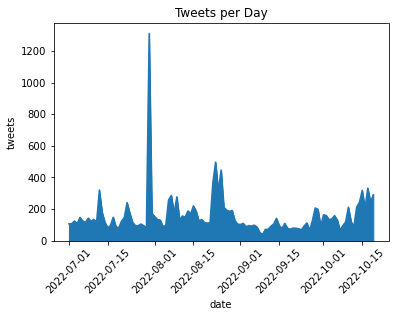

In [66]:
#Tweets per day 
tweets_per_day = copy2.groupby([copy2['Date Created'].dt.date])['Tweet'].count()
tweets_per_day.plot(kind='area')
plt.xticks(rotation=45);
x_y_t('date', 'tweets', 'Tweets per Day')
#tweets_per_day.to_csv("obi_tweets_per_day.csv", index=False)

#### Most active tweeters <a class="anchor" id="sub_section_4_2_3"></a>

> Below are the visuals for the most active tweeters. slybaba3 tweeted the most about atikulated.


In [95]:
#Most active tweeters
active_tweeters = copy2.groupby([copy2['User']])['Tweet'].count()
active_tweeters=active_tweeters.reset_index()

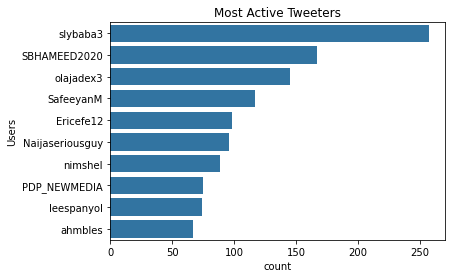

In [96]:
default_color = sb.color_palette()[0]
sb.barplot(data = active_tweeters.sort_values(by=['Tweet'], ascending=False)[:10], y='User', x='Tweet', color = default_color)
x_y_t('count', 'Users', 'Most Active Tweeters')

#### Top Mentions <a class="anchor" id="sub_section_4_2_4"></a>

> top mentions include political figures such as Reno Omokri, Dino melaye, Ben Murray Bruce.

- @PeteEdochie_ is not the popular nollywood veteran 


In [69]:
copy2['mentions']=copy2.Tweet.str.findall(r'(?<![@\w])@(\w{1,25})').apply(','.join)
copy2_mentions= copy2.assign(mentions=copy2['mentions'].str.split(',')).explode('mentions')

In [70]:
top_mentions = copy2_mentions.groupby([copy2_mentions['mentions']])['Tweet'].count()
top_mentions=top_mentions.reset_index()

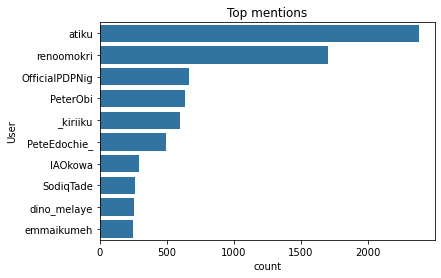

In [71]:
default_color = sb.color_palette()[0]
sb.barplot(data = top_mentions.sort_values(by=['Tweet'], ascending=False)[1:11], y='mentions', x='Tweet', color = default_color)
x_y_t('count', 'User', 'Top mentions')

#### Top Locations <a class="anchor" id="sub_section_4_2_5"></a>


> While united kingdom is the the only country outside nigeria, Lagos and Abuja also top the charts here. Also, all except south east geo political zone are featured in the top 10 locations.


In [72]:
#location cleaning 
copy2_location= copy2.assign(location=copy2['location'].str.split(' /|;|,.')).explode('location')  
top_location = copy2_location.groupby([copy2_location['location']])['location'].count()

In [73]:
top_location = {'location': ['Lagos', 'Abuja','Kaduna', 'Kano', 'Port Harcourt','Adamawa', 'Uyo', 'Ekiti/Gombe', 'Abia',
                              'Ibadan', 'Jos'],
        'count': [1293, (701+208) , 266, 204, 117, (94+82), 99, 76, 73, 71, 69]}
# Create DataFrame  
df = pd.DataFrame(top_location)
df

,location,count
0,Lagos,1293
1,Abuja,909
2,Kaduna,266
3,Kano,204
4,Port Harcourt,117
5,Adamawa,176
6,Uyo,99
7,Ekiti/Gombe,76
8,Abia,73
9,Ibadan,71


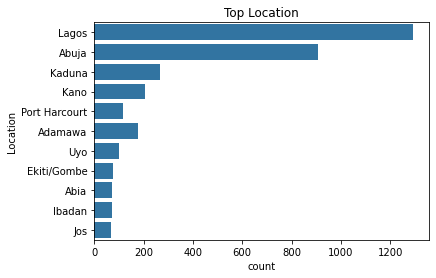

In [74]:
default_color = sb.color_palette()[0]
sb.barplot(data =df, y='location', x='count', color = default_color)
x_y_t('count', 'Location', 'Top Location')

#### Word cloud <a class="anchor" id="sub_section_4_2_6"></a>

> A visual representaion of what people are saying 

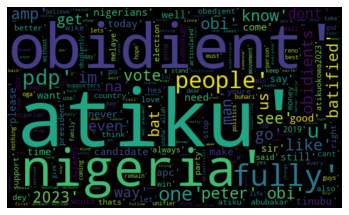

In [221]:
allWords = ' '.join([str(twts) for twts in copy2['tweet']])
wordCloud=WordCloud(width = 500, height=300,max_font_size=119).generate(allWords)

plt.imshow(wordCloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [75]:
#Create a function to get the subjectivity
def getSubjectivity(text):
    return TextBlob(text).sentiment.subjectivity

#Create a function to get the polarity
def getPolarity(text):
    return TextBlob(text).sentiment.polarity

#Create two new columns
copy2['subjectivity']=copy2['tweet'].apply(lambda x: getSubjectivity(' '.join(x)))
copy2['polarity']=copy2['tweet'].apply(lambda x: getPolarity(' '.join(x)))

In [76]:
def get_tweet_sentiment(score): 
    '''Utility function to classify sentiment of passed tweet using textblob's sentiment method'''
    # create TextBlob object of passed tweet text 
   # analysis = TextBlob(tweet) 
    
    # set sentiment 
    if score > 0:
        return 'positive'
    elif score == 0: 
        return 'neutral'
    else: 
        return 'negative'
    
copy2['sentiment'] = copy2['polarity'].apply(get_tweet_sentiment)

#### Sentiments <a class="anchor" id="sub_section_4_2_7"></a>

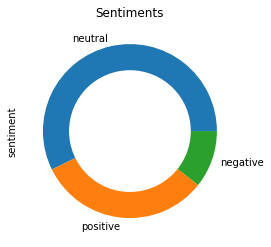

In [77]:
# Pie Chart
copy2['sentiment'].value_counts().plot(kind='pie')
  
# draw circle
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
fig = plt.gcf()
  
# Adding Circle in Pie chart
fig.gca().add_artist(centre_circle)
  
# Adding Title of chart
plt.title('Sentiments')
  
# Displaying Chart
plt.show()

In [225]:
#print positive tweets
j=1
sortedDF = copy2.sort_values(by=['polarity'])
for i in range(0, sortedDF.shape[0]):
    if(sortedDF['sentiment'][i]=='positive'):
        print(str(j) + ') ' +sortedDF['Tweet'][i])
        print()
        j=j+1
        

1) @_dinomelaye Atikulated. Ready for the poll. But please we need Wike quickly in this camp. It is important, he has more value than Ayu. @_dinomelaye

2) @atiku Fully Atikulated happy birthday sir

3) Dear Nigerians please meet your next president.

A man with a good heart, a man that wants to take Nigeria back to her real position.

A man that wants to give back what his country has given to him.

A man who is loved by all.

The man Atiku❤️ https://t.co/tVwBqjZd7J

4) @Nwike406 @_nonsojoe @DailyPostNGR @davido Yes good health in France where is meeting those that matters.

5) @TheoAbuAgada @MizCazorla1 Lol 😂 Peter get shoko

6) @_nonsojoe @DailyPostNGR @davido Canvassing for vote for his party presidential candidate is an excuse? Oga no one will waste his time supporting or waste his/her vote for one online candidate. Cry me a river he will not be supporting your online president.

7) One of the people that gave me the toughest of times in my conversion effort from Obidient to Atiku

559) Dear Sir, you have proven to be a VERIFIED enabler of Youths in politics and business. Over the years, your commitment to the development of the Nigerian Youth has been phenomenal. With this statement, you have demonstrated once again that PDP is the Party to be in. https://t.co/YDQcz3ohNd

560) @Fortuneplay3 @channelstv If Atiku eyes clear what will happen? The best you get is president Tinubu. Dead this your imaginary thinking.

561) @wealthprince001 @asiwajualayo1 @channelstv You better go and face your online party and president

562) Atikulated &amp; Batified supporters chose war and propaganda against #PO - the Nigerian people's candidate. So this clearly shows, they are after us, not Obi our candidate. The choice now is, we #OBIDIENTS must chose to defend ourselves, the mandate and we must do it magnificently.

563) collapsing well-being and collapsing value of human life and dignity. My expectation is that Nigerians will collapse the ruling APC in kind via the ballot and e

He should become #Atikulated https://t.co/M0ER4cGmbK

1190) A well atikulated PLAN to stir Nigeria away from darkness.
Nigerians have a unifier one with adequate knowledge of practical economics, a brilliant border officer who has the capacity to protect Nigerians, a lover of education and intends to restructure power. #AtikuOkowa2023 https://t.co/n8UBVgtvhL

1191) See beautiful ATIKUlated River's People, We go choke unah with pictures, 

You m.ust see Atiku and his supporters. 

You m.ust hear of Atiku and his supporters, we've been trending, I am happy, I am so happy. 

Atiku remains the best option for the job.
#PresidentAtiku https://t.co/F3Fdi9oWj3

1192) Are you!👇🏼
Atikulated!
Tinubulated!
Kwankwasociate!
Or you're Obedient..?

1193) @IbkSports You want me to be Obidient or Atikulated ? Lol

1194) @renoomokri What kind of SHOE is this?, is it for Atikulated?, So Longggggg like Atiku Longgggg and empty Promises..
Pls better be Obidient....
@stylextras pls keep far from him brother

1677) @MobilePunch Presidential candidate that cant change d colour of cloth he wears how wil such a person change anything in Nigeria, vote wisely n b Atikulated

1678) @renoomokri The whole southeast are also AtikuLated, I urge Atiku supporters to stage a rally today, because we are PDP and PDP is ours.

1679) @mrmacaronii First time u posted something meaningful well keep it up,mayb i wil begin to start liking u again cuz my love for u is only wen u fought wit d youth at end sars, well b Atikulated n have peace

1680) @Makavelli275 Anywhere u see APC n PDP sharing money collect ur own share oooh,if they are shouting ATikulated or Batified follow them shout n collect d money,This is the only time we can take d money they stole 4rm us, BUT On d polling Unit go n vote Peter Obi! Vote Labour Party Vote Wisely!!

1681) I’m not saying people should not japa but what’s @inecnigeria doing about their voters card. Too many people don japa lately &amp; many more will still japa this ember mon

2208) Obaseki is a Strong supporter of @IAOkowa our vice presidential candidate. He's not a Noise maker. He's a salient achievement that is fully Atikulated as a MIKANO boy. https://t.co/LFF1XEiTtd

2209) @MalachyOdo1 Obaseki is a strong supporter of Governor okowa our vice presidential candidate. he's not a noise maker like parrot. He's a salient achievement. He's fully Atikulated as a MIKANO boy.

2210) @atiku So you shall become the president of the federal republic of Nigeria 🇳🇬!! 8yrs cos @Arsenal is taking it 8 straight win…. Am fully atikulated 🙌🏽

2211) @bukolasaraki @OfficialPDPNig The new decampees apologised for all their propaganda against the personality of Saraki and PDP Pre-2019 and beyond, they promised to take it down to the grassroot.

The Decampees are major bloc from Kwara APC &amp; SDP.
#PowerToThePeople #Atikulated https://t.co/xyaZCE964L

2212) @atiku @EmekaIhedioha Arsenal are Atikulated sir and in that respect pls patronize, I believe my buyer is here let's get


2635) @renoomokri Lmao Reno if dem born you well when you’re writing an exam or thesis, spell ‘Articulated’ as ‘Atikulated’ 😂😂 Werey

2636) @renoomokri That is not what he means by Articulate someone fluently and coherent. That means @renoomokri don’t know the spelling and the meaning and different between #ARTICULATED  and ATIKULATED

2637) He records her every time they go out 😩💕 most ladies have successful turn these boyfriends to Photographers/Cameramen.🤣🤣

"Miyetti Allah" APGA  #heartattack Failed "23rd August" London "Mrs Ikoyi" Atikulated Fashola "What God" #NationalShutdown IPOB  Catholics "Miyetti Allah" https://t.co/ro2yXF4Het

2638) We support the people that made us to suffer. Until we forget our self and concentrate on developing a nation our children will be proud, know we have failed. We need to stand for what is right!!! #1MillionMarch4PeterObi #BATified  #Atikulated #PeterObi https://t.co/treXwIIRtk

2639) love this!😆😂😂👍😍😍😍 This moment is really relaxing.

"Miyetti Al

2887) @renoomokri Atiku is my choice and I believe he is the best out of the lot out here contesting for the 2023 general election. Am Atikulated.

2888) Don't argue with people. State your point and mind ur own business. If you are Obidient, be Obedient in your mind. If you are Batified, be Batified in ur mind. If you are Atikulated, be Atikulated in ur mind. Ur votes will determine d Lord's chosen not ur argument. God bless you.

2889) @renoomokri Proudly ATIKUlated https://t.co/RDo0XejOBY

2890) @renoomokri @PeterObi Proudly ATIKUlated https://t.co/Xxkyy3FAdy

2891) @ObiDuke3 @heshpee @blossommartins @officialABAT Wow! You're innovative 💡 
Why is @elonmusk not calling you now?? 
Abi he's supporting the Jagaban and Atikulated???

2892) The present situation of Nigeria requires a leadership with vast experience and a proven results.

I'm sure Atiku Abubakar represent these fit.

So Nigerians lets get ATIKULATED 💪💪💪💪💪.

2893) Atiku will effectively boost Nigeria's economy because he's 

#Wike , #Atiku , #AtikuOkowa2023 , #AtikuKawai , #atikuiscoming , #atikuthedemocrat , #atiku4sure , #AtikuOkowa , #AtikuLovesEducation , #Atikulated . https://t.co/GvuF41Nh3N https://t.co/EWqRxWJo5V

3389) We are Atikulated and not perplexed by the show of greed by few uncultured mind's, come 2023 we shall be sworn in,no miracle happens without threatening obstacle.
#AtikuOkowa2023 https://t.co/lMB8pHUkhG

3390) I remain 100% Obediently Atikulated.
#Atikuiscoming https://t.co/vuTlctS3Qj

3391) @atiku @OfficialPDPNig Nigeria must be Atikulated. A new Nigeria is possible

3392) @Bengoddy22 @lawrenceslow @ChimarokeNamani I see u're well Atikulated! 'All is well that ends well' says Shakespeare, but my friend, NIGERIA needs to urgently turn this bend &amp; we don't need old men, we need agile people with a new view of the new world. Leaders who are atune with the youths &amp; not their ilks.
I rest here

3393) @BolanleCole I for drop account details but am not atikulated, love and light

3


4009) @firstladyship We will have the last laugh by God grace.Atikulated💪 https://t.co/xHrN9Y5WDw

4010) Obidients are on the Social Media, Jagabans at the motor parks and the Atikulated at the streets begging for alms.

4011) I have just been invited to become the Youth leader of the new political party in my town, they say "they're the Future" : I tell them I've got the future. I am Atikulated 💯
@atiku for president 2023.

4012) @SavvyRinu @chosensomto @SavvyRinu don’t mind him. We all choosed Atiku in 2019 because we believed he was the better option among the other candidates. Every meaningful Nigerians was Atikulated in 2019, even him.. We’re choosing Pete obi because we believe he’s the better option..

4013) Obidients and Atikulated, Tinubulate kindly listen to the voice of the  Prophet https://t.co/3ZdoEvFrJT

4014) @cchukudebelu @channelstv No problem if he vote agbado to retain his work but at least he has been able to led millions of @channelstv viewers right.

We must be #

 #BatKash2023

4413) I am obedient and very atikulated but when I was batified, i saw the light and  never looked back. 
#BAT2023
#Jagaban https://t.co/9u3kKyMd0V

4414) I am obedient and very atikulated but when I was batified, i saw the light and  never looked back.
We're confident of victory with his landslide achievement. 
#iREPjagaban

#BAT2023
#Jagaban https://t.co/2w9p3B7K9y

4415) I am obedient and very atikulated but when I was batified, i saw the light and  never looked back. 

Good morning people!

#BAT2023
#Jagaban https://t.co/WCZVKKIxND

4416) I am obedient and very atikulated but when I was BATIFIED, i saw the light and  never looked back. 

#BAT2023
#Jagaban https://t.co/44zDIb973T

4417) I am obedient and very atikulated but when I was batified, i saw the light and  never looked back. 

#BAT2023
#Jagaban https://t.co/0d2nn5buug

4418) @HumphreySophia1 Obidient is better than Atikulated, also pass in on to your third generation.. it is written 1 Samuel 15:22

4419) @drp

4955) @arab_apdoull @JeffreyGuterman I wonder for some people,  they behave as if they have the ultimate knowledge, everything they like is good and you must agree with em to be right.....u chose to be obidient and we chose BAT or to be Atikulated where is the harm in that?

4956) We don lock Osogbo down

The stadium sef no fit reach us 

@SodiqTade @OfficialPDPNig

#Imolelokan #PDP #Adeleke #osogbo #Atikulated https://t.co/vzuy60JKPo

4957) @Davidalgorithm Am highly OBIdient, YUSFU'lly supporting a new Nigeria and DATTI's the fact. 

I Stan with every OBIdients players to PETER-out every opposition and its propaganda. 

Never giving ears to all ATIKULATED lies.

#ObidientIstand

4958) The only reason why #batified and #atikulated and talking about Peter Obi is just the fact that Obedients are campaigning for Peter Obi free of charge while they are busy waiting to be mobilized before they can campaign for their candidates.  
#Obidatti2023 https://t.co/q7YXtrwYYX

4959) Aso Rock is Atik

5341) @AmeinJr @atiku @abba_kadade @OfficialPDPNig We are atikulated, but Obediently voting Obi

5342) @atiku @abba_kadade @OfficialPDPNig ameen we are so happy that our next coming President is so humble to his people we remain Atikulated Sir

5343) This is for my Obidiently Atikulated folks out there…

#SayNoToCyberBully but rather learn civility from your master @PeterObi 

“Atiku is a Unifier, He believes in #OneNigeria, Atiku is my Leader, He is a good Man”.

#AtikuOkowa2023 @AtikuYouthWing 

 https://t.co/P5cgJOIl7Y

5344) @maxilopez247 Sir please understand this , not everyone in Igbo land is going to Vote LP which is fine , my brothers are Atikulated and we tease each other all the time but it’s different here online

5345) @renoomokri When will Atikulated start his own interview so that we can compare his answers to Other aspirants. Enough of only finding fault in one particular candidate. #NoBodyHolyPass

5346) @renoomokri I am of the view that you forget completely what Obi 

In [226]:
#print negative tweets
j=1
sortedDF = copy2.sort_values(by=['polarity'], ascending=False)
for i in range(0, sortedDF.shape[0]):
    if(sortedDF['sentiment'][i]=='negative'):
        print(str(j) + ') ' +sortedDF['Tweet'][i])
        print()
        j=j+1

1) A man donated 3m worth fake Naira note to Nasarawa state labour party.
😆

2) Nobody is taking Kwankwaso and his Pi party serious.

😆

3) @excerzy @Nwike406 @_nonsojoe @DailyPostNGR @davido Your father and mother at home are silly.

4) @Oluwasantus @oddy4real Who dey drag online president with una?

5) @_nonsojoe @DailyPostNGR @davido Then go and vote your candidate and stop crying because someone said he will be supporting someone from his party. He's giving excuse blablabla

6) @PatrickNwadibie @govdouyediri @CAPT__Vincent Check your leader's twitter handle you'll see the videos he shared earlier and stop asking me stupid questions.

7) @JPenshior Who’s the mad man?

8) @BenHundeyin You sha go find one fault on complaint

9) @PatrickNwadibie @govdouyediri @CAPT__Vincent And yet goes around with a live band and be dancing useless dance in another state.
Wike na mumu.

10) @myklazonline @ComforterComfy @DokunOjomo @novieverest Did the constitution say they should be killed?
You be od

331) @mr_okokobioko Most of his supporters have shifted base to Obidiots to avoid being mobbed by the latter even though deep down in their hearts they are atikulated.

332) @AfricanaSage @wakajugbe How? Tell me what I said that's bad?
Didn't you see when I said I love obi?
So I should make enemies with him coz he's atikulated?

Politics no go end us sha

333) @ChisomOnwuegbu1 @Official_H2D @DavidHundeyin God bless your wisdom.   We keep shocking them with our innovations and smart think.. the difference between Obidients, BAT &amp; Atikulated is that Obidients do crowd funding while the others depend on their Principal for fund. "As e dey sweet us e dey pain dey"

334) @Amb_Balemoh @DokunOjomo Who go vote for buhari this time around talk less of apc? Everyone is atikulated now

335) Your hate no go fit bole egg...
So... keep your hate one side,all I know is Atiku Okowa is the next president of Nigeria.

I am Atikulated ✊ to the teeth 💪I got no time for haters and envious of progress.


739) I have not seen manifestoes flying around in Nigeria election campaign unlike 2015 and the one that followed. Am I missing something? Does anyone have @NgLabour, @OfficialAPCNg and @OfficialPDPNig manifesto I can peruse? #NigeriaDecides2023 #PeterObi #Tinubu #Atikulated

740) Sadly his voice is not loud enough. The #Obidatti023 #batist #Atikulated need to listen to him. Stop listening to the #cashivist https://t.co/pXOg7KNpBa

741) Them wan carry me go where I no know, OBIDIENTS come and see me ooh for this buhari Nigeria, someone is making such mistakes.
#Atikulated #sarki #katsina #kabaka #reno #onitcha #PeterObi #mcoluomo #100manthony #LoveIslandUSA #studentloanforgiveness #lagos #tinubu #northerners

742) @Waspapping_ Dear @PeterObi and #Obidient
"We no dey give shi shi" should mean not giving money to anybody. Then how were you guys scam by @Waspapping_ 
#Obidatti2023 is DEAD. THANK YOU @Waspapping_ #ObidiEND #Obidiots #Atikulated #atikuthedemocrat

743) Three fake Americans 

1021) Dem no dey tell blind man say rain dey fall. 

If you like be Batified or Atikulated. Sapa, insecurity no get tribe or religion. 

Stop collecting crumbs from your Batified or Atikulated, learn how to feed.

Use your brain. https://t.co/Tx6sDzYS3Y

1022) @abbalala3 @atiku We're seriously Atikulated 🤜🤛

1023) @_jollypapa Same here.... But on a seriois note, shey I will pick the Agbado with my hand a take away from its recruitment source leaving behind the Agbado stick abi I dey chop am with the stick... I really need some Atikulated response.

1024) @michael10254607 @urcelebritylolo @Chude__ @AfamDeluxo Bros biko remove this particular picture and upload another one, this could be sending a wrong message  in a polarised country like Nigeria. I understand that you meant no harm but you see those BATITHIEIVES AND ATIKULATED WILL TWIST THE NARRATIVE BIKO. HOPE YOU UNDERSTAND THIS!

1025) @renoomokri We support Atiku 2019 because of Obi and still wonder how long can we pray if Atiku s


1283) I am obediently Atikulated no more no less. Atikukawai https://t.co/g4PcocGJFg

1284) One of the presidential candidate will fall sick and die next year after the 2023 Presidential election  results are announced (Bookmark this Tweet).
Datti Wike Peter Obi BAT ATIKULATED #2023Elections

1285) @gozmok112 @Sir_Vulcan01 @frankedoho Because I'm not supporting Peter obi now it's mean I'm bringing bad luck to you 
You well so?? Most we all support labour party 
Fully  atikulated

1286) @younitybyfogg @momohqueenanne @AdigunLuqman @segalink @shextian @TrueVibe77 @abati1990 You’re very mad sha. Feudal thinking??? Same oga that’s talking about getting Nigeria to industrialize and be more productive. Na wa for you atikulated mumus

1287) Dogara and babachir are the two demons hiding behind their shadows in order to satisfy their selfish interest. I remain concern Atikulated

1288) Those BAT and Atikulated loyalists go run mad for street off clothes dey cry https://t.co/ztKTQd1g6i

1289) @

1667) It's not a party, it's a mafia group, an extension of a cartel. Tbh, Nigerians are fed up, they just have to settle for the less. We can only deliver ourselves by ourselves. She has said it all, @atiku has a chance. #AtikuKawai #AtikuOkowa2023 #Atikulated #Atiku https://t.co/IRnjiVpKGA

1668) Atiku Abubakar believes in Education. He has invested in education before as an individual. He will invest in education heavily when he becomes President. As a season educationist himself, Atiku Abubakar will end ASUU strike. 

#theunifier #atiku100percent #atiku #Atikulated https://t.co/bQCbAEyNXE

1669) @renoomokri Its sad you are no longer atikulated  you are now atilulated  very soon you will be stimulated

1670) How can we erase this 8years? What a wasted life NIGERIA🇳🇬 lived 😢

Enough is enough Babachir Lawal Desmond Elliot IPPIS LEAKED AUDIO ATIKULATED TINUBU #ObiDatti #ObiDatti4anewNigeria

1671) @renoomokri Stop speaking bad English, there is nothing like Atikulated in Oxford dictio

#### Dashboard <a class="anchor" id="sub_section_4_2_9"></a>

> the dashboard will include 

1. The numbers ( tweets, likes and retweets) at the top 

2. tweets per day

3. top location

4. Active twitters

5. word cloud 

6. sentiments

### Bola Ahmed Tinubu

In [78]:
bat_df=pd.read_csv('batified.csv')


In [79]:
bat_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25532 entries, 0 to 25531
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   User          25532 non-null  object
 1   Date Created  25532 non-null  object
 2   location      17688 non-null  object
 3   followers     25532 non-null  int64 
 4   Likes         25532 non-null  int64 
 5   retweet       25532 non-null  int64 
 6   Tweet         25532 non-null  object
dtypes: int64(3), object(4)
memory usage: 1.4+ MB


In [80]:
bat_df.describe()


,followers,Likes,retweet
count,2.553200e+04,25532.000000,25532.000000
mean,3.288550e+03,12.615267,4.148559
std,3.784957e+04,168.128956,78.821224
min,0.000000e+00,0.000000,0.000000
25%,1.220000e+02,0.000000,0.000000
50%,4.190000e+02,0.000000,0.000000
75%,1.256250e+03,2.000000,0.000000
max,2.849666e+06,12639.000000,6237.000000


In [81]:
bat_df.duplicated().sum()


2

In [82]:
bat_df.isna().sum()


User               0
Date Created       0
location        7844
followers          0
Likes              0
retweet            0
Tweet              0
dtype: int64

In [83]:
bat_df['location'].nunique()

3247

### Quality issues

1. Remove  duplicates

2. Erroneous data type (Date Created column should be string instead of datetime)

3. convert Tweet text to lower case 

4. Since the search is by keyword Remove keyword (obidient) from the tweet text in ordernot to get biased word cloud.

5. Remove RT, hashtags, hyperlinks , @ and all punctuation for sentiment analysis

6. Apply tokeniztion on Tweet column



### Tidiness issues


1. location should be split the the seperating delimeter 

2. location has 6238 distinct location, should be investigated

In [84]:
# Make a copy of original pieces of data
copy3=bat_df.copy()

In [85]:
# drop duplicates
copy3.drop_duplicates(keep='first', inplace =True)

In [86]:
# convert date created column to datetime
copy3['Date Created'] = pd.to_datetime(copy3['Date Created'])

In [87]:
#convert text to lower case
copy3['tweet']=copy3['Tweet'].str.lower()

In [88]:
#Clean the text 

#Create a function to clean the tweets

def cleanTxt(text):
    
    #Remove keyword
    text=re.sub(r'batified', '', text) 
    #Remove @mentions
    text=re.sub(r'@[A-Za-z0-9]+', '', text) 
    #Remove hashtags
    text=re.sub(r'#', '', text) 
    #Remove underscores
    text=re.sub(r'_', '', text) 
    #Remove retweets
    text=re.sub(r'RT[\s]+', '', text) 
    #Remove hyperlinks
    text=re.sub(r'https?:\/\/\S+', '', text) 
    #Remove punctuations
    text=re.sub(r'[^\w\s]', '', text)
    
    return text

copy3['tweet']=copy3['tweet'].apply(cleanTxt)



In [89]:

# Tokenization 
nltk.download('punkt')

#tokenize 
copy3['tweet'] = copy3.apply(lambda row: nltk.word_tokenize(row['tweet']), axis=1)

[nltk_data] Error loading punkt: <urlopen error [Errno 11001]
[nltk_data]     getaddrinfo failed>


In [90]:
#stop words 
stop = stopwords.words('english')

copy3['tweet'] = copy3['tweet'].apply(lambda x: [item for item in x if item not in stop])

In [66]:

#location cleaning 
copy3_location= copy3.assign(location=copy3['location'].str.split(' /|;|,.')).explode('location')  

In [67]:

# mention cleaning
def find_at_word(text):
    word=re.findall(r'(?<=@)\w+',text)
    return " ".join(word)

copy3['mentions']=copy3['Tweet'].apply(lambda x: find_at_word(x))

copy3_mentions= copy3.assign(mentions=copy3['mentions'].str.split(' /|;|,.')).explode('mentions')  

#### The Numbers <a class="anchor" id="sub_section_4_3_1"></a>

> The tweet collected for the keyword 'batified' contained 25,530 tweets gathered 105,921 retweets and 322,093 likes

In [443]:

### The Numbers (tweets, likes, rwetweets)

#Numbers 
tweets=copy3.shape[0]
likes=sum(copy3['Likes'])
retweets=sum(copy3['retweet'])

print('Number of tweets = ' ,tweets)
print('Number of likes = ',likes,)
print('Number of retweets = ' ,retweets)



Number of tweets =  25530
Number of likes =  322093
Number of retweets =  105921


In [86]:
### Most liked tweet
copy3.sort_values(by=['Likes'], ascending=False)[:25]

,User,Date Created,location,followers,Likes,retweet,Tweet,tweet,mentions
22781,VictorIsrael_,2022-07-13 08:49:30+00:00,Cooking Avenue,118697,12639,6237,So Tinubu’s daughters aged 25 &amp; 22 bought ...,"[tinubus, daughters, aged, 25, amp, 22, bought...",
19916,emediong_sambo,2022-07-26 09:01:49+00:00,"Rivers, Nigeria",775,9354,2307,"I hereby resign my batified membership, I'm no...","[hereby, resign, membership, im, fully, obidie...",
10146,TOpemidayo,2022-09-16 07:50:30+00:00,Califonia | Lagos | HongKong,360,9310,4314,This is where I draw the line. I don’t think i...,"[draw, line, dont, think, healthy, anyone, aro...",
22644,VictorIsrael_,2022-07-13 11:30:40+00:00,Cooking Avenue,118697,7461,5814,BATIFIED WhatsApp Group is on fire. They are p...,"[whatsapp, group, fire, planning, discredit, d...",
22711,Tutsy22,2022-07-13 10:11:53+00:00,🇳🇬🇸🇱🇬🇧🇺🇸,342234,6847,3332,"Bola Tinubu's two daughters, 22 and 24, allege...","[bola, tinubus, two, daughters, 22, 24, allege...",
22684,Baddezzzz,2022-07-13 10:39:50+00:00,Johannesburg & Lagos,1322,4783,1804,"Northern Nigeria, Afenifere, Pat Utomi, Wole S...","[northern, nigeria, afenifere, pat, utomi, wol...",
5413,alakowe_e,2022-10-03 20:52:15+00:00,"Lagos, Nigeria",1483,3805,3250,"Bola Tinubu, the man that captured and stole L...","[bola, tinubu, man, captured, stole, lagos, we...",
11990,Elkrosmediahub,2022-09-03 06:46:43+00:00,Nigeria,121677,3789,1343,Funny how no APC or ‘Batified’ have come out t...,"[funny, apc, come, argue, even, subtly, debunk...",
22404,urchilla01,2022-07-13 14:37:01+00:00,far away chasing gwalala,40179,3690,1577,Four months of coordinated attacks on Peter Ob...,"[four, months, coordinated, attacks, peter, ob...",
22775,Girl_isBlessed,2022-07-13 08:59:28+00:00,NaN,44729,3494,1795,Tinubu's kids in their 20s are buying houses w...,"[tinubus, kids, 20s, buying, houses, worth, mi...",


In [87]:
copy3['Tweet'][15909]

'I am unequivocally BATified ♾️ https://t.co/WV073u9uJp'

In [88]:
### Most Retweeted tweet
copy3.sort_values(by=['retweet'], ascending=False)[:25]

,User,Date Created,location,followers,Likes,retweet,Tweet,tweet,mentions
22781,VictorIsrael_,2022-07-13 08:49:30+00:00,Cooking Avenue,118697,12639,6237,So Tinubu’s daughters aged 25 &amp; 22 bought ...,"[tinubus, daughters, aged, 25, amp, 22, bought...",
22644,VictorIsrael_,2022-07-13 11:30:40+00:00,Cooking Avenue,118697,7461,5814,BATIFIED WhatsApp Group is on fire. They are p...,"[whatsapp, group, fire, planning, discredit, d...",
10146,TOpemidayo,2022-09-16 07:50:30+00:00,Califonia | Lagos | HongKong,360,9310,4314,This is where I draw the line. I don’t think i...,"[draw, line, dont, think, healthy, anyone, aro...",
22711,Tutsy22,2022-07-13 10:11:53+00:00,🇳🇬🇸🇱🇬🇧🇺🇸,342234,6847,3332,"Bola Tinubu's two daughters, 22 and 24, allege...","[bola, tinubus, two, daughters, 22, 24, allege...",
5413,alakowe_e,2022-10-03 20:52:15+00:00,"Lagos, Nigeria",1483,3805,3250,"Bola Tinubu, the man that captured and stole L...","[bola, tinubu, man, captured, stole, lagos, we...",
19916,emediong_sambo,2022-07-26 09:01:49+00:00,"Rivers, Nigeria",775,9354,2307,"I hereby resign my batified membership, I'm no...","[hereby, resign, membership, im, fully, obidie...",
15583,CrownprinceCom2,2022-08-18 06:45:31+00:00,NaN,2400,289,1841,"If you casting your VOTE now, who is having yo...","[casting, vote, vote, peterobi4president2023, ...",
22684,Baddezzzz,2022-07-13 10:39:50+00:00,Johannesburg & Lagos,1322,4783,1804,"Northern Nigeria, Afenifere, Pat Utomi, Wole S...","[northern, nigeria, afenifere, pat, utomi, wol...",
22775,Girl_isBlessed,2022-07-13 08:59:28+00:00,NaN,44729,3494,1795,Tinubu's kids in their 20s are buying houses w...,"[tinubus, kids, 20s, buying, houses, worth, mi...",
8832,Jessehallidaygi,2022-09-20 17:14:31+00:00,Heaven,10655,3121,1794,Adams Oshiomhole and APC lies about Peter Obi ...,"[adams, oshiomhole, apc, lies, peter, obi, exp...",


#### Tweets per day <a class="anchor" id="sub_section_4_3_2"></a>

> Tweets per day peaked on the 13th of July 2022 and 8th of August 2022. Further investigation revealed there was a rumour of Bola Tinubu's daughters buying houses in new york, this sparked discussions. Interestingly, tweets regarding this gathered the most likes and retweets.

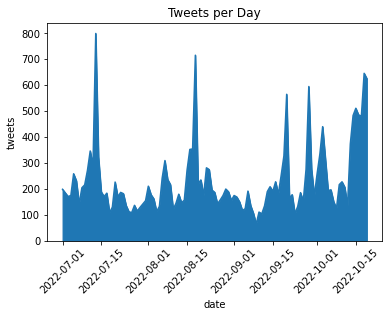

In [92]:
#Tweets per day 
tweets_per_day = copy3.groupby([copy3['Date Created'].dt.date])['Tweet'].count()
tweets_per_day.plot(kind='area')
plt.xticks(rotation=45);
x_y_t('date', 'tweets', 'Tweets per Day')
#tweets_per_day.to_csv("obi_tweets_per_day.csv", index=False)

In [345]:
copy3[copy3['Date Created'].dt.strftime('%Y-%m-%d') == "2022-08-18"].sort_values(by=['Likes'], ascending=False)[:10]

,User,Date Created,location,followers,Likes,retweet,Tweet,tweet,mentions
15571,tomiwawimot,2022-08-18 06:58:26+00:00,turn my notification on 🔔,12783,1505,528,𝟽 𝚝𝚑𝚛𝚎𝚊𝚍𝚜 𝚘𝚏 𝚏𝚞𝚗𝚗𝚢 𝚝𝚠𝚎𝚎𝚝𝚜 𝚊𝚗𝚍 𝚛𝚎𝚙𝚕𝚒𝚎𝚜... 😁\n\n...,"[𝟽, 𝚝𝚑𝚛𝚎𝚊𝚍𝚜, 𝚘𝚏, 𝚏𝚞𝚗𝚗𝚢, 𝚝𝚠𝚎𝚎𝚝𝚜, 𝚊𝚗𝚍, 𝚛𝚎𝚙𝚕𝚒𝚎𝚜, ...",
15058,PeterObiUpdates,2022-08-18 17:53:56+00:00,Somewhere in the World 🌎🌍,4357,1464,408,"This is Niger State, they are now Obidients an...","[niger, state, obidients, started, mobilizatio...",
15402,uchenanikweze,2022-08-18 08:12:04+00:00,NaN,26028,1371,406,I wonder where some people actually draw the c...,"[wonder, people, actually, draw, courage, bold...",
15517,soultie1988,2022-08-18 07:23:43+00:00,"Abuja, Nigeria",2984,575,298,This is the current President of Zambia doing ...,"[current, president, zambia, po, way, exactly,...",
15366,VictorIsrael_,2022-08-18 08:31:17+00:00,Cooking Avenue,118704,573,225,"Wether you are Obidient, BATified or Atikulate...","[wether, obidient, atikulate, either, enjoy, s...",
15437,iClearment,2022-08-18 07:58:22+00:00,lagos,973,520,42,May our Helper locate us as #olamide located A...,"[may, helper, locate, us, olamide, located, as...",
15584,mrafricanx,2022-08-18 06:41:59+00:00,NaN,1992,452,112,Picture of the DAY!\n\n-----\n\nBATified|Canad...,"[picture, day, canadakemijusticeforkhadijapete...",
15043,PeterObiUpdates,2022-08-18 18:32:14+00:00,Somewhere in the World 🌎🌍,4357,444,153,For any of this clothes chat @Oluwanikhnyur fo...,"[clothes, chat, price, base, agege, lagos, sta...",Oluwanikhnyur
15296,crypto_zod,2022-08-18 09:08:24+00:00,"ESUT Agbani, Enugu",1040,413,207,When they say go and verify. Peter Obi's love ...,"[say, go, verify, peter, obis, love, humanity,...",
15555,SureGT,2022-08-18 07:06:52+00:00,NaN,1858,394,99,Batified\n#BATified \n\nPeter Obi for PRESIDEN...,"[peter, obi, president, peter, obi, president,...",


In [347]:

#group by week 
copy3['week'] = pd.to_datetime(copy3['Date Created']) - pd.to_timedelta(7, unit='d')
tweets_per_week = copy3.groupby([pd.Grouper(key='week', freq='W')])['Tweet'].count()

#### Most active tweeters <a class="anchor" id="sub_section_4_3_3"></a>


> dan_takara and daclemx are the most engaged users, However daclemx is an obidient supporter

In [93]:
#Most active tweeters
active_tweeters = copy3.groupby([copy3['User']])['Tweet'].count()
active_tweeters=active_tweeters.reset_index()

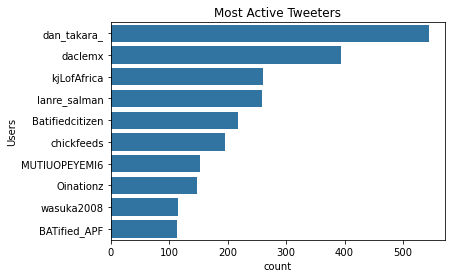

In [94]:
default_color = sb.color_palette()[0]
sb.barplot(data = active_tweeters.sort_values(by=['Tweet'], ascending=False)[:10], y='User', x='Tweet', color = default_color)
x_y_t('count', 'Users', 'Most Active Tweeters')

#### Top Mentions <a class="anchor" id="sub_section_4_3_4"></a>

> DeeOneAyekooto and Qdpaper2 had the most mentions

In [97]:
copy3['mentions']=copy3.Tweet.str.findall(r'(?<![@\w])@(\w{1,25})').apply(','.join)
copy3_mentions= copy3.assign(mentions=copy3['mentions'].str.split(',')).explode('mentions')

In [98]:
top_mentions = copy3_mentions.groupby([copy3_mentions['mentions']])['Tweet'].count()
top_mentions=top_mentions.reset_index()

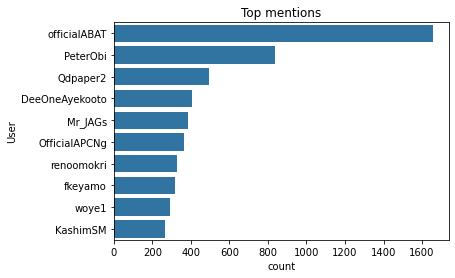

In [99]:
default_color = sb.color_palette()[0]
sb.barplot(data = top_mentions.sort_values(by=['Tweet'], ascending=False)[1:11], y='mentions', x='Tweet', color = default_color)
x_y_t('count', 'User', 'Top mentions')

#### Top Locations <a class="anchor" id="sub_section_4_3_5"></a>

> Below is the visual for top location 
> Lagos and Abuja also tops the chart here, tweets also include users from USA and UK 

In [100]:
#location cleaning 
copy2_location= copy2.assign(location=copy2['location'].str.split(' /|;|,.')).explode('location')  
top_location = copy2_location.groupby([copy2_location['location']])['location'].count()

In [101]:
top_location = {'location': ['Lagos', 'Abuja', 'Ibadan','Kaduna', 'United Kingdom', 'USA/Port Harcourt', 'Osogbo', 'Kano',
                            'Akure/Jos', 'Maiduguri'],
        'count': [(3636+112+93+58), (1037+197) , 233, 187, (125+70+65), 124, 109, 71, 59, 56 ]}
# Create DataFrame  
df = pd.DataFrame(top_location)
df

,location,count
0,Lagos,3899
1,Abuja,1234
2,Ibadan,233
3,Kaduna,187
4,United Kingdom,260
5,USA/Port Harcourt,124
6,Osogbo,109
7,Kano,71
8,Akure/Jos,59
9,Maiduguri,56


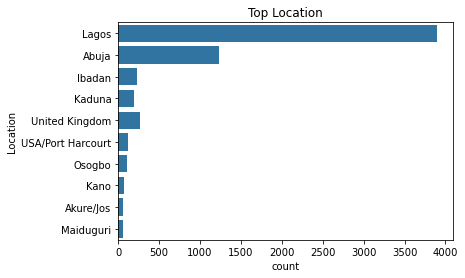

In [102]:
default_color = sb.color_palette()[0]
sb.barplot(data =df, y='location', x='count', color = default_color)
x_y_t('count', 'Location', 'Top Location')

#### Word cloud <a class="anchor" id="sub_section_4_3_6"></a>

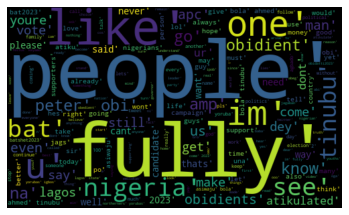

In [463]:
allWords = ' '.join([str(twts) for twts in copy3['tweet']])
wordCloud=WordCloud(width = 500, height=300,max_font_size=119).generate(allWords)

plt.imshow(wordCloud, interpolation='bilinear')
plt.axis('off')
plt.show()


In [103]:
#Create a function to get the subjectivity
def getSubjectivity(text):
    return TextBlob(text).sentiment.subjectivity

#Create a function to get the polarity
def getPolarity(text):
    return TextBlob(text).sentiment.polarity

#Create two new columns
copy3['subjectivity']=copy3['tweet'].apply(lambda x: getSubjectivity(' '.join(x)))
copy3['polarity']=copy3['tweet'].apply(lambda x: getPolarity(' '.join(x)))


In [104]:

def get_tweet_sentiment(score): 
    '''Utility function to classify sentiment of passed tweet using textblob's sentiment method'''
    # create TextBlob object of passed tweet text 
   # analysis = TextBlob(tweet) 
    
    # set sentiment 
    if score > 0:
        return 'positive'
    elif score == 0: 
        return 'neutral'
    else: 
        return 'negative'
    
copy3['sentiment'] = copy3['polarity'].apply(get_tweet_sentiment)

#### Sentiments <a class="anchor" id="sub_section_4_3_7"></a>

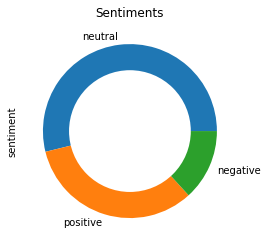

In [106]:
# Pie Chart
copy3['sentiment'].value_counts().plot(kind='pie')
  
# draw circle
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
fig = plt.gcf()
  
# Adding Circle in Pie chart
fig.gca().add_artist(centre_circle)
  
# Adding Title of chart
plt.title('Sentiments')
  
# Displaying Chart
plt.show()

In [264]:
#print positive tweets
j=1
sortedDF = copy3.sort_values(by=['polarity'])
for i in range(0, sortedDF.shape[0]):
    if(sortedDF['sentiment'][i]=='positive'):
        print(str(j) + ') ' +sortedDF['Tweet'][i])
        print()
        j=j+1

1) @Chrisblackdiam1 @ObaTojo Justified https://t.co/FzJX2RLNNu

2) @Remmymoses @AFTERMATHOO7 @jidesanwoolu Lagos is always prepared as it has high numbers of IDP camps

3) NIGHT 🌃 GAINS 💯❤️❤️💕

FOLLOW ME RT AND DROP YOUR BEAUTIFUL HANDLES FOR A QUICK FOLLOW BCK

4) @Mz_Tosyn BATIFIED baby are too sexy n beautiful ❤️❤️♾💯

5) @fowo_play Na true o,that was last time @jossykeyzz spoke on any space.

6) @officialABAT I have to come back here and check, how could this 7 seconds video shake the whole nation and yet they said Tinubu isn’t their headache 😂😂😂
Atiku traveled out to France no much noise, if it was Tinubu olopa ma ti ko everybody, wo God bless Asiwaju

7) @PeterObi Atikulate 
Batified 
Obidient

All are the same! They will use the masses who are blindfolded with “e go better” as a ladder, and when they climb, they kick the ladder away. Then the 3 set of people above will continue suffering &amp; smiling. The same circle since 1960! Funny 🇳🇬ns!

8) @oodua777 Atikulate 
Batified 
Obi

510) My President Sir!! If u are not happy pls work away. https://t.co/sgKXWCTNb2

511) @henryshield Is your father MEDICALLY fit to STAND ANYWHERE if at all you have one

512) @deantoff411 @omoledstronger @DeeOneAyekooto God bless you, I can't find any concrete evidence he gives that debunk what he was accused for.

513) The jungle is getting bigger and thicker …benue people and benue state are  Batified …if APC take away the benue i don’t think LP will get more that 5 states winning will remain a mirage..anyway the IPOBIANs have a plan B https://t.co/li73VIMXw7

514) @mamateeplus001 @officialABAT I tell u, I also converted 2-neutral voter for BAT today..they were never aware of Bat antecedent &amp;was planning to vote Atiku bcos they felt PMB has failed them..I am happy they are now Batified

515) 💯☔
    Rt and drop your beautiful handles and gain massively 🔥☃️

516) @Engr_ASB Fast

517) Lies for the obident is natural, it is in their blood, passed on by the master of lies Obi Obi.th

1162) Good morning Progressive BATIFIED MEMBERS💯 https://t.co/XYcEwLbdZL

1163) @come2rashy @BJ_VIBESS @mahtava4 @SheniKabiru @ZeekiHodl I don't think it is that. 
Gullibility imposes a certain form of helplessness on those wearing that tag. IMHO, it confers on them some vulnerability necessitating empathy
How do you classify the millions who are BATIFIED/artikulated? And scream 'obidiot' at every opportunity

1164) You all just be wise 
Let’s leave sentiment and do the right thing
#iremainobidient
#OBIDIENTS 
#OBIdientlyYUSful 
#batified https://t.co/JE2rdZvFnl

1165) @Duke_kanbai_ @raheemakanni Honestly I don’t no what else we are looking for in a leader jagaban is showing that leadership and has being showing us for a long time.. proudly BATIFIED

1166) The presence of these men @fkeyamo @realFFK are enough to grant us victory in the coming election.

They're just too good. 

Most especially, FFK @realFFK I doubt if there's anybody or anything he can't insult😂

#batified #APC https:

1638) @MazalyOladayo It seems Emilokan had been working out on the same bike since around 2013 or 2016, no wonder he is a supper fit YOOTH at only 86 years old. Awon certified asinwin ni BATified mugus,.. 😏

1639) I have NEVER met a “Batified” person (irrespective of tribe or gender) that made any logical sense of their support (for BAT or APC)
I hardly argue with them either.
I usually leave them feeling  like they made a superior argument in a monologue conversation. 
🤔🤔🤔🙄🙄🤨

1640) They said #OBIDIENTS are cyberbullies. Compared to the #BATified, #OBIDIENTS dey learn work. Those guys are so toxic &amp; empty. They say so much nonsense. All their hopes are rested on partnership with the devil; buy vote, compel people, attack people, rig election, etc.

1641) Millions had decided to be BATIFIED, be like us, follow someone wey know road, APC know road, BAT know road.
Let us all be BATIFIED. 
We will be better for it.
Anambrians I hail o.

5/5

1642) Good morning kings, pray, brush your 

2012) @ekiti_princess Even the picture of the banner shows it’s half batified full Shetima 😂

2013) Unified Vs Batified Vs Verify

Nigeria 2023  election go dy interesting.

2014) Today is Peter Obi's day! Buhari, change am fast. No politician has experienced this kind of love in the history of Nigeria. But AREA, una own too much sef. Shuo!!

Rinu Obidients Lekki Warri Kaduna LagosRally Batified Bola Ahmed Tinubu Ikeja Bauchi #PeterObiForPresident https://t.co/RKBUn46mdD

2015) See what Obidients are doing!! SEE LOVE!! Nigerians, una no like love? Festus Keyamo, Reno, FFK and Adamu want to make it seem Obidients are not good people. We are good pple. 

Northerners Yorubas Igbos Rinu Obidatti023 #PeterObiForPresident Bola Ahmed Tinubu El Rufai Batified https://t.co/LFn40gkxRy

2016) Awon Batified no fit talk oh...Lagos no be anybody land not even your overlord can pull this.😂

2017) #BATified 
Happy Independence Day 🇳🇬 https://t.co/IEPmLQG28J

2018) @Ezeala19Ezeala Lol!! Send me the lin

KeyError: 7265

In [265]:
#print negative tweets
j=1
sortedDF = copy3.sort_values(by=['polarity'], ascending=False)
for i in range(0, sortedDF.shape[0]):
    if(sortedDF['sentiment'][i]=='negative'):
        print(str(j) + ') ' +sortedDF['Tweet'][i])
        print()
        j=j+1

1) @Yjk_shotit No be wet lipstick be that? Hope no be wetin I Dey think 😂

2) @Yjk_shotit @SavvyRinu In as much I detest this act
Please which one is Nigeria has failed you? Please face those foolish policemen that will end miserable in as much they’ve chosen to do worst but don’t stain our dear country Nigeria 
May Nigeria succeed

3) @elvis_ayo @dan_takara_  am active

4) RMK supporters are angry 😂😂 https://t.co/a2uu6B26HD

5) @PoojaMedia Why keep him if he won't be used? Poor Ronaldo.

6) @victornwa_ Why are did u qouted fake date for second Niger bridge. You children maybe ashamed of u in future remember. What do u plan to achieve mbok?

7) @Mr_JAGs Trapped in his own mess.

8) @KawuGarba I don't support Obi in fact I'm fully #BATIFIED it is common knowledge  that Obi and lamba are 5&amp;6 but irrespective of my political affiliation I remain an objective fellow. Obi said China pulled 439m out of poverty in this video not Nigeria

9) @Afolasakin01 @GRVLagosMedia @GRVlagos Too late


508) I remember saluting her bravery that day. She spoke truth to power. She asked the right question: WHO GAVE THE ORDER? Alas! It is time to be Batified. https://t.co/R2H9WXlsWz

509) @seyfunmi @EmekaKa36263450 @DeeOneAyekooto Typical Batified insulting machine noted and screen shot

510) @kingmcoluomo Welldone MC! It was a well organised rally. I was there life! Shame to all that thought it would turn violent!

I am BATified!

511) All the so-called "influencers" on "politics twitter" are all the same.

 Every bloody idiots in that section are all looking for what to eat. Be it OBIDIENT, ATIKULATE or BATIFIED.  😁

512) @CWshows sadly it was more like a batified version of Green Arrow

513) #batified and all the blind BATS..... Go and verify https://t.co/9T4EQrFvTu

514) @Mz_Issey I'm Batified! Calling us mad is just unnecessary. You can't force your narrative on people . Whatever slavery means to u remains your opinion.

515) Ati batified oo ati obedient oo ati atikulate ooo..God go

KeyError: 7265

#### Dashboard <a class="anchor" id="sub_section_4_3_9"></a>



> the dashboard will include 

1. The numbers ( tweets, likes and retweets) at the top 

2. tweets per day

3. top location

4. Active twitters

5. word cloud 

6. sentiments

### Naiaraland Analysis

In [50]:
def parse_page(page_url):
    res = requests.get(page_url)
    soup = BeautifulSoup(res.text)
    rows = soup.select('td[id^=top]')
    for row in rows:
        yield parse_row(row)
        # try:
        #     yield parse_row(row)
        # except Exception:
        #     print(row)
        #     break


In [53]:
def parse_row(row):
    # You get this by exploring the source code.
    topic = row.select_one('b a')
    metadata = row.select('span b')

    if len(metadata) < 5:
        i = -1
    else:
        i = 0

    return dict(
        title = topic.text,
        link = 'https://www.nairaland.com/' + topic.attrs.get('href', ''),
        author = '' if i == -1 else metadata[i].text,
        posts = int(metadata[i+1].text),
        views = metadata[i+2].text,
        time = metadata[i+3].text
    )

In [54]:
# Data collected between July 1 and October 19
# rannge of page is subject to change and requuires manual input

data = []
for n in range(65,610):
    page_url = 'https://www.nairaland.com/politics'
    if n != 0:
        page_url += f'/{n}'
    page_data = parse_page(page_url)
    data.extend(page_data)

In [55]:
def dump_json(data, filepath, encoding='utf-8'):
    #import json
    import json
    """Dump json data into filepath."""
    with open(filepath, 'w', encoding=encoding) as file:
        json.dump(data, file, indent=4)
    print("Json dumped to", filepath)

In [56]:
dump_json(data, 'data.json')

Json dumped to data.json


### Access the data

In [57]:
data

[{'title': 'Nigerians To Hold #endsars Memorial At Lekki Tollgate, Other Locations On Thursd',
  'link': 'https://www.nairaland.com//7391934/nigerians-hold-endsars-memorial-lekki',
  'author': 'Speedition',
  'posts': 10,
  'views': '319',
  'time': '7:30am'},
 {'title': 'Finally, APC releases Fresh Campaign Council List',
  'link': 'https://www.nairaland.com//7391927/finally-apc-releases-fresh-campaign',
  'author': 'Speedition',
  'posts': 13,
  'views': '595',
  'time': '7:27am'},
 {'title': 'Jandor “not Surprised” At Wike’s Endorsement Of Sanwo-olu',
  'link': 'https://www.nairaland.com//7391769/jandor-not-surprised-wikes-endorsement',
  'author': 'Azeemokoya',
  'posts': 13,
  'views': '530',
  'time': '7:18am'},
 {'title': 'Today Sit At Home In Wotowoto Style - IPOB',
  'link': 'https://www.nairaland.com//7387460/today-sit-home-wotowoto-style',
  'author': 'Mazisimonekpa',
  'posts': 30,
  'views': '3045',
  'time': '7:16am'},
 {'title': "Re: Wike's Presidential Honour: Amaechi P

In [107]:
df = pd.read_json('data.json')

In [145]:
df.head()

,title,link,author,posts,views,time
0,Nigerians To Hold #endsars Memorial At Lekki T...,https://www.nairaland.com//7391934/nigerians-h...,Speedition,10,319,7:30am
1,"Finally, APC releases Fresh Campaign Council List",https://www.nairaland.com//7391927/finally-apc...,Speedition,13,595,7:27am
2,Jandor “not Surprised” At Wike’s Endorsement O...,https://www.nairaland.com//7391769/jandor-not-...,Azeemokoya,13,530,7:18am
3,Today Sit At Home In Wotowoto Style - IPOB,https://www.nairaland.com//7387460/today-sit-h...,Mazisimonekpa,30,3045,7:16am
4,Re: Wike's Presidential Honour: Amaechi Protes...,https://www.nairaland.com//7391805/re-wikes-pr...,NwaorguF,7,1491,6:58am


In [146]:
df.describe()

,posts
count,32397.000000
mean,95.713832
std,3680.796587
min,1.000000
25%,4.000000
50%,10.000000
75%,35.000000
max,619711.000000


In [147]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32397 entries, 0 to 32396
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   title   32397 non-null  object
 1   link    32397 non-null  object
 2   author  32397 non-null  object
 3   posts   32397 non-null  int64 
 4   views   32397 non-null  object
 5   time    32397 non-null  object
dtypes: int64(1), object(5)
memory usage: 1.5+ MB


In [148]:
df['title'].duplicated().sum()

510

In [149]:
df.sort_values(by=['views'], ascending=False)

,title,link,author,posts,views,time
6820,BIAFRA: Nostradamus Prophecies,https://www.nairaland.com//2779373/biafra-nost...,15,2442,9:51pm,Sep 27
30602,20 Owners Of Richest Oil Blocks In Nigeria – T...,https://www.nairaland.com//2284571/20-owners-r...,53,36010,9:47am,Jul 07
31049,Soldier Pull Him Uniform Refuses To Go Maiduguri,https://www.nairaland.com//7213061/soldier-pul...,13,1133,9:46pm,Jul 05
31648,Tinubu Caps contains Occult symbols,https://www.nairaland.com//6217576/tinubu-caps...,185,14567,9:45pm,Jul 03
27827,Why Kashim Shettima Tinubu Running Mate Is A B...,https://www.nairaland.com//7223724/why-kashim-...,13,267,9:30pm,Jul 14
...,...,...,...,...,...,...
20252,Ambassador Ogbuewu: A Man Who Knows The Secret...,https://www.nairaland.com//7271665/ambassador-...,Central22222,3,100,8:04am
24193,Advantages Offered By Commercial Glass Doors,https://www.nairaland.com//7247596/advantages-...,mahendralink,1,100,10:13am
17582,2023- Reason Beyond Petty Sentiments.,https://www.nairaland.com//7287429/2023-reason...,Aguogba,2,100,12:26pm
26124,South-west Population 65% Muslims – Tinubu Cam...,https://www.nairaland.com//7236893/south-west-...,vicdom,2,100,8:16pm


In [150]:
df['title'].duplicated().sum()

510

### Data Cleaning

- Remove duplicates 
- Remove datapoints where view is in time format
- Convert views to integer 
- Convert title column to lower case 
- For the purpose of analysis filter data points containing tinubu, atiku, and obi 

In [108]:
copy=df.copy()

In [109]:
#Remove duplicates 
copy.drop_duplicates(subset=['title'], keep='first', inplace=True)

In [110]:
#Remove datapoints where view is in time format
copy=copy[(copy["views"].str.contains("am") == False) & (copy["views"].str.contains("pm")==False)]

In [111]:
#Convert views to integer
copy['views']=copy['views'].astype(int)

In [112]:
#convert title to lower case
copy['title']=copy['title'].str.lower()

In [113]:
#Filter for the 3 candidates
copy=copy[(copy["title"].str.contains("tinubu") == True) | (copy["title"].str.contains("obi")==True) |
          (copy["title"].str.contains("atiku")==True)]

In [114]:
copy

,title,link,author,posts,views,time
5,labour party brags with high-profile peter obi...,https://www.nairaland.com//7387447/labour-part...,dumahi,23,808,6:58am
12,"atiku flown to paris, look really sick",https://www.nairaland.com//7391214/atiku-flown...,HomoSapiien,27,2448,6:00am
13,"peter obi: the hypocrisy of ""go and verify""",https://www.nairaland.com//7391797/peter-obi-h...,N3TRAL,17,367,5:41am
16,aisha yesufu and david hundeyin fight dirty ov...,https://www.nairaland.com//7385066/aisha-yesuf...,blamingthedevil,194,51953,5:37am
19,"atiku, tinubu, el rufai, others make list of m...",https://www.nairaland.com//7391745/atiku-tinub...,Pauldollars,14,612,5:18am
...,...,...,...,...,...,...
32379,throwback photos of peter obi trekking to his ...,https://www.nairaland.com//7187158/throwback-p...,Islandlady,332,69063,9:20am
32383,"arewa for peter obi to launch at arewa house, ...",https://www.nairaland.com//7204921/arewa-peter...,Penguin2,36,2005,9:11am
32392,the reason tinubu supporters hate peter obi,https://www.nairaland.com//7197270/reason-tinu...,floss,30,796,8:44am
32393,ortom to atiku: you denied wike popular views ...,https://www.nairaland.com//7203774/ortom-atiku...,brightonos24,141,28665,8:37am


In [115]:
atiku=copy[copy['title'].str.contains("atiku")]
tinubu=copy[copy['title'].str.contains("tinubu")]
obi=copy[copy['title'].str.contains("obi")]

### Atiku Abubakar

In [116]:
#clean the title

#Create a function to clean the title

def cleanTxt(text):
    
    #Remove keyword
    text=re.sub(r'atiku', '', text) 
    #Remove punctuations
    text=re.sub(r'[^\w\s]', '', text)
    
    return text

atiku['title_clean']=atiku['title'].apply(cleanTxt)

<ipython-input-116-1e8aba6cfab4>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  atiku['title_clean']=atiku['title'].apply(cleanTxt)


In [117]:
#tokenize 
atiku['title_clean'] = atiku.apply(lambda row: nltk.word_tokenize(row['title_clean']), axis=1)

<ipython-input-117-6ae3623a9007>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  atiku['title_clean'] = atiku.apply(lambda row: nltk.word_tokenize(row['title_clean']), axis=1)


In [118]:
#stop words 
stop = stopwords.words('english')

atiku['title_clean'] = atiku['title_clean'].apply(lambda x: [item for item in x if item not in stop])

<ipython-input-118-29bc588620d7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  atiku['title_clean'] = atiku['title_clean'].apply(lambda x: [item for item in x if item not in stop])


In [119]:
atiku

,title,link,author,posts,views,time,title_clean
12,"atiku flown to paris, look really sick",https://www.nairaland.com//7391214/atiku-flown...,HomoSapiien,27,2448,6:00am,"[flown, paris, look, really, sick]"
19,"atiku, tinubu, el rufai, others make list of m...",https://www.nairaland.com//7391745/atiku-tinub...,Pauldollars,14,612,5:18am,"[tinubu, el, rufai, others, make, list, corrup..."
50,wike misinterpreted atiku’s comment because he...,https://www.nairaland.com//7391742/wike-misint...,CrisNews,2,240,10:14pm,"[wike, misinterpreted, comment, watching, foot..."
60,osita chidoka: atiku won’t apologise for ‘yoru...,https://www.nairaland.com//7390373/osita-chido...,Johnnyessence,106,18539,9:27pm,"[osita, chidoka, wont, apologise, yoruba, igbo..."
62,this is why tinubu and atiku needs to stop cam...,https://www.nairaland.com//7391650/why-tinubu-...,theauthorishere,3,220,9:17pm,"[tinubu, needs, stop, campaigning, like, peter..."
...,...,...,...,...,...,...,...
32298,monthly/yearly payments of atiku and tinubu,https://www.nairaland.com//7205821/monthly-yea...,Mstick,24,868,2:12pm,"[monthlyyearly, payments, tinubu]"
32299,why is no one talking about atiku,https://www.nairaland.com//7206055/why-no-one-...,Tunechi5,9,312,2:11pm,"[one, talking]"
32346,atiku should go & get form for 2027 elections???,https://www.nairaland.com//7168315/atiku-shoul...,KnowAll,5,175,10:49am,"[go, get, form, 2027, elections]"
32375,"how atiku disappointed us, rejected wike as ru...",https://www.nairaland.com//7205685/how-atiku-d...,8Ebisco,2,182,9:32am,"[disappointed, us, rejected, wike, running, ma..."


In [228]:
# top authors 
# topics per day 
# word cloud
# most viewed topics 
# most engaged topic

In [229]:
#Numbers 
topics=atiku.shape[0]
views=sum(atiku['views'])
post=sum(atiku['posts'])

print('Number of topics = ' ,topics)
print('Number of views = ',views)
print('Number of post = ' ,post)

Number of topics =  1790
Number of views =  10700491
Number of post =  70711


In [ ]:
default_color = sb.color_palette()[0]
sb.barplot(data = active_tweeters.sort_values(by=['Tweet'], ascending=False)[:10], y='User', x='Tweet', color = default_color)
x_y_t('count', 'Users', 'Most Active Tweeters')

In [122]:
atiku

,title,link,author,posts,views,time,title_clean
12,"atiku flown to paris, look really sick",https://www.nairaland.com//7391214/atiku-flown...,HomoSapiien,27,2448,6:00am,"[flown, paris, look, really, sick]"
19,"atiku, tinubu, el rufai, others make list of m...",https://www.nairaland.com//7391745/atiku-tinub...,Pauldollars,14,612,5:18am,"[tinubu, el, rufai, others, make, list, corrup..."
50,wike misinterpreted atiku’s comment because he...,https://www.nairaland.com//7391742/wike-misint...,CrisNews,2,240,10:14pm,"[wike, misinterpreted, comment, watching, foot..."
60,osita chidoka: atiku won’t apologise for ‘yoru...,https://www.nairaland.com//7390373/osita-chido...,Johnnyessence,106,18539,9:27pm,"[osita, chidoka, wont, apologise, yoruba, igbo..."
62,this is why tinubu and atiku needs to stop cam...,https://www.nairaland.com//7391650/why-tinubu-...,theauthorishere,3,220,9:17pm,"[tinubu, needs, stop, campaigning, like, peter..."
...,...,...,...,...,...,...,...
32298,monthly/yearly payments of atiku and tinubu,https://www.nairaland.com//7205821/monthly-yea...,Mstick,24,868,2:12pm,"[monthlyyearly, payments, tinubu]"
32299,why is no one talking about atiku,https://www.nairaland.com//7206055/why-no-one-...,Tunechi5,9,312,2:11pm,"[one, talking]"
32346,atiku should go & get form for 2027 elections???,https://www.nairaland.com//7168315/atiku-shoul...,KnowAll,5,175,10:49am,"[go, get, form, 2027, elections]"
32375,"how atiku disappointed us, rejected wike as ru...",https://www.nairaland.com//7205685/how-atiku-d...,8Ebisco,2,182,9:32am,"[disappointed, us, rejected, wike, running, ma..."


In [126]:
#top authors
top_authors = atiku.groupby([atiku['author']])['title'].count()
top_authors=top_authors.reset_index()

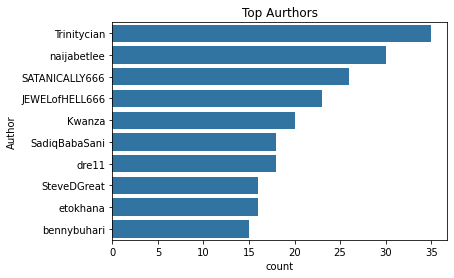

In [125]:
default_color = sb.color_palette()[0]
sb.barplot(data = top_authors.sort_values(by=['title'], ascending=False)[:10], y='author', x='title', color = default_color)
x_y_t('count', 'Author', 'Top Aurthors')

In [232]:
# most viewed topics 
atiku.sort_values(by=['views'], ascending=False)[:10]

,title,link,author,posts,views,time,title_clean
4227,peter obi knelt down to greet atiku at nba con...,https://www.nairaland.com//7294792/peter-obi-k...,envoymedia,345,95901,5:36pm,"[peter, obi, knelt, greet, nba, conference, ph..."
4683,"just landed in gombe, is this a wedding or ral...",https://www.nairaland.com//7361260/just-landed...,politicoNG,225,92088,10:02am,"[landed, gombe, wedding, rally, asks]"
29335,atiku to pay ₦5 million for using trader's pic...,https://www.nairaland.com//5823089/atiku-pay-5...,nairavsdollars,140,82479,9:53pm,"[pay, 5, million, using, traders, picture, wit..."
12533,this picture shows the age difference between ...,https://www.nairaland.com//7317359/picture-sho...,Africana1123,309,74362,1:50pm,"[picture, shows, age, difference, tinubu]"
27045,"peter obi's supporter displays gun, threatens ...",https://www.nairaland.com//7221565/peter-obis-...,Biodun556,482,73115,2:47am,"[peter, obis, supporter, displays, gun, threat..."
16863,atiku's 'country home in dubai' - dino melaye ...,https://www.nairaland.com//7291149/atikus-coun...,nlfpmod,139,67727,9:25am,"[country, home, dubai, dino, melaye, shares, p..."
26529,moment wike bowed for atiku at the 2023 pdp pr...,https://www.nairaland.com//7151232/moment-wike...,onthehill,147,66800,12:44pm,"[moment, wike, bowed, 2023, pdp, primary, elec..."
20759,"atiku, pdp considering two governors as vice p...",https://www.nairaland.com//7153868/atiku-pdp-c...,Islie,248,66217,7:08am,"[pdp, considering, two, governors, vice, presi..."
7360,73-year-old woman challenges tinubu and atiku ...,https://www.nairaland.com//7350213/73-year-old...,StagethemTVee,247,65330,9:51pm,"[73yearold, woman, challenges, tinubu, walk, a..."
216,energetic atiku arrives france (pictures),https://www.nairaland.com//7389697/energetic-a...,ochejoseph,173,63936,12:03pm,"[energetic, arrives, france, pictures]"


In [233]:
# most engaged topic
atiku.sort_values(by=['posts'], ascending=False)[:10]

,title,link,author,posts,views,time,title_clean
27045,"peter obi's supporter displays gun, threatens ...",https://www.nairaland.com//7221565/peter-obis-...,Biodun556,482,73115,2:47am,"[peter, obis, supporter, displays, gun, threat..."
347,"atiku is a tribal jingoist, stole pdp ticket f...",https://www.nairaland.com//7386179/atiku-triba...,aminulive,403,32586,10:37pm,"[tribal, jingoist, stole, pdp, ticket, south, ..."
31726,fayose: why wike will not support atiku,https://www.nairaland.com//7203343/fayose-why-...,Move2,397,54316,4:46pm,"[fayose, wike, support]"
13060,"nigerian kids kneel down, beg grandpas tinubu ...",https://www.nairaland.com//7293488/nigerian-ki...,nlfpmod,375,48569,3:02pm,"[nigerian, kids, kneel, beg, grandpas, tinubu,..."
107,why i think atiku may win this election.,https://www.nairaland.com//7365004/why-think-a...,FatherOfJesus,370,31146,5:50pm,"[think, may, win, election]"
10419,"make nigeria 3 regions; make atiku, tinubu, ob...",https://www.nairaland.com//7174257/make-nigeri...,TMSMedia,368,36760,4:15pm,"[make, nigeria, 3, regions, make, tinubu, obi,..."
4227,peter obi knelt down to greet atiku at nba con...,https://www.nairaland.com//7294792/peter-obi-k...,envoymedia,345,95901,5:36pm,"[peter, obi, knelt, greet, nba, conference, ph..."
30279,pdp loyalist misleading peter obi to help atik...,https://www.nairaland.com//7212068/pdp-loyalis...,APCNGN,341,32253,10:29am,"[pdp, loyalist, misleading, peter, obi, help, ..."
16218,"nba conference: lawyer hails peter obi, atiku....",https://www.nairaland.com//7294320/nba-confere...,JEWELofHELL666,338,59182,4:39pm,"[nba, conference, lawyer, hails, peter, obi, s..."
21970,atiku: it will be a miracle for peter obi to w...,https://www.nairaland.com//7241052/atiku-it-mi...,fergie001,329,36617,10:00pm,"[miracle, peter, obi, win, lp, social, media, ..."


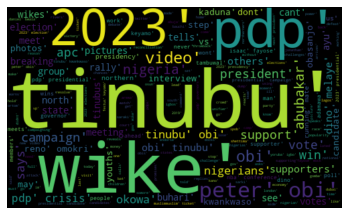

In [234]:
# word cloud

allWords = ' '.join([str(topics) for topics in atiku['title_clean']])
wordCloud=WordCloud(width = 500, height=300,max_font_size=119).generate(allWords)

plt.imshow(wordCloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [127]:
#Create a function to get the subjectivity
def getSubjectivity(text):
    return TextBlob(text).sentiment.subjectivity

#Create a function to get the polarity
def getPolarity(text):
    return TextBlob(text).sentiment.polarity

#Create two new columns
atiku['subjectivity']=atiku['title_clean'].apply(lambda x: getSubjectivity(' '.join(x)))
atiku['polarity']=atiku['title_clean'].apply(lambda x: getPolarity(' '.join(x)))

<ipython-input-127-13df22dbc8db>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  atiku['subjectivity']=atiku['title_clean'].apply(lambda x: getSubjectivity(' '.join(x)))
<ipython-input-127-13df22dbc8db>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  atiku['polarity']=atiku['title_clean'].apply(lambda x: getPolarity(' '.join(x)))


In [128]:
def get_text_sentiment(score): 
    '''Utility function to classify sentiment of passed tweet using textblob's sentiment method'''
    # create TextBlob object of passed tweet text 
   # analysis = TextBlob(tweet) 
    
    # set sentiment 
    if score > 0:
        return 'positive'
    elif score == 0: 
        return 'neutral'
    else: 
        return 'negative'
    
atiku['sentiment'] = atiku['polarity'].apply(get_text_sentiment)

<ipython-input-128-694ef0ba79c1>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  atiku['sentiment'] = atiku['polarity'].apply(get_text_sentiment)


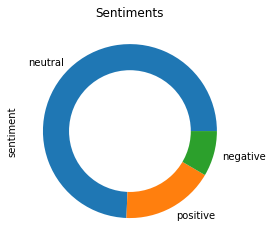

In [129]:
# Pie Chart
atiku['sentiment'].value_counts().plot(kind='pie')
  
# draw circle
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
fig = plt.gcf()
  
# Adding Circle in Pie chart
fig.gca().add_artist(centre_circle)
  
# Adding Title of chart
plt.title('Sentiments')
  
# Displaying Chart
plt.show()

### Bola Ahmed Tinubu

In [130]:
tinubu=copy[copy['title'].str.contains("tinubu")]


In [131]:
#clean the title

#Create a function to clean the title

def cleanTxt(text):
    
    #Remove keyword
    text=re.sub(r'tinubu', '', text) 
    #Remove punctuations
    text=re.sub(r'[^\w\s]', '', text)
    
    return text

tinubu['title_clean']=tinubu['title'].apply(cleanTxt)

<ipython-input-131-ed81d8270505>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tinubu['title_clean']=tinubu['title'].apply(cleanTxt)


In [132]:
#tokenize 
tinubu['title_clean'] = tinubu.apply(lambda row: nltk.word_tokenize(row['title_clean']), axis=1)

<ipython-input-132-fa741b9aed86>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tinubu['title_clean'] = tinubu.apply(lambda row: nltk.word_tokenize(row['title_clean']), axis=1)


In [133]:
#stop words 
stop = stopwords.words('english')

tinubu['title_clean'] = tinubu['title_clean'].apply(lambda x: [item for item in x if item not in stop])

<ipython-input-133-56d0ac3f305c>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tinubu['title_clean'] = tinubu['title_clean'].apply(lambda x: [item for item in x if item not in stop])


In [134]:
tinubu

,title,link,author,posts,views,time,title_clean
19,"atiku, tinubu, el rufai, others make list of m...",https://www.nairaland.com//7391745/atiku-tinub...,Pauldollars,14,612,5:18am,"[atiku, el, rufai, others, make, list, corrupt..."
33,2023: how i plan to fight corruption – tinubu,https://www.nairaland.com//7390328/2023-how-pl...,Racoon,155,18581,2:12am,"[2023, plan, fight, corruption]"
38,fmr. kenya president uhuru kenyatta takes a su...,https://www.nairaland.com//7391443/fmr-kenya-p...,Afikoo,35,1925,12:59am,"[fmr, kenya, president, uhuru, kenyatta, takes..."
49,a man ready to donate his office for tinubu ca...,https://www.nairaland.com//7391723/man-ready-d...,Doriwhally,2,227,10:19pm,"[man, ready, donate, office, campaign, office,..."
53,2023: lagos can president denies endorsing t...,https://www.nairaland.com//7389029/2023-lagos-...,pinkPUSSY,94,15876,10:08pm,"[2023, lagos, president, denies, endorsing]"
...,...,...,...,...,...,...,...
32370,tinubu supporters uses tribalism and extremist...,https://www.nairaland.com//7204964/tinubu-supp...,oilykid,37,748,9:41am,"[supporters, uses, tribalism, extremists, thre..."
32372,tinubu's campaign dg hails peter obi's humility,https://www.nairaland.com//7205242/tinubus-cam...,foryourmindok,15,909,9:38am,"[campaign, dg, hails, peter, obis, humility]"
32373,tinubu is sick and cannot be president - kperogi,https://www.nairaland.com//7110441/tinubu-sick...,powerfulguy,191,43474,9:34am,"[sick, president, kperogi]"
32376,you can get evidence from chicago but not from...,https://www.nairaland.com//7205389/get-evidenc...,Oleys,14,789,9:30am,"[get, evidence, chicago, ibadan, lere, olayinka]"


In [254]:
# top authors 
# topics per day 
# word cloud
# most viewed topics 
# most engaged topic

In [255]:
#Numbers 
topics=tinubu.shape[0]
views=sum(tinubu['views'])
post=sum(tinubu['posts'])

print('Number of topics = ' ,topics)
print('Number of views = ',views)
print('Number of post = ' ,post)

Number of topics =  5165
Number of views =  28776515
Number of post =  235998


In [135]:
#top authors
top_authors = tinubu.groupby([tinubu['author']])['title'].count()
top_authors=top_authors.reset_index()

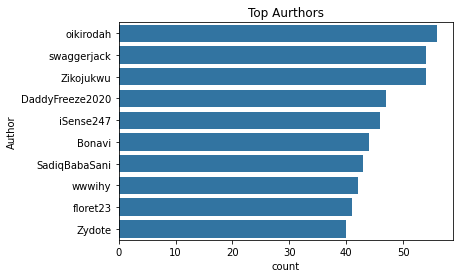

In [136]:
default_color = sb.color_palette()[0]
sb.barplot(data = top_authors.sort_values(by=['title'], ascending=False)[:10], y='author', x='title', color = default_color)
x_y_t('count', 'Author', 'Top Aurthors')

In [258]:
# most viewed topics 
tinubu.sort_values(by=['views'], ascending=False)[:10]

,title,link,author,posts,views,time,title_clean
21830,"abiola, oba oyekan at the crowning of tinubu a...",https://www.nairaland.com//5843148/abiola-oba-...,sarrki,339,99477,12:29pm,"[abiola, oba, oyekan, crowning, asiwaju, lagos..."
26343,"portable mocks apc, tinubu after oyetola’s los...",https://www.nairaland.com//7232873/portable-mo...,Marel3d,471,98024,3:05am,"[portable, mocks, apc, oyetolas, loss, paid, s..."
17518,when obasanjo met peter obi vs when obasanjo m...,https://www.nairaland.com//7286211/when-obasan...,NaijaRoyalty,313,92167,5:06pm,"[obasanjo, met, peter, obi, vs, obasanjo, met,..."
12979,tinubu-shettima bishop almost lynched at dei d...,https://www.nairaland.com//7291033/tinubu-shet...,Whiteangel1234,333,84359,9:13pm,"[shettima, bishop, almost, lynched, dei, dei, ..."
21937,nollywood actors meet bola tinubu (photo),https://www.nairaland.com//7241618/nollywood-a...,wwwihy,262,80023,2:39am,"[nollywood, actors, meet, bola, photo]"
3842,i am not dead & have not withdrawn from the pr...,https://www.nairaland.com//7363435/not-dead-no...,nlfpmod,494,79439,6:20am,"[dead, withdrawn, presidential, campaign]"
18911,tinubu supporters rock emilokan and jagaban ha...,https://www.nairaland.com//7274431/tinubu-supp...,Deltawarri,145,77400,10:32pm,"[supporters, rock, emilokan, jagaban, haircuts..."
8136,tinubu sleeps off at gombe emir’s palace durin...,https://www.nairaland.com//7338864/tinubu-slee...,envoymedia,394,75771,12:34am,"[sleeps, gombe, emirs, palace, meeting, photos..."
24092,seyi tinubu’s n340 million richard mille wrist...,https://www.nairaland.com//7235925/seyi-tinubu...,SATANICALLY666,300,74814,4:20pm,"[seyi, n340, million, richard, mille, wristwat..."
14808,2023: tinubu reacts as buhari reveals candidat...,https://www.nairaland.com//7303448/2023-tinubu...,Odewaleadesoye,166,74650,9:57pm,"[2023, reacts, buhari, reveals, candidates, su..."


In [259]:
# most engaged topic
tinubu.sort_values(by=['posts'], ascending=False)[:10]

,title,link,author,posts,views,time,title_clean
26717,kashim shettima confirmed as tinubu’s running ...,https://www.nairaland.com//7220672/kashim-shet...,phemmyjohnson,722,63012,8:24pm,"[kashim, shettima, confirmed, running, mate, v..."
7947,“i cannot be a yoruba boy and vote for igbo” -...,https://www.nairaland.com//7328753/cannot-yoru...,ebukajay184,664,44238,4:04pm,"[yoruba, boy, vote, igbo, prophet, oladele, su..."
27436,tinubu confirms kashim shettima as his running...,https://www.nairaland.com//7220878/tinubu-conf...,Lanrelagboi,640,55963,7:33am,"[confirms, kashim, shettima, running, mate]"
26566,"tinubu: until we have a good credit system, we...",https://www.nairaland.com//7207755/tinubu-unti...,trutharena,605,34955,10:50am,"[good, credit, system, cant, conquer, corruption]"
11342,we need to see photos of tinubu commissioning ...,https://www.nairaland.com//7311983/need-see-ph...,BluntCrazeMan,586,43860,8:28am,"[need, see, photos, commissioning, projects, 1..."
28743,"tinubu: without me, buhari would have lost in ...",https://www.nairaland.com//7158466/tinubu-with...,SATANICALLY666,560,60742,1:00pm,"[without, buhari, would, lost, 2015]"
12440,"tee mac: tinubu is my in-law, he’s 86, not fit...",https://www.nairaland.com//7250616/tee-mac-tin...,Okobola146,500,67023,8:28pm,"[tee, mac, inlaw, hes, 86, fit, run, nigeria]"
3842,i am not dead & have not withdrawn from the pr...,https://www.nairaland.com//7363435/not-dead-no...,nlfpmod,494,79439,6:20am,"[dead, withdrawn, presidential, campaign]"
31054,‘is evans a herdsman?’ — tinubu speaks on murd...,https://www.nairaland.com//5300708/evans-herds...,Ebullience,492,56707,9:29pm,"[evans, herdsman, speaks, murder, fasorantis, ..."
22571,tinubu has chosen his running mate – campaign ...,https://www.nairaland.com//7220242/tinubu-chos...,vicdom,489,43425,1:19am,"[chosen, running, mate, campaign, team]"


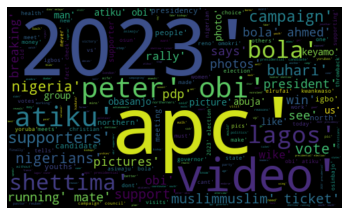

In [260]:
# word cloud

allWords = ' '.join([str(topics) for topics in tinubu['title_clean']])
wordCloud=WordCloud(width = 500, height=300,max_font_size=119).generate(allWords)

plt.imshow(wordCloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [137]:
#Create a function to get the subjectivity
def getSubjectivity(text):
    return TextBlob(text).sentiment.subjectivity

#Create a function to get the polarity
def getPolarity(text):
    return TextBlob(text).sentiment.polarity

#Create two new columns
tinubu['subjectivity']=tinubu['title_clean'].apply(lambda x: getSubjectivity(' '.join(x)))
tinubu['polarity']=tinubu['title_clean'].apply(lambda x: getPolarity(' '.join(x)))

<ipython-input-137-1890ce654ab2>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tinubu['subjectivity']=tinubu['title_clean'].apply(lambda x: getSubjectivity(' '.join(x)))
<ipython-input-137-1890ce654ab2>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tinubu['polarity']=tinubu['title_clean'].apply(lambda x: getPolarity(' '.join(x)))


In [138]:
def get_text_sentiment(score): 
    '''Utility function to classify sentiment of passed tweet using textblob's sentiment method'''
    # create TextBlob object of passed tweet text 
   # analysis = TextBlob(tweet) 
    
    # set sentiment 
    if score > 0:
        return 'positive'
    elif score == 0: 
        return 'neutral'
    else: 
        return 'negative'
    
tinubu['sentiment'] = tinubu['polarity'].apply(get_text_sentiment)

<ipython-input-138-720bb9e75e8a>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tinubu['sentiment'] = tinubu['polarity'].apply(get_text_sentiment)


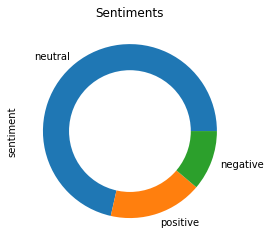

In [139]:
# Pie Chart
tinubu['sentiment'].value_counts().plot(kind='pie')
  
# draw circle
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
fig = plt.gcf()
  
# Adding Circle in Pie chart
fig.gca().add_artist(centre_circle)
  
# Adding Title of chart
plt.title('Sentiments')
  
# Displaying Chart
plt.show()

### Peter Obi

In [143]:
#clean the title

#Create a function to clean the title

def cleanTxt(text):
    
    #Remove keyword
    text=re.sub(r'obi', '', text) 
    #Remove punctuations
    text=re.sub(r'[^\w\s]', '', text)
    
    return text

obi['title_clean']=obi['title'].apply(cleanTxt)

<ipython-input-143-7610ca67ba5c>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  obi['title_clean']=obi['title'].apply(cleanTxt)


In [144]:
#tokenize 
obi['title_clean'] = obi.apply(lambda row: nltk.word_tokenize(row['title_clean']), axis=1)

<ipython-input-144-b3238587a4f1>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  obi['title_clean'] = obi.apply(lambda row: nltk.word_tokenize(row['title_clean']), axis=1)


In [145]:
#stop words 
stop = stopwords.words('english')

obi['title_clean'] = obi['title_clean'].apply(lambda x: [item for item in x if item not in stop])

<ipython-input-145-a4becafa0b1a>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  obi['title_clean'] = obi['title_clean'].apply(lambda x: [item for item in x if item not in stop])


In [146]:
obi

,title,link,author,posts,views,time,title_clean
5,labour party brags with high-profile peter obi...,https://www.nairaland.com//7387447/labour-part...,dumahi,23,808,6:58am,"[labour, party, brags, highprofile, peter, end..."
13,"peter obi: the hypocrisy of ""go and verify""",https://www.nairaland.com//7391797/peter-obi-h...,N3TRAL,17,367,5:41am,"[peter, hypocrisy, go, verify]"
16,aisha yesufu and david hundeyin fight dirty ov...,https://www.nairaland.com//7385066/aisha-yesuf...,blamingthedevil,194,51953,5:37am,"[aisha, yesufu, david, hundeyin, fight, dirty,..."
20,peter obi will win for god resists the proud a...,https://www.nairaland.com//7391756/peter-obi-w...,Ceenaija,6,208,5:15am,"[peter, win, god, resists, proud, give, grace,..."
22,little child stares at peter obi's posters in ...,https://www.nairaland.com//7389793/little-chil...,XerXers,115,52269,4:39am,"[little, child, stares, peter, posters, taraba..."
...,...,...,...,...,...,...,...
32372,tinubu's campaign dg hails peter obi's humility,https://www.nairaland.com//7205242/tinubus-cam...,foryourmindok,15,909,9:38am,"[tinubus, campaign, dg, hails, peter, humility]"
32379,throwback photos of peter obi trekking to his ...,https://www.nairaland.com//7187158/throwback-p...,Islandlady,332,69063,9:20am,"[throwback, photos, peter, trekking, home, lagos]"
32383,"arewa for peter obi to launch at arewa house, ...",https://www.nairaland.com//7204921/arewa-peter...,Penguin2,36,2005,9:11am,"[arewa, peter, launch, arewa, house, kaduna, j..."
32392,the reason tinubu supporters hate peter obi,https://www.nairaland.com//7197270/reason-tinu...,floss,30,796,8:44am,"[reason, tinubu, supporters, hate, peter]"


In [147]:
# top authors 
# topics per day 
# word cloud
# most viewed topics 
# most engaged topic

In [268]:
#Numbers 
topics=obi.shape[0]
views=sum(obi['views'])
post=sum(obi['posts'])

print('Number of topics = ' ,topics)
print('Number of views = ',views)
print('Number of post = ' ,post)

Number of topics =  6707
Number of views =  29747203
Number of post =  259153


In [148]:
#top authors
top_authors = obi.groupby([obi['author']])['title'].count()
top_authors=top_authors.reset_index()

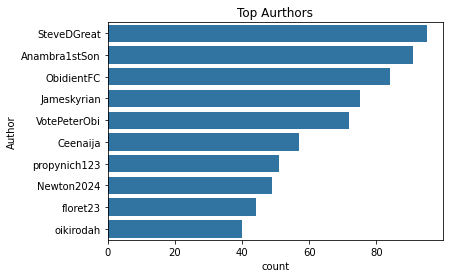

In [149]:
default_color = sb.color_palette()[0]
sb.barplot(data = top_authors.sort_values(by=['title'], ascending=False)[:10], y='author', x='title', color = default_color)
x_y_t('count', 'Author', 'Top Aurthors')

In [271]:
# most viewed topics 
obi.sort_values(by=['views'], ascending=False)[:10]

,title,link,author,posts,views,time,title_clean
4227,peter obi knelt down to greet atiku at nba con...,https://www.nairaland.com//7294792/peter-obi-k...,envoymedia,345,95901,5:36pm,"[peter, knelt, greet, atiku, nba, conference, ..."
17518,when obasanjo met peter obi vs when obasanjo m...,https://www.nairaland.com//7286211/when-obasan...,NaijaRoyalty,313,92167,5:06pm,"[obasanjo, met, peter, vs, obasanjo, met, tinu..."
14772,moment soludo tried to open car door for peter...,https://www.nairaland.com//7291574/moment-solu...,joy4news,217,90643,5:27am,"[moment, soludo, tried, open, car, door, peter]"
30943,"after what i saw today, peter obi should not b...",https://www.nairaland.com//7197570/after-what-...,FullBlastLight,368,85285,9:03am,"[saw, today, peter, border, campaign, edo, nyan]"
6001,"jagaban: ""we know the man is not well"" - peter...",https://www.nairaland.com//7327734/jagaban-kno...,fergie001,510,84943,11:06am,"[jagaban, know, man, well, peter, says, leaks,..."
12350,the moment ebelechukwu obiano called bianca oj...,https://www.nairaland.com//7034519/moment-ebel...,lalasticlala,219,84921,8:13am,"[moment, ebelechukwu, ano, called, bianca, oju..."
5215,dss arrests a coordinator of peter obi's rally...,https://www.nairaland.com//7361700/dss-arrests...,nlfpmod,199,83575,2:41pm,"[dss, arrests, coordinator, peter, rally, fran..."
8380,peter obi visits bishop oyedepo. sparks reacti...,https://www.nairaland.com//7238526/peter-obi-v...,LIVE08,248,82905,8:35am,"[peter, visits, bishop, oyedepo, sparks, react..."
627,caption sanusi's facial expression while meeti...,https://www.nairaland.com//7385835/caption-san...,OkutaNla,300,80659,4:47am,"[caption, sanusis, facial, expression, meeting..."
4680,dog joins peter obi rally to ward off bats in ...,https://www.nairaland.com//7361547/dog-joins-p...,SATANICALLY666,179,76061,10:03am,"[dog, joins, peter, rally, ward, bats, lagos, ..."


In [272]:
# most engaged topic
obi.sort_values(by=['posts'], ascending=False)[:10]

,title,link,author,posts,views,time,title_clean
8952,lagos govt tackles peter obi over false claim ...,https://www.nairaland.com//7281168/lagos-govt-...,Yoruba1stson,537,42574,4:03am,"[lagos, govt, tackles, peter, false, claim, as..."
10058,2023: revolution awaits if peter obi doesn’t w...,https://www.nairaland.com//7326684/2023-revolu...,dominic17,527,37164,9:46pm,"[2023, revolution, awaits, peter, doesnt, win,..."
18317,can infrastructure drive an economy? fashola c...,https://www.nairaland.com//7208125/infrastruct...,LifestyleTonite,513,38994,8:07pm,"[infrastructure, drive, economy, fashola, coun..."
6001,"jagaban: ""we know the man is not well"" - peter...",https://www.nairaland.com//7327734/jagaban-kno...,fergie001,510,84943,11:06am,"[jagaban, know, man, well, peter, says, leaks,..."
9964,"peter obi: i'll stop campaigning, if anyone pr...",https://www.nairaland.com//7324276/peter-obi-i...,EBMedia,496,25821,8:32am,"[peter, ill, stop, campaigning, anyone, proves..."
26056,shettima: nigeria is too big for peter obi to ...,https://www.nairaland.com//7229779/shettima-ni...,Omicronvaccine,492,41016,4:10am,"[shettima, nigeria, big, peter, handle]"
27045,"peter obi's supporter displays gun, threatens ...",https://www.nairaland.com//7221565/peter-obis-...,Biodun556,482,73115,2:47am,"[peter, supporter, displays, gun, threatens, w..."
2577,peter obi: we will remove import & forex restr...,https://www.nairaland.com//7370019/peter-obi-r...,nlfpmod,482,29307,5:12pm,"[peter, remove, import, forex, restrictions]"
3277,some projects done by peter obi when he was go...,https://www.nairaland.com//7313723/some-projec...,Anambra1stSon,465,40056,10:56am,"[projects, done, peter, governor, anambra, state]"
18391,peter obi's billboard at taraba city gate pull...,https://www.nairaland.com//7276147/peter-obis-...,Biodun556,461,71797,3:41pm,"[peter, billboard, taraba, city, gate, pulled,..."


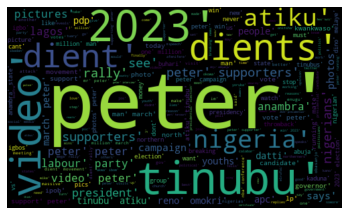

In [273]:
# word cloud

allWords = ' '.join([str(topics) for topics in obi['title_clean']])
wordCloud=WordCloud(width = 500, height=300,max_font_size=119).generate(allWords)

plt.imshow(wordCloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [150]:
#Create a function to get the subjectivity
def getSubjectivity(text):
    return TextBlob(text).sentiment.subjectivity

#Create a function to get the polarity
def getPolarity(text):
    return TextBlob(text).sentiment.polarity

#Create two new columns
obi['subjectivity']=obi['title_clean'].apply(lambda x: getSubjectivity(' '.join(x)))
obi['polarity']=obi['title_clean'].apply(lambda x: getPolarity(' '.join(x)))

<ipython-input-150-fc49f91e95ff>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  obi['subjectivity']=obi['title_clean'].apply(lambda x: getSubjectivity(' '.join(x)))
<ipython-input-150-fc49f91e95ff>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  obi['polarity']=obi['title_clean'].apply(lambda x: getPolarity(' '.join(x)))


In [151]:
def get_text_sentiment(score): 
    '''Utility function to classify sentiment of passed tweet using textblob's sentiment method'''
    # create TextBlob object of passed tweet text 
   # analysis = TextBlob(tweet) 
    
    # set sentiment 
    if score > 0:
        return 'positive'
    elif score == 0: 
        return 'neutral'
    else: 
        return 'negative'
    
obi['sentiment'] = obi['polarity'].apply(get_text_sentiment)

<ipython-input-151-4b31553ae60a>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  obi['sentiment'] = obi['polarity'].apply(get_text_sentiment)


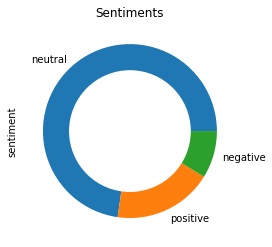

In [152]:
# Pie Chart
obi['sentiment'].value_counts().plot(kind='pie')
  
# draw circle
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
fig = plt.gcf()
  
# Adding Circle in Pie chart
fig.gca().add_artist(centre_circle)
  
# Adding Title of chart
plt.title('Sentiments')
  
# Displaying Chart
plt.show()

## Google Trends Analysis <a class="anchor" id="chapter5"></a>

### Nigeria Trend <a class="anchor" id="section_5_1"></a>

While the seacrh for Bola Ahmed Tinubu and Peter obi is generally more than Atiku Abubakar. Bola Ahmed Tinubu is slightly higer than Peter Obi peaking on the 17th of July and covering more states.

In [474]:
nigeria_interest = pd.read_excel('nigeria_trend.xlsx', sheet_name='INTEREST')
nigeria_geo = pd.read_excel('nigeria_trend.xlsx', sheet_name='GEO')
query_bat = pd.read_excel('nigeria_trend.xlsx', sheet_name='BAT')
query_atiku = pd.read_excel('nigeria_trend.xlsx', sheet_name='ATIKU')
query_obi = pd.read_excel('nigeria_trend.xlsx', sheet_name='OBI')

In [476]:
nigeria_interest

,Day,Peter Obi: (Nigeria),Bola Ahmed Tinubu: (Nigeria),Atiku Abubakar: (Nigeria)
0,2022-07-01,41,54,28
1,2022-07-02,44,67,34
2,2022-07-03,56,60,33
3,2022-07-04,54,53,15
4,2022-07-05,48,65,25
...,...,...,...,...
106,2022-10-15,32,29,21
107,2022-10-16,23,28,19
108,2022-10-17,31,32,38
109,2022-10-18,42,41,35


In [477]:
nigeria_geo

,State,Obi,Bat,Atiku
0,Adamawa,0.15,0.28,0.57
1,Ebonyi State,0.61,0.21,0.18
2,Anambra,0.61,0.27,0.12
3,Abia,0.63,0.23,0.14
4,Cross River,0.51,0.32,0.17
5,Gombe,0.21,0.35,0.44
6,Kebbi,0.20,0.31,0.49
7,Yobe,NaN,0.41,0.59
8,Enugu,0.62,0.25,0.13
9,Benue,0.36,0.46,0.18


In [478]:
query_bat

,TOP,Unnamed: 1
0,tinubu,100
1,bola,15
2,bola tinubu,15
3,tinubu news,11
4,atiku,10
5,atiku tinubu,10
6,obi,7
7,ahmed tinubu,7
8,peter obi,6
9,ahmed bola tinubu,6


In [479]:
query_atiku

,TOP,Unnamed: 1
0,atiku,100
1,atiku abubakar,28
2,tinubu,18
3,atiku tinubu,18
4,atiku news,11
5,wike,10
6,obi,10
7,wike atiku,10
8,peter obi,8
9,pdp,7


In [480]:
query_obi

,TOP,Unnamed: 1
0,peter,100
1,obi,96
2,peter obi,96
3,peter obi news,11
4,peter obi nigeria,6
5,tinubu,6
6,peter obi running mate,5
7,atiku,4
8,anambra,4
9,who is peter obi,3


### Global Trend <a class="anchor" id="section_5_2"></a>

Global search saw Peter obi dominate more countries, however the numbers are still close between Peter Obi and Bola Ahmed Tinubu.

In [481]:
global_interest = pd.read_excel('world_trend.xlsx', sheet_name='INTEREST')
global_geo = pd.read_excel('world_trend.xlsx', sheet_name='GEO')
global_query_bat = pd.read_excel('world_trend.xlsx', sheet_name='BAT')
global_query_atiku = pd.read_excel('world_trend.xlsx', sheet_name='ATIKU')
global_query_obi = pd.read_excel('world_trend.xlsx', sheet_name='OBI')

In [482]:
global_interest

,Day,Peter Obi: (Worldwide),Bola Ahmed Tinubu: (Worldwide),Atiku Abubakar: (Worldwide)
0,2022-07-01,38,57,23
1,2022-07-02,47,63,32
2,2022-07-03,56,50,29
3,2022-07-04,54,47,13
4,2022-07-05,52,60,21
...,...,...,...,...
106,2022-10-15,29,30,21
107,2022-10-16,30,28,20
108,2022-10-17,31,29,37
109,2022-10-18,48,42,31


In [483]:
global_geo 

,Country,Peter Obi: (01/07/2022 - 19/10/2022),Bola Ahmed Tinubu: (01/07/2022 - 19/10/2022),Atiku Abubakar: (01/07/2022 - 19/10/2022)
0,Nigeria,0.37,0.41,0.22
1,Equatorial Guinea,NaN,NaN,NaN
2,Sierra Leone,NaN,NaN,NaN
3,Benin,0.43,0.43,0.14
4,Gambia,NaN,NaN,NaN
...,...,...,...,...
245,Vanuatu,NaN,NaN,NaN
246,Wallis & Futuna,NaN,NaN,NaN
247,Samoa,NaN,NaN,NaN
248,Kosovo,NaN,NaN,NaN


In [487]:
global_query_bat[:10]

,TOP,Unnamed: 1
0,tinubu,100
1,bola,15
2,bola tinubu,14
3,tinubu news,10
4,atiku,9
5,atiku tinubu,9
6,nigeria,7
7,obi,7
8,ahmed tinubu,7
9,peter obi,5


In [488]:
global_query_atiku[:10]

,TOP,Unnamed: 1
0,atiku,100
1,abubakar atiku,27
2,tinubu,17
3,atiku tinubu,17
4,atiku news,10
5,obi,10
6,wike,10
7,wike atiku,9
8,peter obi,8
9,nigeria,8


In [489]:
global_query_obi[:10]

,TOP,Unnamed: 1
0,peter,100
1,peter obi,98
2,obi,97
3,peter obi news,11
4,nigeria,7
5,peter obi nigeria,7
6,tinubu,5
7,peter obi running mate,5
8,atiku,4
9,anambra,4


## Conclusion <a class="anchor" id="chapter6"></a>

### Historical data <a class="anchor" id="section_6_1"></a>
> While the decline of vote turn out has been across all regions in the country, the southern regions have experienced the biggest relative drop from 2003 to 2019. South east dropped from 66% in 2003 to 24% 2019 , South south 87% to 30% and the South west from 57% to 32%

### Twitter <a class="anchor" id="section_6_2"></a>
> It's quite significant that Peter obi is the most talked about candidate in the twitter space, however engagements from north east and north western states is minimal as these states do not feature in his top 10 location.

### Nairaland
> Again, there are more topics, engagements and views relating to Peter Obi than Bola Ahmed Tinubu and Atiku Abubakar, however the differences is quite close between Peter Obi and Bola Ahmed Tinubu

### Google Trend <a class="anchor" id="section_6_3"></a>
> Local search has seen Bola Ahmed Tinubu gathered more count compared to Peter Obi and Atiku Abubakar. He covers most searches from 17 states. However Global search has seen Peter Obi has the most searched candidates covering 10 countries.

### Time Range
> Asides the Historical Data, all data collected was between July 1st and October 19th 


### Country's Engagement<a class="anchor" id="section_6_4"></a>

> Discussion has attracted users for all candidates beyond the shores of Nigeria and has attracted other countries from various part of the world particulary in the United Kingdom and United States.


### Mentions, Active Tweeters and Authors<a class="anchor" id="section_6_5"></a>

> Top mentions and most active twitters does not necessarily connote support for such candidate. For Instance Reno omokri had the highest mention for Peter Obi, yet he supports Atiku Abubakar, Similarly daclemx had the 2nd highest tweet containing batified, yet he supports Peter Obi.

> Top authors in the nairaland section does not translate to support for such candidate. For example swaggerjack and Zikojukwu feature in the top 10 authors for Tinubu, but they are not supporters. 